In [1]:
import numpy as np
import time
import os
import pandas as pd
import matplotlib.pyplot as plt

import cv2

import json
from urllib import request, parse

from PIL import Image
from matplotlib.patches import Ellipse, Circle

In [ ]:
# 原图 
# 10度

# 中心

# 标准 
# 放大 
# 缩小

# 原位 
# 左上 
# 右上 
# 左下 
# 右下

# 原图 
# 镜像

# 总数量 
# 2352=60 
# 统一最后大小300100

# 参数 
# image, xy=(x,y), zoom, offset

In [2]:
EYE_W = 40
EYE_H = 30
def getImage(imageFilePath):
    image = Image.open(imageFilePath)
    return image
def getFlag4Json(jsonFilePath):
    f = open(jsonFilePath, encoding='utf-8-sig')#注意需要设置格式     
    jsonData = json.load(f)
    face_rect = jsonData['face_rect']#脸位置大小 x y w h
    iris = jsonData['iris']#瞳孔位置半径 right:x y r left:x y r 注意是第一人称
    landmark = jsonData['landmark']#特征点坐标 眼部 24*2~32*2，眼角位置依次是：0 - 1 | 16 - 17
    flag = {
        'RAX':landmark[2*24+0*2],
        'RAY':landmark[2*24+0*2+1],
        'ROX':iris[0],
        'ROY':iris[1],
        'RBX':landmark[2*24+1*2],
        'RBY':landmark[2*24+1*2+1],
        'RUX':landmark[2*24+5*2],
        'RUY':landmark[2*24+5*2+1],
        'RDX':landmark[2*24+12*2],
        'RDY':landmark[2*24+12*2+1],
        
        'LAX':landmark[2*24+(1+16)*2],
        'LAY':landmark[2*24+(1+16)*2+1],
        'LOX':iris[3],
        'LOY':iris[4],
        'LBX':landmark[2*24+16*2],
        'LBY':landmark[2*24+16*2+1],
        'LUX':landmark[2*24+(5+16)*2],
        'LUY':landmark[2*24+(5+16)*2+1],
        'LDX':landmark[2*24+(12+16)*2],
        'LDY':landmark[2*24+(12+16)*2+1],
    }
    return flag#,face_rect, iris, landmark,jsonData
def getFace4Image(imageFilePath):
#     image = Image.open(imageFilePath)
    image  = cv2.imread(imageFilePath, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    g = Image.fromarray(cv2.cvtColor(gray,cv2.COLOR_GRAY2RGB))
    faceCascade = cv2.CascadeClassifier('../model/haarcascade_frontalface_default.xml')
    faces = faceCascade.detectMultiScale(image, 1.2,2, cv2.CASCADE_SCALE_IMAGE,minSize=(100,100))
#     print('faceNum:', len(faces))
    x = 0
    y = 0
    w = 0
    h = 0
    if len(faces) > 0:
        size = 0
        max_id = 0
        for i in range(len(faces)):
            if size < faces[i][2]:
                size = faces[i][2]
                max_id = i
        x = faces[max_id][0]
        y = faces[max_id][1]
        w = faces[max_id][2]
        h = faces[max_id][3]

    return x,y,w,h

def getEye4Image(imageFilePath):
#     image = Image.open(imageFilePath)
    image  = cv2.imread(imageFilePath, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    g = Image.fromarray(cv2.cvtColor(gray,cv2.COLOR_GRAY2RGB))
    faceCascade = cv2.CascadeClassifier('../model/haarcascade_frontalface_default.xml')
    faces = faceCascade.detectMultiScale(image, 1.1,2, cv2.CASCADE_SCALE_IMAGE,minSize=(100,100))
    xywh = []
    if len(faces) > 0:
        size = 0
        n = 0
        for i in range(len(faces)):
            if size < faces[i][2]:
                size = faces[i][2]
                n = i
        fx = faces[n][0]
        fy = faces[n][1]
        fw = faces[n][2]
        fh = faces[n][3]
        face = image[fy:fy+fh, fx:fx+fw]
        eyeCascade = cv2.CascadeClassifier('../model/haarcascade_lefteye_2splits.xml')
        eyes = eyeCascade.detectMultiScale(face, 1.2,2)
        print('eye:',len(eyes))
        if len(eyes) > 1:
            lr = 1024
            for i in range(len(eyes)):
                if lr > eyes[i][0]:
                    lr = eyes[i][0]
                    n = i
            w = eyes[n][2]
            h = eyes[n][3]
            x = fx + eyes[n][0]
            y = fy + eyes[n][1] + h/4
            h = h*3/4
            print(x, y, w, h)
            s = (x,y,w,h)
            xywh.append(s)
            lr = 0
            for i in range(len(eyes)):
                if lr < eyes[i][0]:
                    lr = eyes[i][0]
                    n = i
            w = eyes[n][2]
            h = eyes[n][3]
            x = fx + eyes[n][0]
            y = fy + eyes[n][1] + h/4
            h = h*3/4
            print(x, y, w, h)
            s = (x,y,w,h)
            xywh.append(s)
#             eye = g.crop((fx+x, fy+y, fx+x+w, fy+y+h))

        
#         w = w + (zoom[0]-EYE_W)
#         x = int(x + w/8) - (zoom[0]-EYE_W)/2
#         w = int(w - w/4)
#         h = h + (zoom[1]-EYE_H)
#         y = int(y + h/4) - (zoom[1]-EYE_H)/2
       
#         h = int(h/4)
#         eye = g.crop((x, y, x+w, y+h))
#         eye = eye.resize(zoom,Image.ANTIALIAS)
    return xywh #x, y, w, h

def displayImage(image):
    plt.axis('off')
    plt.figure(figsize=(6,2))
    ax = plt.subplot(121)
    plt.imshow(image)
    plt.show()
    
def displayEye(eye,x0,y0,w0,h0,zoom=(EYE_W,EYE_H),transpose=False):
#     print(s.size)
    print(w0, h0)
    plt.axis('off')
    ax = plt.subplot(121)
    
    plt.imshow(eye)
    xyc = ['RAX','RAY','yellow',
          'ROX','ROY','red',
          'RBX','RBY','blue',
          'RUX','RUY','green',
          'RDX','RDY','aqua',
          
#           'LAX','LAY','yellow',
#           'LOX','LOY','red',
#           'LBX','LBY','blue',
#           'LUX','LUY','green',
#           'LDX','LDY','aqua'
         ]
    print(transpose)
    if transpose == True:
        for i in range(2):
            x = flag[xyc[i*3]] - x0
            y = flag[xyc[i*3+1]] - y0
            x = x*zoom[0]/w0
            y = y*zoom[1]/h0
            plt.plot(x, y,'.',label='point',color=xyc[i*3+2])
    else :
        for i in range(5):
            x = flag[xyc[i*3]] - x0
            y = flag[xyc[i*3+1]] - y0
            x = x*zoom[0]/w0
            y = y*zoom[1]/h0
            plt.plot(x, y,'.',label='point',color=xyc[i*3+2])    
    plt.show()
    
def getEyeDataFlag(image, eye=(0,0,60,30), flag=None, zoom=1.0, offset=(0,0), lr = 0):
    

    
#     x = int(eye[0] + eye[2]/2.0 + 0.5 + offset[0])
#     y = int(eye[1] + eye[3]/2.0 + 0.5 + offset[1])
#     eyeH = int(eye[3]*zoom/4.0 + 0.5)
#     eyeW = int(eyeH*3 + 0.5)
    
#     eyeX = int(x-eyeW*3/8 + 0.5)
#     eyeY = int(y-eyeH + 0.5)

#     eyeImage = image.crop((eye[0], eye[1], eye[0]+eye[2], eye[1]+eye[3]))
#     displayImage(eyeImage)

    x = int(eye[0] + offset[0])
    y = int(eye[1] + offset[1])
    
#     eyeH = int(eye[2]*zoom/2.0 + 0.5)
#     eyeW = int(eyeH*2)
    
#     eyeX = int(x + 0.5)
#     eyeY = int(y+eyeH/4 + 0.5)
    eyeX = x
    eyeY = y
    
    eyeW = int(eye[2]*zoom + 0.5)
    eyeH = int(eyeW*3/4.0)
    
    eyeBox = (eyeX, eyeY, eyeX+eyeW, eyeY+eyeH)
    print('XY:', x, y)
    print('WH:', eye[2], eye[3])
    print('eyeXY:', eyeX, eyeY)
    print('eyeWH:', eyeW, eyeH)
    
#     img = cv2.cvtColor(np.asarray(image),cv2.COLOR_RGB2BGR)
#     img = cv2.GaussianBlur(img, (5,5), 1.5);
    img = Image.fromarray(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    eyeImage = img.crop(eyeBox)
    eyeImage = eyeImage.resize((EYE_W,EYE_H),Image.ANTIALIAS)
    if lr > 0:
        eyeImage = eyeImage.transpose(Image.FLIP_LEFT_RIGHT)
    eyeGray = eyeImage.convert('L')
    eyeGrayLA = eyeImage.convert('LA')
   
    
    plt.figure(figsize=(6,2))
    ax = plt.subplot(121)
    plt.imshow(eyeGrayLA)

    xyc = [
          'RAX','RAY','yellow',
          'ROX','ROY','red',
          'RBX','RBY','blue',
          'RUX','RUY','green',
          'RDX','RDY','aqua',
          
          'LAX','LAY','yellow',
          'LOX','LOY','red',
          'LBX','LBY','blue',
          'LUX','LUY','green',
          'LDX','LDY','aqua'
    ]
    if flag != None:
        eyeFlag = flag.copy()
        for i in range(5):
            px = flag[xyc[lr*15+i*3]] - eyeX
            py = flag[xyc[lr*15+i*3+1]] - eyeY
            px = px*EYE_W/eyeW
            if lr > 0:
                px = EYE_W - px
            py = py*EYE_H/eyeH
            eyeFlag[xyc[i*3]] = px
            eyeFlag[xyc[i*3+1]] = py
            plt.plot(int(px), int(py), '.', label='point', color=xyc[i*3+2])
    else:
        eyeFlag = None
    plt.show()

    return eyeGray, eyeFlag

def data2csv(data, labels):
    col = [
    'AX','AY',
    'OX','OY',
    'BX','BY',
    'UX','UY',
    'DX','DY',

#     'LAX','LAY',
#     'LOX','LOY',
#     'LBX','LBY',
#     'LUX','LUY',
#     'LDX','LDY',
    ]
    
    results = pd.DataFrame(labels, columns = col)
    results.insert(len(col), 'data', data)
    results.to_csv('../data/data-eye.csv', index=False)
    

In [3]:
data_list = []
label_list = []
data_list.clear()
label_list.clear()
rs = [
    '',
    '_r'
]
zooms = [
    0.9,
    1.0,
    1.1
]
offsets = [
    (-2,-2),
    (2,-2),
    (0,0),
    (-2,2),
    (2,2)
]

1  0.9 (-2, -2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 301 261
WH: 84 63.0
eyeXY: 301 261
eyeWH: 76 57


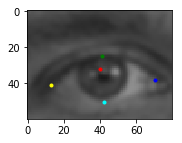

eyeGray: (80, 60)
XY: 441 255
WH: 75 56.25
eyeXY: 441 255
eyeWH: 68 51


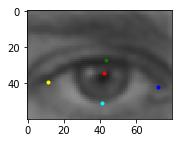

eyeGray: (80, 60)
2  0.9 (-2, -2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 252 205
WH: 75 56.25
eyeXY: 252 205
eyeWH: 68 51


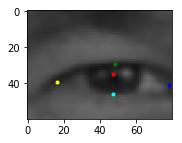

eyeGray: (80, 60)
XY: 389 215
WH: 69 51.75
eyeXY: 389 215
eyeWH: 62 46


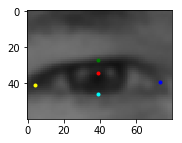

eyeGray: (80, 60)
3  0.9 (-2, -2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 266 212
WH: 66 49.5
eyeXY: 266 212
eyeWH: 59 44


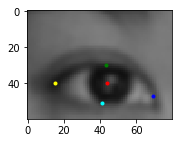

eyeGray: (80, 60)
XY: 367 218
WH: 63 47.25
eyeXY: 367 218
eyeWH: 57 42


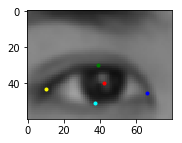

eyeGray: (80, 60)
4  0.9 (-2, -2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 266 223
WH: 65 48.75
eyeXY: 266 223
eyeWH: 59 44


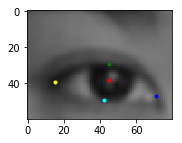

eyeGray: (80, 60)
XY: 371 231
WH: 63 47.25
eyeXY: 371 231
eyeWH: 57 42


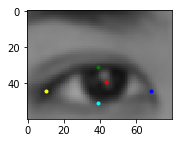

eyeGray: (80, 60)
5  0.9 (-2, -2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 253 201
WH: 88 66.0
eyeXY: 253 201
eyeWH: 79 59


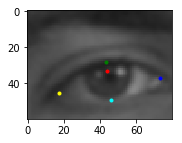

eyeGray: (80, 60)
XY: 401 199
WH: 89 66.75
eyeXY: 401 199
eyeWH: 80 60


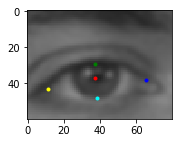

eyeGray: (80, 60)
6  0.9 (-2, -2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 307 260
WH: 60 45.0
eyeXY: 307 260
eyeWH: 54 40


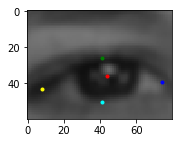

eyeGray: (80, 60)
XY: 419 253
WH: 65 48.75
eyeXY: 419 253
eyeWH: 59 44


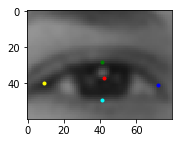

eyeGray: (80, 60)
7  0.9 (-2, -2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 323 253
WH: 62 46.5
eyeXY: 323 253
eyeWH: 56 42


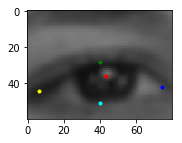

eyeGray: (80, 60)
XY: 436 249
WH: 65 48.75
eyeXY: 436 249
eyeWH: 59 44


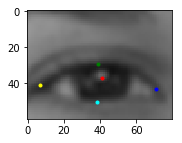

eyeGray: (80, 60)
8  0.9 (-2, -2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 323 221
WH: 59 44.25
eyeXY: 323 221
eyeWH: 53 39


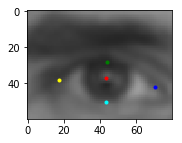

eyeGray: (80, 60)
XY: 424 223
WH: 48 36.0
eyeXY: 424 223
eyeWH: 43 32


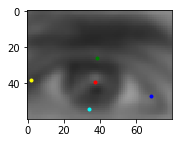

eyeGray: (80, 60)
9  0.9 (-2, -2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 315 220
WH: 53 39.75
eyeXY: 315 220
eyeWH: 48 36


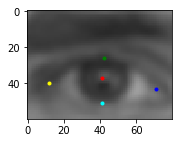

eyeGray: (80, 60)
XY: 409 220
WH: 50 37.5
eyeXY: 409 220
eyeWH: 45 33


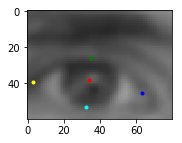

eyeGray: (80, 60)
10  0.9 (-2, -2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 334 191
WH: 64 48.0
eyeXY: 334 191
eyeWH: 58 43


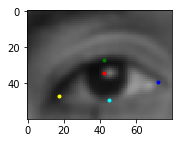

eyeGray: (80, 60)
XY: 434 185
WH: 64 48.0
eyeXY: 434 185
eyeWH: 58 43


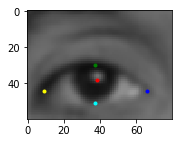

eyeGray: (80, 60)
11  0.9 (-2, -2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 336 191
WH: 68 51.0
eyeXY: 336 191
eyeWH: 61 45


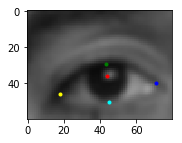

eyeGray: (80, 60)
XY: 438 189
WH: 65 48.75
eyeXY: 438 189
eyeWH: 59 44


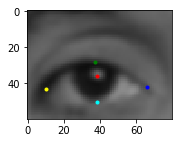

eyeGray: (80, 60)
12  0.9 (-2, -2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 283 166
WH: 63 47.25
eyeXY: 283 166
eyeWH: 57 42


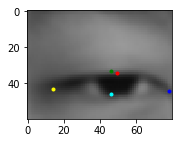

eyeGray: (80, 60)
XY: 381 167
WH: 69 51.75
eyeXY: 381 167
eyeWH: 62 46


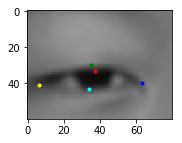

eyeGray: (80, 60)
13  0.9 (-2, -2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 310 158
WH: 59 44.25
eyeXY: 310 158
eyeWH: 53 39


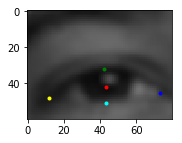

eyeGray: (80, 60)
XY: 412 162
WH: 64 48.0
eyeXY: 412 162
eyeWH: 58 43


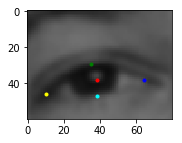

eyeGray: (80, 60)
14  0.9 (-2, -2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 299 158
WH: 59 44.25
eyeXY: 299 158
eyeWH: 53 39


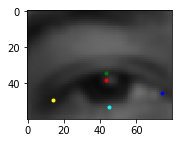

eyeGray: (80, 60)
XY: 400 162
WH: 64 48.0
eyeXY: 400 162
eyeWH: 58 43


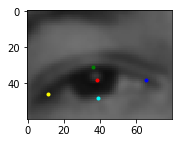

eyeGray: (80, 60)
15  0.9 (-2, -2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 323 180
WH: 57 42.75
eyeXY: 323 180
eyeWH: 51 38


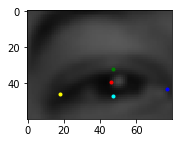

eyeGray: (80, 60)
XY: 414 182
WH: 67 50.25
eyeXY: 414 182
eyeWH: 60 45


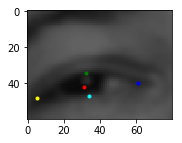

eyeGray: (80, 60)
16  0.9 (-2, -2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 341 185
WH: 60 45.0
eyeXY: 341 185
eyeWH: 54 40


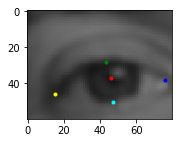

eyeGray: (80, 60)
XY: 440 178
WH: 67 50.25
eyeXY: 440 178
eyeWH: 60 45


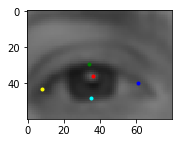

eyeGray: (80, 60)
17  0.9 (-2, -2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 327 184
WH: 66 49.5
eyeXY: 327 184
eyeWH: 59 44


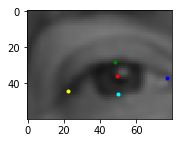

eyeGray: (80, 60)
XY: 428 179
WH: 69 51.75
eyeXY: 428 179
eyeWH: 62 46


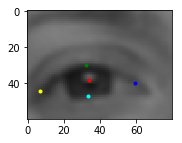

eyeGray: (80, 60)
18  0.9 (-2, -2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 113 330
WH: 132 99.0
eyeXY: 113 330
eyeWH: 119 89


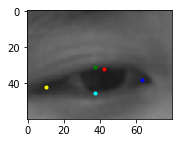

eyeGray: (80, 60)
XY: 312 325
WH: 129 96.75
eyeXY: 312 325
eyeWH: 116 87


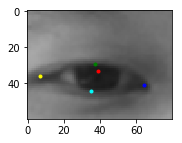

eyeGray: (80, 60)
19  0.9 (-2, -2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 116 324
WH: 127 95.25
eyeXY: 116 324
eyeWH: 114 85


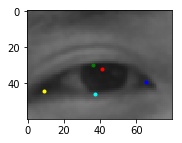

eyeGray: (80, 60)
XY: 315 316
WH: 130 97.5
eyeXY: 315 316
eyeWH: 117 87


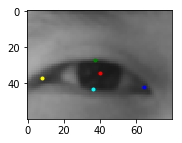

eyeGray: (80, 60)
20  0.9 (-2, -2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 110 333
WH: 132 99.0
eyeXY: 110 333
eyeWH: 119 89


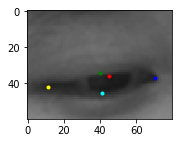

eyeGray: (80, 60)
XY: 310 322
WH: 137 102.75
eyeXY: 310 322
eyeWH: 123 92


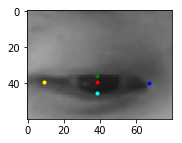

eyeGray: (80, 60)
21  0.9 (-2, -2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 110 328
WH: 135 101.25
eyeXY: 110 328
eyeWH: 122 91


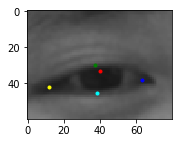

eyeGray: (80, 60)
XY: 314 323
WH: 131 98.25
eyeXY: 314 323
eyeWH: 118 88


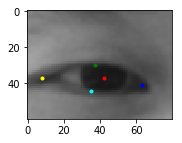

eyeGray: (80, 60)
22  0.9 (-2, -2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 119 329
WH: 131 98.25
eyeXY: 119 329
eyeWH: 118 88


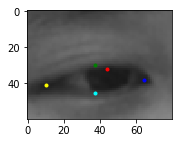

eyeGray: (80, 60)
XY: 320 324
WH: 128 96.0
eyeXY: 320 324
eyeWH: 115 86


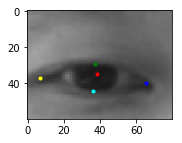

eyeGray: (80, 60)
1  0.9 (2, -2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 305 261
WH: 84 63.0
eyeXY: 305 261
eyeWH: 76 57


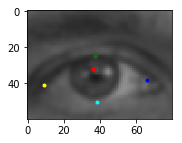

eyeGray: (80, 60)
XY: 445 255
WH: 75 56.25
eyeXY: 445 255
eyeWH: 68 51


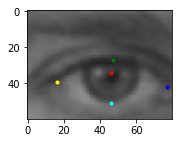

eyeGray: (80, 60)
2  0.9 (2, -2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 256 205
WH: 75 56.25
eyeXY: 256 205
eyeWH: 68 51


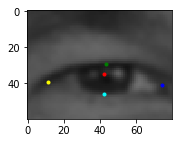

eyeGray: (80, 60)
XY: 393 215
WH: 69 51.75
eyeXY: 393 215
eyeWH: 62 46


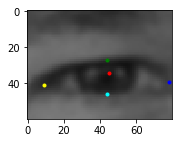

eyeGray: (80, 60)
3  0.9 (2, -2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 270 212
WH: 66 49.5
eyeXY: 270 212
eyeWH: 59 44


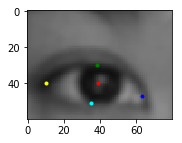

eyeGray: (80, 60)
XY: 371 218
WH: 63 47.25
eyeXY: 371 218
eyeWH: 57 42


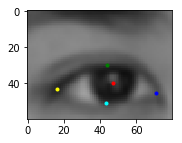

eyeGray: (80, 60)
4  0.9 (2, -2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 270 223
WH: 65 48.75
eyeXY: 270 223
eyeWH: 59 44


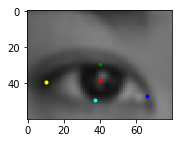

eyeGray: (80, 60)
XY: 375 231
WH: 63 47.25
eyeXY: 375 231
eyeWH: 57 42


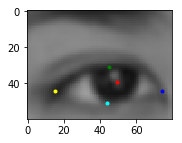

eyeGray: (80, 60)
5  0.9 (2, -2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 257 201
WH: 88 66.0
eyeXY: 257 201
eyeWH: 79 59


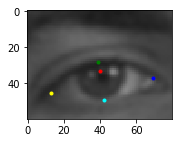

eyeGray: (80, 60)
XY: 405 199
WH: 89 66.75
eyeXY: 405 199
eyeWH: 80 60


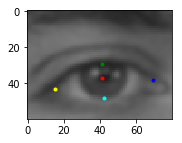

eyeGray: (80, 60)
6  0.9 (2, -2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 311 260
WH: 60 45.0
eyeXY: 311 260
eyeWH: 54 40


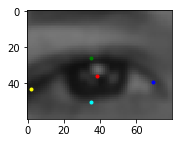

eyeGray: (80, 60)
XY: 423 253
WH: 65 48.75
eyeXY: 423 253
eyeWH: 59 44


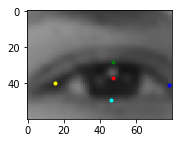

eyeGray: (80, 60)
7  0.9 (2, -2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 327 253
WH: 62 46.5
eyeXY: 327 253
eyeWH: 56 42


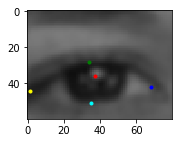

eyeGray: (80, 60)
XY: 440 249
WH: 65 48.75
eyeXY: 440 249
eyeWH: 59 44


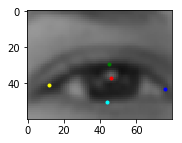

eyeGray: (80, 60)
8  0.9 (2, -2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 327 221
WH: 59 44.25
eyeXY: 327 221
eyeWH: 53 39


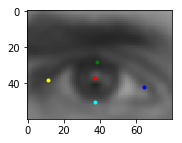

eyeGray: (80, 60)
XY: 428 223
WH: 48 36.0
eyeXY: 428 223
eyeWH: 43 32


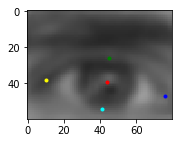

eyeGray: (80, 60)
9  0.9 (2, -2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 319 220
WH: 53 39.75
eyeXY: 319 220
eyeWH: 48 36


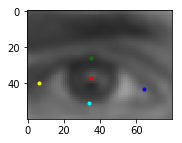

eyeGray: (80, 60)
XY: 413 220
WH: 50 37.5
eyeXY: 413 220
eyeWH: 45 33


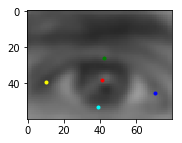

eyeGray: (80, 60)
10  0.9 (2, -2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 338 191
WH: 64 48.0
eyeXY: 338 191
eyeWH: 58 43


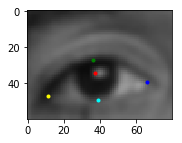

eyeGray: (80, 60)
XY: 438 185
WH: 64 48.0
eyeXY: 438 185
eyeWH: 58 43


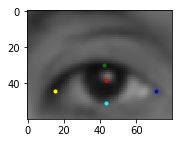

eyeGray: (80, 60)
11  0.9 (2, -2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 340 191
WH: 68 51.0
eyeXY: 340 191
eyeWH: 61 45


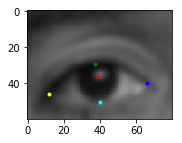

eyeGray: (80, 60)
XY: 442 189
WH: 65 48.75
eyeXY: 442 189
eyeWH: 59 44


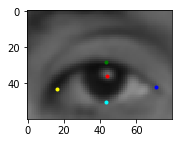

eyeGray: (80, 60)
12  0.9 (2, -2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 287 166
WH: 63 47.25
eyeXY: 287 166
eyeWH: 57 42


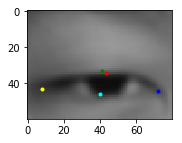

eyeGray: (80, 60)
XY: 385 167
WH: 69 51.75
eyeXY: 385 167
eyeWH: 62 46


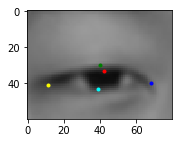

eyeGray: (80, 60)
13  0.9 (2, -2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 314 158
WH: 59 44.25
eyeXY: 314 158
eyeWH: 53 39


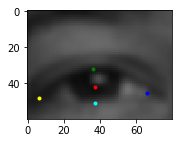

eyeGray: (80, 60)
XY: 416 162
WH: 64 48.0
eyeXY: 416 162
eyeWH: 58 43


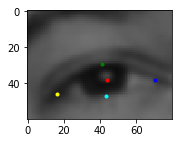

eyeGray: (80, 60)
14  0.9 (2, -2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 303 158
WH: 59 44.25
eyeXY: 303 158
eyeWH: 53 39


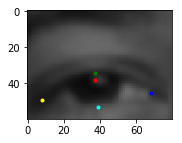

eyeGray: (80, 60)
XY: 404 162
WH: 64 48.0
eyeXY: 404 162
eyeWH: 58 43


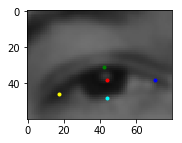

eyeGray: (80, 60)
15  0.9 (2, -2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 327 180
WH: 57 42.75
eyeXY: 327 180
eyeWH: 51 38


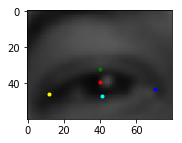

eyeGray: (80, 60)
XY: 418 182
WH: 67 50.25
eyeXY: 418 182
eyeWH: 60 45


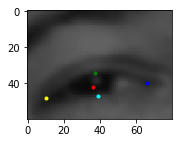

eyeGray: (80, 60)
16  0.9 (2, -2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 345 185
WH: 60 45.0
eyeXY: 345 185
eyeWH: 54 40


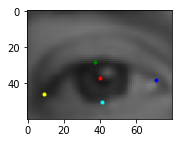

eyeGray: (80, 60)
XY: 444 178
WH: 67 50.25
eyeXY: 444 178
eyeWH: 60 45


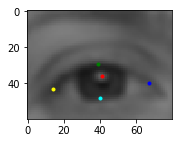

eyeGray: (80, 60)
17  0.9 (2, -2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 331 184
WH: 66 49.5
eyeXY: 331 184
eyeWH: 59 44


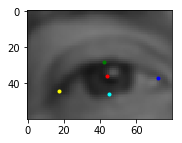

eyeGray: (80, 60)
XY: 432 179
WH: 69 51.75
eyeXY: 432 179
eyeWH: 62 46


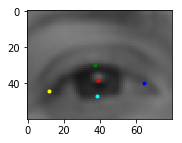

eyeGray: (80, 60)
18  0.9 (2, -2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 117 330
WH: 132 99.0
eyeXY: 117 330
eyeWH: 119 89


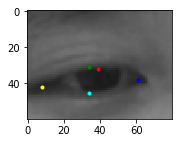

eyeGray: (80, 60)
XY: 316 325
WH: 129 96.75
eyeXY: 316 325
eyeWH: 116 87


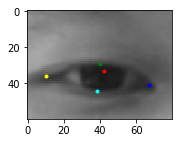

eyeGray: (80, 60)
19  0.9 (2, -2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 120 324
WH: 127 95.25
eyeXY: 120 324
eyeWH: 114 85


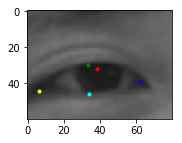

eyeGray: (80, 60)
XY: 319 316
WH: 130 97.5
eyeXY: 319 316
eyeWH: 117 87


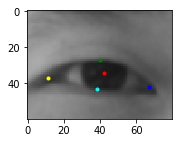

eyeGray: (80, 60)
20  0.9 (2, -2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 114 333
WH: 132 99.0
eyeXY: 114 333
eyeWH: 119 89


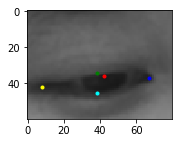

eyeGray: (80, 60)
XY: 314 322
WH: 137 102.75
eyeXY: 314 322
eyeWH: 123 92


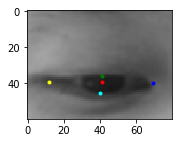

eyeGray: (80, 60)
21  0.9 (2, -2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 114 328
WH: 135 101.25
eyeXY: 114 328
eyeWH: 122 91


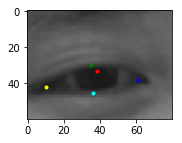

eyeGray: (80, 60)
XY: 318 323
WH: 131 98.25
eyeXY: 318 323
eyeWH: 118 88


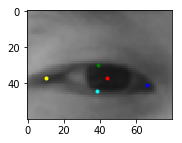

eyeGray: (80, 60)
22  0.9 (2, -2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 123 329
WH: 131 98.25
eyeXY: 123 329
eyeWH: 118 88


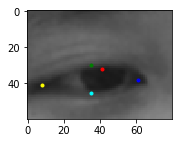

eyeGray: (80, 60)
XY: 324 324
WH: 128 96.0
eyeXY: 324 324
eyeWH: 115 86


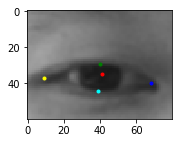

eyeGray: (80, 60)
1  0.9 (0, 0)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 303 263
WH: 84 63.0
eyeXY: 303 263
eyeWH: 76 57


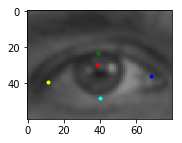

eyeGray: (80, 60)
XY: 443 257
WH: 75 56.25
eyeXY: 443 257
eyeWH: 68 51


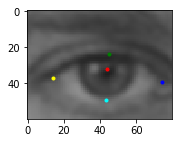

eyeGray: (80, 60)
2  0.9 (0, 0)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 254 207
WH: 75 56.25
eyeXY: 254 207
eyeWH: 68 51


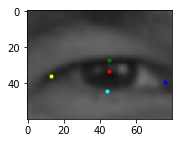

eyeGray: (80, 60)
XY: 391 217
WH: 69 51.75
eyeXY: 391 217
eyeWH: 62 46


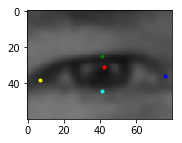

eyeGray: (80, 60)
3  0.9 (0, 0)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 268 214
WH: 66 49.5
eyeXY: 268 214
eyeWH: 59 44


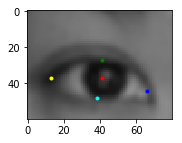

eyeGray: (80, 60)
XY: 369 220
WH: 63 47.25
eyeXY: 369 220
eyeWH: 57 42


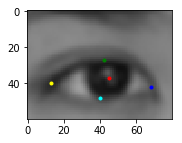

eyeGray: (80, 60)
4  0.9 (0, 0)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 268 225
WH: 65 48.75
eyeXY: 268 225
eyeWH: 59 44


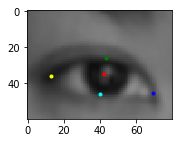

eyeGray: (80, 60)
XY: 373 233
WH: 63 47.25
eyeXY: 373 233
eyeWH: 57 42


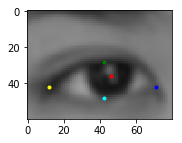

eyeGray: (80, 60)
5  0.9 (0, 0)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 255 203
WH: 88 66.0
eyeXY: 255 203
eyeWH: 79 59


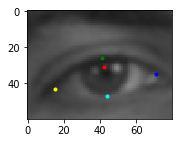

eyeGray: (80, 60)
XY: 403 201
WH: 89 66.75
eyeXY: 403 201
eyeWH: 80 60


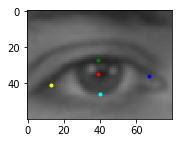

eyeGray: (80, 60)
6  0.9 (0, 0)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 309 262
WH: 60 45.0
eyeXY: 309 262
eyeWH: 54 40


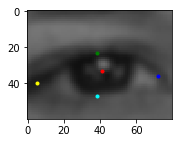

eyeGray: (80, 60)
XY: 421 255
WH: 65 48.75
eyeXY: 421 255
eyeWH: 59 44


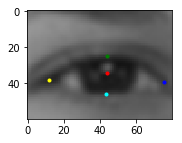

eyeGray: (80, 60)
7  0.9 (0, 0)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 325 255
WH: 62 46.5
eyeXY: 325 255
eyeWH: 56 42


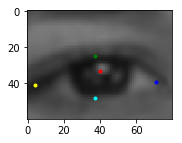

eyeGray: (80, 60)
XY: 438 251
WH: 65 48.75
eyeXY: 438 251
eyeWH: 59 44


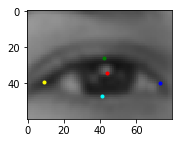

eyeGray: (80, 60)
8  0.9 (0, 0)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 325 223
WH: 59 44.25
eyeXY: 325 223
eyeWH: 53 39


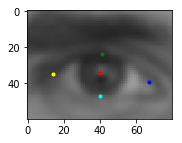

eyeGray: (80, 60)
XY: 426 225
WH: 48 36.0
eyeXY: 426 225
eyeWH: 43 32


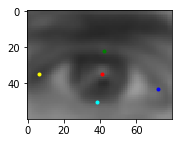

eyeGray: (80, 60)
9  0.9 (0, 0)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 317 222
WH: 53 39.75
eyeXY: 317 222
eyeWH: 48 36


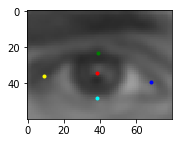

eyeGray: (80, 60)
XY: 411 222
WH: 50 37.5
eyeXY: 411 222
eyeWH: 45 33


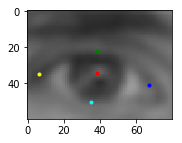

eyeGray: (80, 60)
10  0.9 (0, 0)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 336 193
WH: 64 48.0
eyeXY: 336 193
eyeWH: 58 43


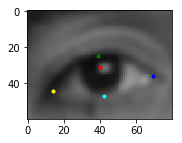

eyeGray: (80, 60)
XY: 436 187
WH: 64 48.0
eyeXY: 436 187
eyeWH: 58 43


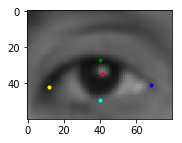

eyeGray: (80, 60)
11  0.9 (0, 0)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 338 193
WH: 68 51.0
eyeXY: 338 193
eyeWH: 61 45


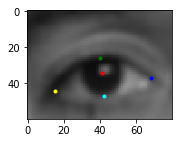

eyeGray: (80, 60)
XY: 440 191
WH: 65 48.75
eyeXY: 440 191
eyeWH: 59 44


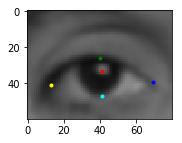

eyeGray: (80, 60)
12  0.9 (0, 0)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 285 168
WH: 63 47.25
eyeXY: 285 168
eyeWH: 57 42


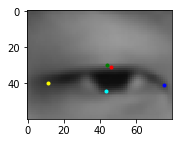

eyeGray: (80, 60)
XY: 383 169
WH: 69 51.75
eyeXY: 383 169
eyeWH: 62 46


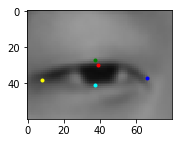

eyeGray: (80, 60)
13  0.9 (0, 0)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 312 160
WH: 59 44.25
eyeXY: 312 160
eyeWH: 53 39


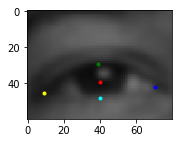

eyeGray: (80, 60)
XY: 414 164
WH: 64 48.0
eyeXY: 414 164
eyeWH: 58 43


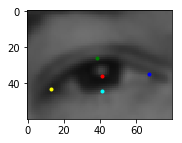

eyeGray: (80, 60)
14  0.9 (0, 0)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 301 160
WH: 59 44.25
eyeXY: 301 160
eyeWH: 53 39


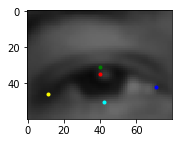

eyeGray: (80, 60)
XY: 402 164
WH: 64 48.0
eyeXY: 402 164
eyeWH: 58 43


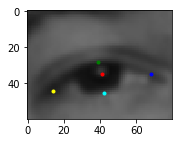

eyeGray: (80, 60)
15  0.9 (0, 0)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 325 182
WH: 57 42.75
eyeXY: 325 182
eyeWH: 51 38


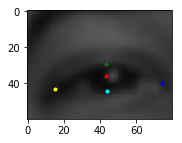

eyeGray: (80, 60)
XY: 416 184
WH: 67 50.25
eyeXY: 416 184
eyeWH: 60 45


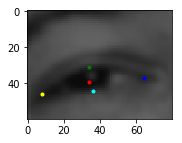

eyeGray: (80, 60)
16  0.9 (0, 0)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 343 187
WH: 60 45.0
eyeXY: 343 187
eyeWH: 54 40


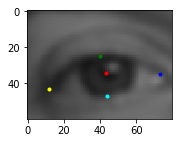

eyeGray: (80, 60)
XY: 442 180
WH: 67 50.25
eyeXY: 442 180
eyeWH: 60 45


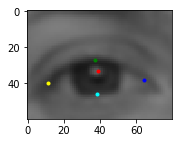

eyeGray: (80, 60)
17  0.9 (0, 0)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 329 186
WH: 66 49.5
eyeXY: 329 186
eyeWH: 59 44


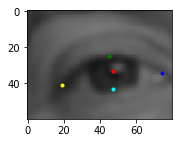

eyeGray: (80, 60)
XY: 430 181
WH: 69 51.75
eyeXY: 430 181
eyeWH: 62 46


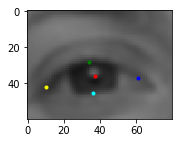

eyeGray: (80, 60)
18  0.9 (0, 0)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 115 332
WH: 132 99.0
eyeXY: 115 332
eyeWH: 119 89


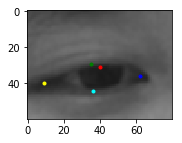

eyeGray: (80, 60)
XY: 314 327
WH: 129 96.75
eyeXY: 314 327
eyeWH: 116 87


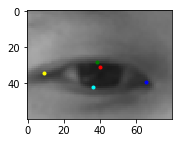

eyeGray: (80, 60)
19  0.9 (0, 0)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 118 326
WH: 127 95.25
eyeXY: 118 326
eyeWH: 114 85


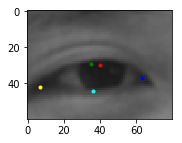

eyeGray: (80, 60)
XY: 317 318
WH: 130 97.5
eyeXY: 317 318
eyeWH: 117 87


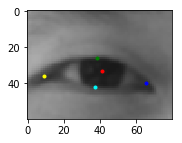

eyeGray: (80, 60)
20  0.9 (0, 0)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 112 335
WH: 132 99.0
eyeXY: 112 335
eyeWH: 119 89


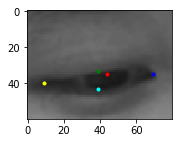

eyeGray: (80, 60)
XY: 312 324
WH: 137 102.75
eyeXY: 312 324
eyeWH: 123 92


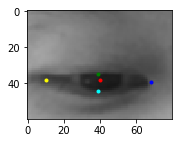

eyeGray: (80, 60)
21  0.9 (0, 0)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 112 330
WH: 135 101.25
eyeXY: 112 330
eyeWH: 122 91


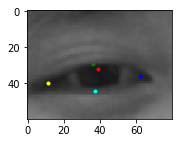

eyeGray: (80, 60)
XY: 316 325
WH: 131 98.25
eyeXY: 316 325
eyeWH: 118 88


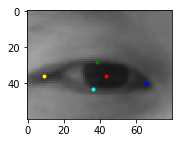

eyeGray: (80, 60)
22  0.9 (0, 0)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 121 331
WH: 131 98.25
eyeXY: 121 331
eyeWH: 118 88


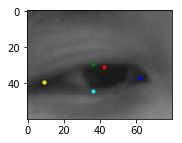

eyeGray: (80, 60)
XY: 322 326
WH: 128 96.0
eyeXY: 322 326
eyeWH: 115 86


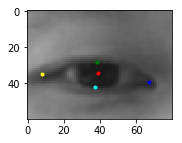

eyeGray: (80, 60)
1  0.9 (-2, 2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 301 265
WH: 84 63.0
eyeXY: 301 265
eyeWH: 76 57


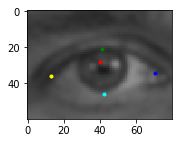

eyeGray: (80, 60)
XY: 441 259
WH: 75 56.25
eyeXY: 441 259
eyeWH: 68 51


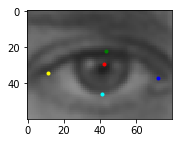

eyeGray: (80, 60)
2  0.9 (-2, 2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 252 209
WH: 75 56.25
eyeXY: 252 209
eyeWH: 68 51


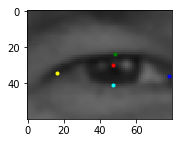

eyeGray: (80, 60)
XY: 389 219
WH: 69 51.75
eyeXY: 389 219
eyeWH: 62 46


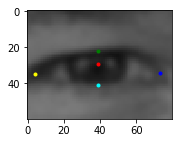

eyeGray: (80, 60)
3  0.9 (-2, 2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 266 216
WH: 66 49.5
eyeXY: 266 216
eyeWH: 59 44


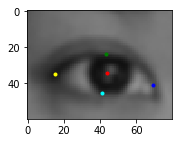

eyeGray: (80, 60)
XY: 367 222
WH: 63 47.25
eyeXY: 367 222
eyeWH: 57 42


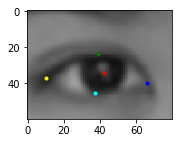

eyeGray: (80, 60)
4  0.9 (-2, 2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 266 227
WH: 65 48.75
eyeXY: 266 227
eyeWH: 59 44


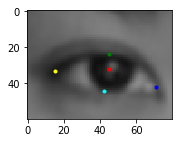

eyeGray: (80, 60)
XY: 371 235
WH: 63 47.25
eyeXY: 371 235
eyeWH: 57 42


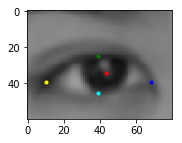

eyeGray: (80, 60)
5  0.9 (-2, 2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 253 205
WH: 88 66.0
eyeXY: 253 205
eyeWH: 79 59


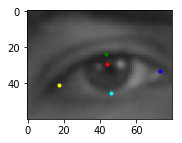

eyeGray: (80, 60)
XY: 401 203
WH: 89 66.75
eyeXY: 401 203
eyeWH: 80 60


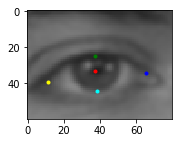

eyeGray: (80, 60)
6  0.9 (-2, 2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 307 264
WH: 60 45.0
eyeXY: 307 264
eyeWH: 54 40


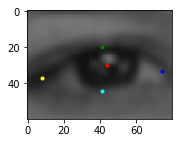

eyeGray: (80, 60)
XY: 419 257
WH: 65 48.75
eyeXY: 419 257
eyeWH: 59 44


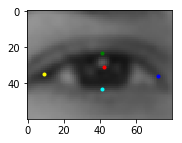

eyeGray: (80, 60)
7  0.9 (-2, 2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 323 257
WH: 62 46.5
eyeXY: 323 257
eyeWH: 56 42


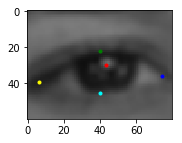

eyeGray: (80, 60)
XY: 436 253
WH: 65 48.75
eyeXY: 436 253
eyeWH: 59 44


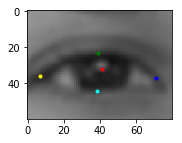

eyeGray: (80, 60)
8  0.9 (-2, 2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 323 225
WH: 59 44.25
eyeXY: 323 225
eyeWH: 53 39


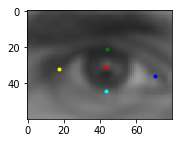

eyeGray: (80, 60)
XY: 424 227
WH: 48 36.0
eyeXY: 424 227
eyeWH: 43 32


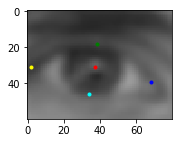

eyeGray: (80, 60)
9  0.9 (-2, 2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 315 224
WH: 53 39.75
eyeXY: 315 224
eyeWH: 48 36


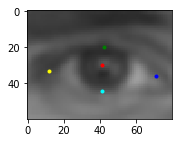

eyeGray: (80, 60)
XY: 409 224
WH: 50 37.5
eyeXY: 409 224
eyeWH: 45 33


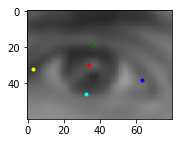

eyeGray: (80, 60)
10  0.9 (-2, 2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 334 195
WH: 64 48.0
eyeXY: 334 195
eyeWH: 58 43


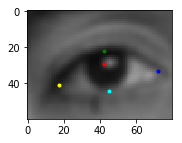

eyeGray: (80, 60)
XY: 434 189
WH: 64 48.0
eyeXY: 434 189
eyeWH: 58 43


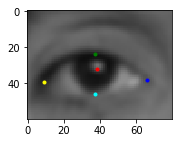

eyeGray: (80, 60)
11  0.9 (-2, 2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 336 195
WH: 68 51.0
eyeXY: 336 195
eyeWH: 61 45


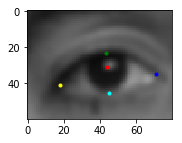

eyeGray: (80, 60)
XY: 438 193
WH: 65 48.75
eyeXY: 438 193
eyeWH: 59 44


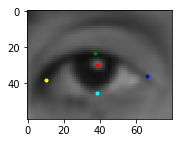

eyeGray: (80, 60)
12  0.9 (-2, 2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 283 170
WH: 63 47.25
eyeXY: 283 170
eyeWH: 57 42


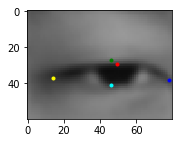

eyeGray: (80, 60)
XY: 381 171
WH: 69 51.75
eyeXY: 381 171
eyeWH: 62 46


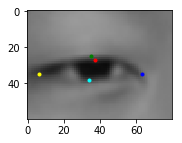

eyeGray: (80, 60)
13  0.9 (-2, 2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 310 162
WH: 59 44.25
eyeXY: 310 162
eyeWH: 53 39


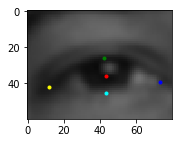

eyeGray: (80, 60)
XY: 412 166
WH: 64 48.0
eyeXY: 412 166
eyeWH: 58 43


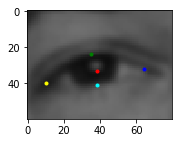

eyeGray: (80, 60)
14  0.9 (-2, 2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 299 162
WH: 59 44.25
eyeXY: 299 162
eyeWH: 53 39


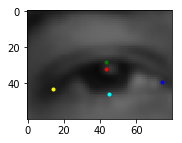

eyeGray: (80, 60)
XY: 400 166
WH: 64 48.0
eyeXY: 400 166
eyeWH: 58 43


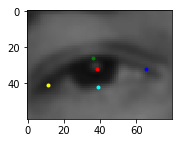

eyeGray: (80, 60)
15  0.9 (-2, 2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 323 184
WH: 57 42.75
eyeXY: 323 184
eyeWH: 51 38


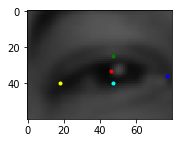

eyeGray: (80, 60)
XY: 414 186
WH: 67 50.25
eyeXY: 414 186
eyeWH: 60 45


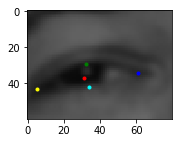

eyeGray: (80, 60)
16  0.9 (-2, 2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 341 189
WH: 60 45.0
eyeXY: 341 189
eyeWH: 54 40


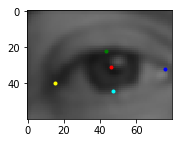

eyeGray: (80, 60)
XY: 440 182
WH: 67 50.25
eyeXY: 440 182
eyeWH: 60 45


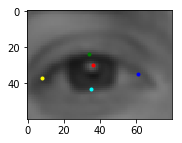

eyeGray: (80, 60)
17  0.9 (-2, 2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 327 188
WH: 66 49.5
eyeXY: 327 188
eyeWH: 59 44


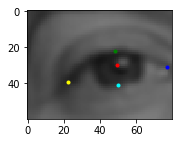

eyeGray: (80, 60)
XY: 428 183
WH: 69 51.75
eyeXY: 428 183
eyeWH: 62 46


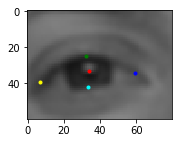

eyeGray: (80, 60)
18  0.9 (-2, 2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 113 334
WH: 132 99.0
eyeXY: 113 334
eyeWH: 119 89


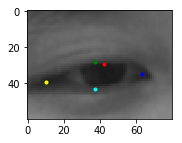

eyeGray: (80, 60)
XY: 312 329
WH: 129 96.75
eyeXY: 312 329
eyeWH: 116 87


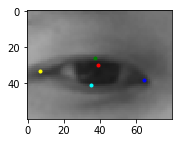

eyeGray: (80, 60)
19  0.9 (-2, 2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 116 328
WH: 127 95.25
eyeXY: 116 328
eyeWH: 114 85


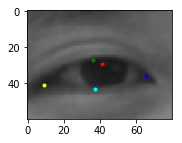

eyeGray: (80, 60)
XY: 315 320
WH: 130 97.5
eyeXY: 315 320
eyeWH: 117 87


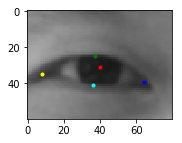

eyeGray: (80, 60)
20  0.9 (-2, 2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 110 337
WH: 132 99.0
eyeXY: 110 337
eyeWH: 119 89


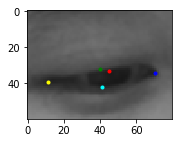

eyeGray: (80, 60)
XY: 310 326
WH: 137 102.75
eyeXY: 310 326
eyeWH: 123 92


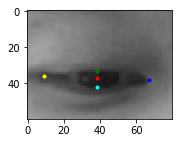

eyeGray: (80, 60)
21  0.9 (-2, 2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 110 332
WH: 135 101.25
eyeXY: 110 332
eyeWH: 122 91


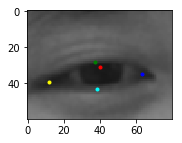

eyeGray: (80, 60)
XY: 314 327
WH: 131 98.25
eyeXY: 314 327
eyeWH: 118 88


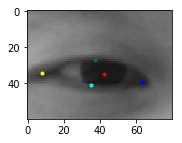

eyeGray: (80, 60)
22  0.9 (-2, 2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 119 333
WH: 131 98.25
eyeXY: 119 333
eyeWH: 118 88


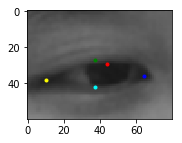

eyeGray: (80, 60)
XY: 320 328
WH: 128 96.0
eyeXY: 320 328
eyeWH: 115 86


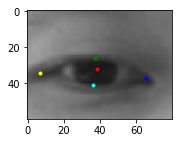

eyeGray: (80, 60)
1  0.9 (2, 2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 305 265
WH: 84 63.0
eyeXY: 305 265
eyeWH: 76 57


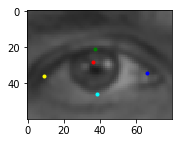

eyeGray: (80, 60)
XY: 445 259
WH: 75 56.25
eyeXY: 445 259
eyeWH: 68 51


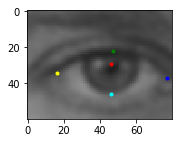

eyeGray: (80, 60)
2  0.9 (2, 2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 256 209
WH: 75 56.25
eyeXY: 256 209
eyeWH: 68 51


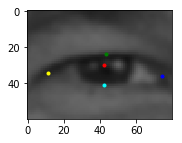

eyeGray: (80, 60)
XY: 393 219
WH: 69 51.75
eyeXY: 393 219
eyeWH: 62 46


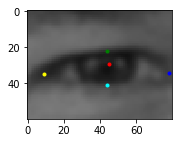

eyeGray: (80, 60)
3  0.9 (2, 2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 270 216
WH: 66 49.5
eyeXY: 270 216
eyeWH: 59 44


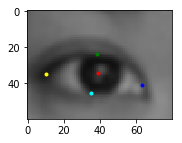

eyeGray: (80, 60)
XY: 371 222
WH: 63 47.25
eyeXY: 371 222
eyeWH: 57 42


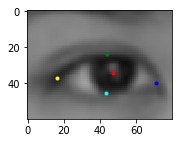

eyeGray: (80, 60)
4  0.9 (2, 2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 270 227
WH: 65 48.75
eyeXY: 270 227
eyeWH: 59 44


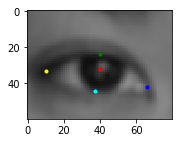

eyeGray: (80, 60)
XY: 375 235
WH: 63 47.25
eyeXY: 375 235
eyeWH: 57 42


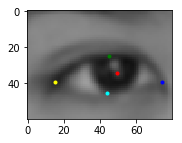

eyeGray: (80, 60)
5  0.9 (2, 2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 257 205
WH: 88 66.0
eyeXY: 257 205
eyeWH: 79 59


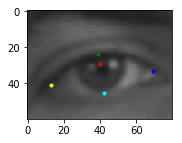

eyeGray: (80, 60)
XY: 405 203
WH: 89 66.75
eyeXY: 405 203
eyeWH: 80 60


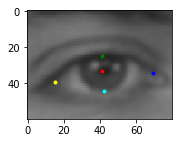

eyeGray: (80, 60)
6  0.9 (2, 2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 311 264
WH: 60 45.0
eyeXY: 311 264
eyeWH: 54 40


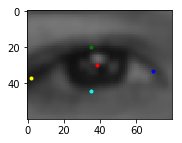

eyeGray: (80, 60)
XY: 423 257
WH: 65 48.75
eyeXY: 423 257
eyeWH: 59 44


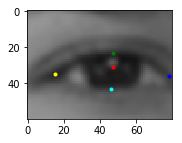

eyeGray: (80, 60)
7  0.9 (2, 2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 327 257
WH: 62 46.5
eyeXY: 327 257
eyeWH: 56 42


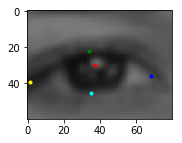

eyeGray: (80, 60)
XY: 440 253
WH: 65 48.75
eyeXY: 440 253
eyeWH: 59 44


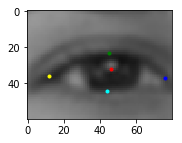

eyeGray: (80, 60)
8  0.9 (2, 2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 327 225
WH: 59 44.25
eyeXY: 327 225
eyeWH: 53 39


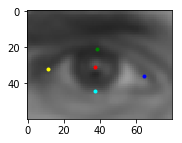

eyeGray: (80, 60)
XY: 428 227
WH: 48 36.0
eyeXY: 428 227
eyeWH: 43 32


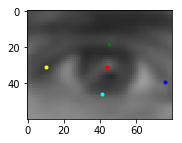

eyeGray: (80, 60)
9  0.9 (2, 2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 319 224
WH: 53 39.75
eyeXY: 319 224
eyeWH: 48 36


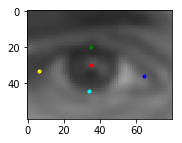

eyeGray: (80, 60)
XY: 413 224
WH: 50 37.5
eyeXY: 413 224
eyeWH: 45 33


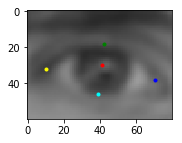

eyeGray: (80, 60)
10  0.9 (2, 2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 338 195
WH: 64 48.0
eyeXY: 338 195
eyeWH: 58 43


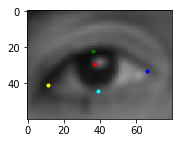

eyeGray: (80, 60)
XY: 438 189
WH: 64 48.0
eyeXY: 438 189
eyeWH: 58 43


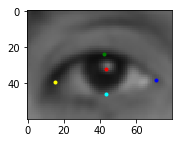

eyeGray: (80, 60)
11  0.9 (2, 2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 340 195
WH: 68 51.0
eyeXY: 340 195
eyeWH: 61 45


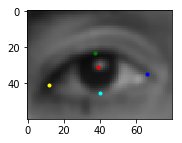

eyeGray: (80, 60)
XY: 442 193
WH: 65 48.75
eyeXY: 442 193
eyeWH: 59 44


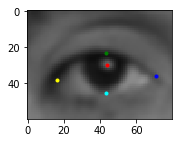

eyeGray: (80, 60)
12  0.9 (2, 2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 287 170
WH: 63 47.25
eyeXY: 287 170
eyeWH: 57 42


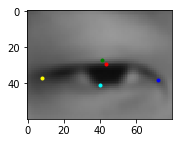

eyeGray: (80, 60)
XY: 385 171
WH: 69 51.75
eyeXY: 385 171
eyeWH: 62 46


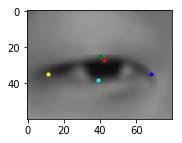

eyeGray: (80, 60)
13  0.9 (2, 2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 314 162
WH: 59 44.25
eyeXY: 314 162
eyeWH: 53 39


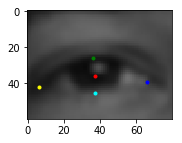

eyeGray: (80, 60)
XY: 416 166
WH: 64 48.0
eyeXY: 416 166
eyeWH: 58 43


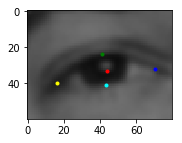

eyeGray: (80, 60)
14  0.9 (2, 2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 303 162
WH: 59 44.25
eyeXY: 303 162
eyeWH: 53 39


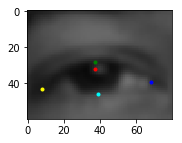

eyeGray: (80, 60)
XY: 404 166
WH: 64 48.0
eyeXY: 404 166
eyeWH: 58 43


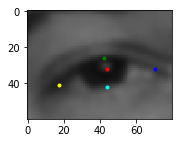

eyeGray: (80, 60)
15  0.9 (2, 2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 327 184
WH: 57 42.75
eyeXY: 327 184
eyeWH: 51 38


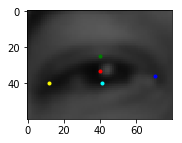

eyeGray: (80, 60)
XY: 418 186
WH: 67 50.25
eyeXY: 418 186
eyeWH: 60 45


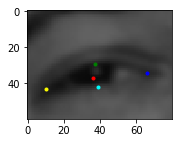

eyeGray: (80, 60)
16  0.9 (2, 2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 345 189
WH: 60 45.0
eyeXY: 345 189
eyeWH: 54 40


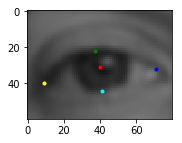

eyeGray: (80, 60)
XY: 444 182
WH: 67 50.25
eyeXY: 444 182
eyeWH: 60 45


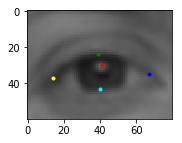

eyeGray: (80, 60)
17  0.9 (2, 2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 331 188
WH: 66 49.5
eyeXY: 331 188
eyeWH: 59 44


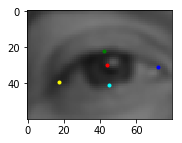

eyeGray: (80, 60)
XY: 432 183
WH: 69 51.75
eyeXY: 432 183
eyeWH: 62 46


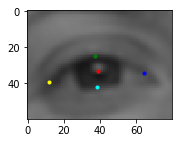

eyeGray: (80, 60)
18  0.9 (2, 2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 117 334
WH: 132 99.0
eyeXY: 117 334
eyeWH: 119 89


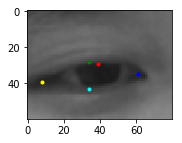

eyeGray: (80, 60)
XY: 316 329
WH: 129 96.75
eyeXY: 316 329
eyeWH: 116 87


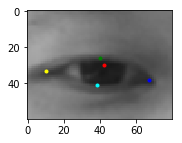

eyeGray: (80, 60)
19  0.9 (2, 2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 120 328
WH: 127 95.25
eyeXY: 120 328
eyeWH: 114 85


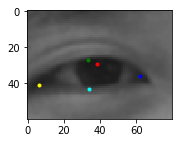

eyeGray: (80, 60)
XY: 319 320
WH: 130 97.5
eyeXY: 319 320
eyeWH: 117 87


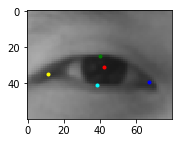

eyeGray: (80, 60)
20  0.9 (2, 2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 114 337
WH: 132 99.0
eyeXY: 114 337
eyeWH: 119 89


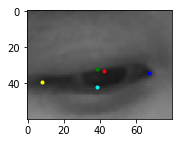

eyeGray: (80, 60)
XY: 314 326
WH: 137 102.75
eyeXY: 314 326
eyeWH: 123 92


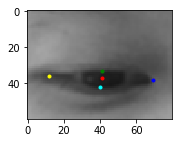

eyeGray: (80, 60)
21  0.9 (2, 2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 114 332
WH: 135 101.25
eyeXY: 114 332
eyeWH: 122 91


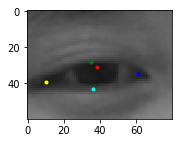

eyeGray: (80, 60)
XY: 318 327
WH: 131 98.25
eyeXY: 318 327
eyeWH: 118 88


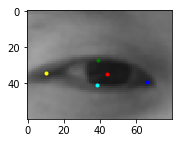

eyeGray: (80, 60)
22  0.9 (2, 2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 123 333
WH: 131 98.25
eyeXY: 123 333
eyeWH: 118 88


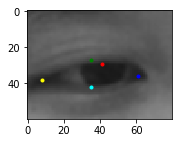

eyeGray: (80, 60)
XY: 324 328
WH: 128 96.0
eyeXY: 324 328
eyeWH: 115 86


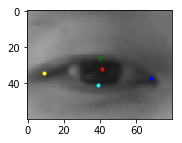

eyeGray: (80, 60)
1  1.0 (-2, -2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 301 261
WH: 84 63.0
eyeXY: 301 261
eyeWH: 84 63


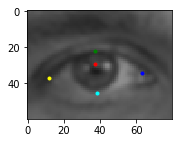

eyeGray: (80, 60)
XY: 441 255
WH: 75 56.25
eyeXY: 441 255
eyeWH: 75 56


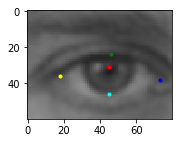

eyeGray: (80, 60)
2  1.0 (-2, -2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 252 205
WH: 75 56.25
eyeXY: 252 205
eyeWH: 75 56


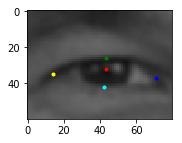

eyeGray: (80, 60)
XY: 389 215
WH: 69 51.75
eyeXY: 389 215
eyeWH: 69 51


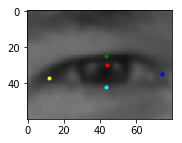

eyeGray: (80, 60)
3  1.0 (-2, -2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 266 212
WH: 66 49.5
eyeXY: 266 212
eyeWH: 66 49


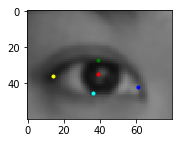

eyeGray: (80, 60)
XY: 367 218
WH: 63 47.25
eyeXY: 367 218
eyeWH: 63 47


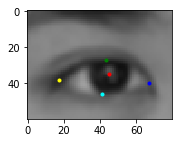

eyeGray: (80, 60)
4  1.0 (-2, -2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 266 223
WH: 65 48.75
eyeXY: 266 223
eyeWH: 65 48


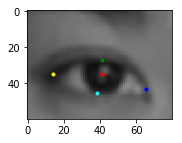

eyeGray: (80, 60)
XY: 371 231
WH: 63 47.25
eyeXY: 371 231
eyeWH: 63 47


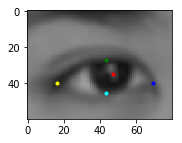

eyeGray: (80, 60)
5  1.0 (-2, -2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 253 201
WH: 88 66.0
eyeXY: 253 201
eyeWH: 88 66


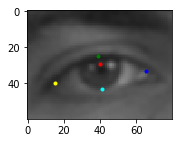

eyeGray: (80, 60)
XY: 401 199
WH: 89 66.75
eyeXY: 401 199
eyeWH: 89 66


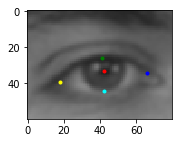

eyeGray: (80, 60)
6  1.0 (-2, -2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 307 260
WH: 60 45.0
eyeXY: 307 260
eyeWH: 60 45


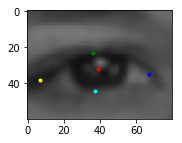

eyeGray: (80, 60)
XY: 419 253
WH: 65 48.75
eyeXY: 419 253
eyeWH: 65 48


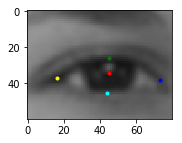

eyeGray: (80, 60)
7  1.0 (-2, -2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 323 253
WH: 62 46.5
eyeXY: 323 253
eyeWH: 62 46


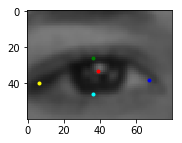

eyeGray: (80, 60)
XY: 436 249
WH: 65 48.75
eyeXY: 436 249
eyeWH: 65 48


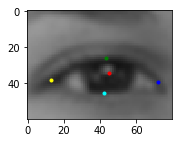

eyeGray: (80, 60)
8  1.0 (-2, -2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 323 221
WH: 59 44.25
eyeXY: 323 221
eyeWH: 59 44


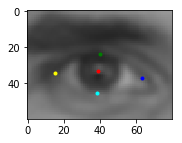

eyeGray: (80, 60)
XY: 424 223
WH: 48 36.0
eyeXY: 424 223
eyeWH: 48 36


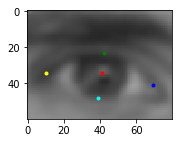

eyeGray: (80, 60)
9  1.0 (-2, -2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 315 220
WH: 53 39.75
eyeXY: 315 220
eyeWH: 53 39


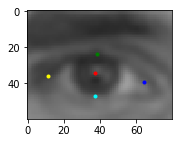

eyeGray: (80, 60)
XY: 409 220
WH: 50 37.5
eyeXY: 409 220
eyeWH: 50 37


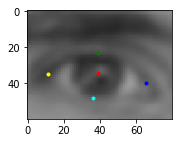

eyeGray: (80, 60)
10  1.0 (-2, -2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 334 191
WH: 64 48.0
eyeXY: 334 191
eyeWH: 64 48


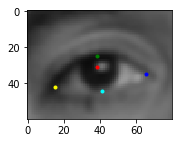

eyeGray: (80, 60)
XY: 434 185
WH: 64 48.0
eyeXY: 434 185
eyeWH: 64 48


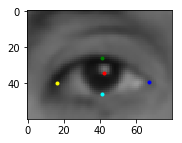

eyeGray: (80, 60)
11  1.0 (-2, -2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 336 191
WH: 68 51.0
eyeXY: 336 191
eyeWH: 68 51


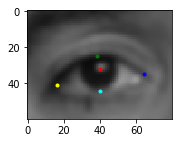

eyeGray: (80, 60)
XY: 438 189
WH: 65 48.75
eyeXY: 438 189
eyeWH: 65 48


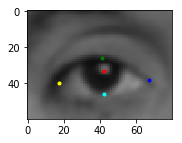

eyeGray: (80, 60)
12  1.0 (-2, -2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 283 166
WH: 63 47.25
eyeXY: 283 166
eyeWH: 63 47


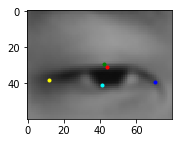

eyeGray: (80, 60)
XY: 381 167
WH: 69 51.75
eyeXY: 381 167
eyeWH: 69 51


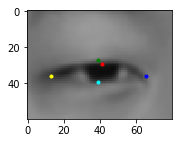

eyeGray: (80, 60)
13  1.0 (-2, -2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 310 158
WH: 59 44.25
eyeXY: 310 158
eyeWH: 59 44


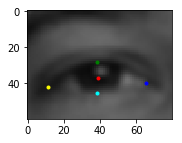

eyeGray: (80, 60)
XY: 412 162
WH: 64 48.0
eyeXY: 412 162
eyeWH: 64 48


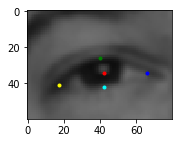

eyeGray: (80, 60)
14  1.0 (-2, -2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 299 158
WH: 59 44.25
eyeXY: 299 158
eyeWH: 59 44


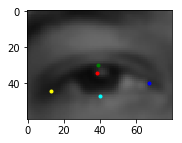

eyeGray: (80, 60)
XY: 400 162
WH: 64 48.0
eyeXY: 400 162
eyeWH: 64 48


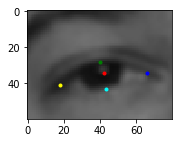

eyeGray: (80, 60)
15  1.0 (-2, -2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 323 180
WH: 57 42.75
eyeXY: 323 180
eyeWH: 57 42


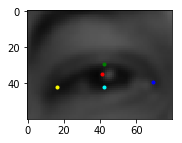

eyeGray: (80, 60)
XY: 414 182
WH: 67 50.25
eyeXY: 414 182
eyeWH: 67 50


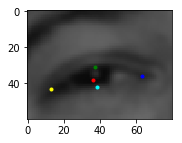

eyeGray: (80, 60)
16  1.0 (-2, -2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 341 185
WH: 60 45.0
eyeXY: 341 185
eyeWH: 60 45


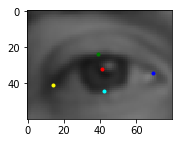

eyeGray: (80, 60)
XY: 440 178
WH: 67 50.25
eyeXY: 440 178
eyeWH: 67 50


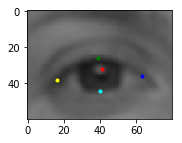

eyeGray: (80, 60)
17  1.0 (-2, -2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 327 184
WH: 66 49.5
eyeXY: 327 184
eyeWH: 66 49


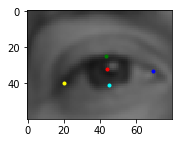

eyeGray: (80, 60)
XY: 428 179
WH: 69 51.75
eyeXY: 428 179
eyeWH: 69 51


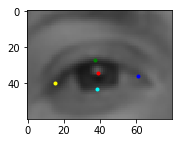

eyeGray: (80, 60)
18  1.0 (-2, -2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 113 330
WH: 132 99.0
eyeXY: 113 330
eyeWH: 132 99


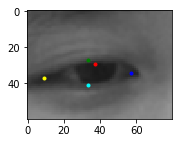

eyeGray: (80, 60)
XY: 312 325
WH: 129 96.75
eyeXY: 312 325
eyeWH: 129 96


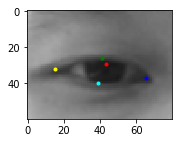

eyeGray: (80, 60)
19  1.0 (-2, -2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 116 324
WH: 127 95.25
eyeXY: 116 324
eyeWH: 127 95


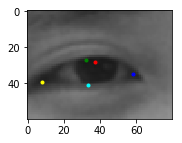

eyeGray: (80, 60)
XY: 315 316
WH: 130 97.5
eyeXY: 315 316
eyeWH: 130 97


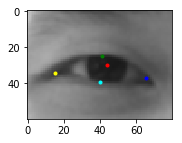

eyeGray: (80, 60)
20  1.0 (-2, -2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 110 333
WH: 132 99.0
eyeXY: 110 333
eyeWH: 132 99


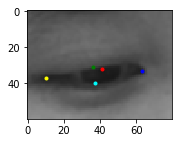

eyeGray: (80, 60)
XY: 310 322
WH: 137 102.75
eyeXY: 310 322
eyeWH: 137 102


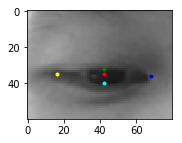

eyeGray: (80, 60)
21  1.0 (-2, -2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 110 328
WH: 135 101.25
eyeXY: 110 328
eyeWH: 135 101


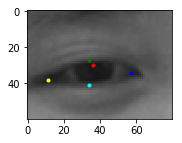

eyeGray: (80, 60)
XY: 314 323
WH: 131 98.25
eyeXY: 314 323
eyeWH: 131 98


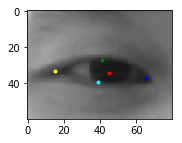

eyeGray: (80, 60)
22  1.0 (-2, -2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 119 329
WH: 131 98.25
eyeXY: 119 329
eyeWH: 131 98


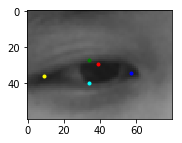

eyeGray: (80, 60)
XY: 320 324
WH: 128 96.0
eyeXY: 320 324
eyeWH: 128 96


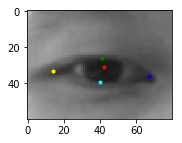

eyeGray: (80, 60)
1  1.0 (2, -2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 305 261
WH: 84 63.0
eyeXY: 305 261
eyeWH: 84 63


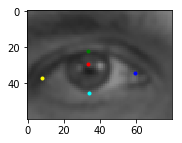

eyeGray: (80, 60)
XY: 445 255
WH: 75 56.25
eyeXY: 445 255
eyeWH: 75 56


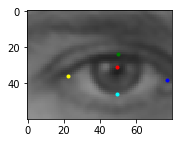

eyeGray: (80, 60)
2  1.0 (2, -2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 256 205
WH: 75 56.25
eyeXY: 256 205
eyeWH: 75 56


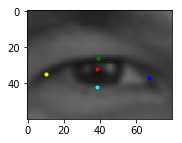

eyeGray: (80, 60)
XY: 393 215
WH: 69 51.75
eyeXY: 393 215
eyeWH: 69 51


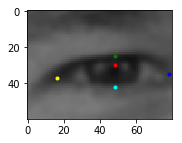

eyeGray: (80, 60)
3  1.0 (2, -2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 270 212
WH: 66 49.5
eyeXY: 270 212
eyeWH: 66 49


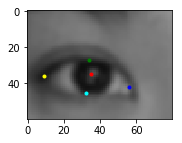

eyeGray: (80, 60)
XY: 371 218
WH: 63 47.25
eyeXY: 371 218
eyeWH: 63 47


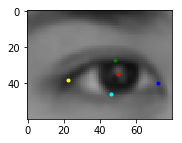

eyeGray: (80, 60)
4  1.0 (2, -2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 270 223
WH: 65 48.75
eyeXY: 270 223
eyeWH: 65 48


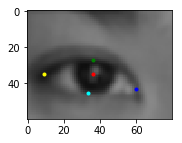

eyeGray: (80, 60)
XY: 375 231
WH: 63 47.25
eyeXY: 375 231
eyeWH: 63 47


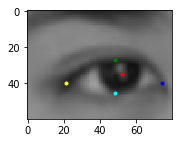

eyeGray: (80, 60)
5  1.0 (2, -2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 257 201
WH: 88 66.0
eyeXY: 257 201
eyeWH: 88 66


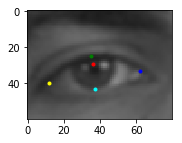

eyeGray: (80, 60)
XY: 405 199
WH: 89 66.75
eyeXY: 405 199
eyeWH: 89 66


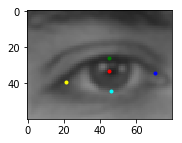

eyeGray: (80, 60)
6  1.0 (2, -2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 311 260
WH: 60 45.0
eyeXY: 311 260
eyeWH: 60 45


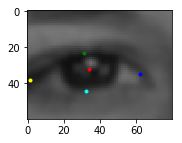

eyeGray: (80, 60)
XY: 423 253
WH: 65 48.75
eyeXY: 423 253
eyeWH: 65 48


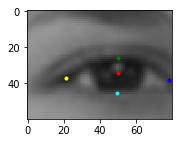

eyeGray: (80, 60)
7  1.0 (2, -2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 327 253
WH: 62 46.5
eyeXY: 327 253
eyeWH: 62 46


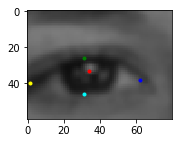

eyeGray: (80, 60)
XY: 440 249
WH: 65 48.75
eyeXY: 440 249
eyeWH: 65 48


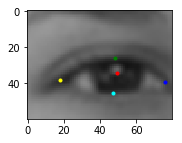

eyeGray: (80, 60)
8  1.0 (2, -2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 327 221
WH: 59 44.25
eyeXY: 327 221
eyeWH: 59 44


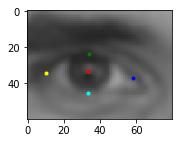

eyeGray: (80, 60)
XY: 428 223
WH: 48 36.0
eyeXY: 428 223
eyeWH: 48 36


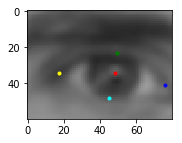

eyeGray: (80, 60)
9  1.0 (2, -2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 319 220
WH: 53 39.75
eyeXY: 319 220
eyeWH: 53 39


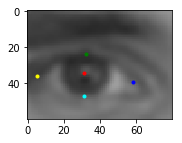

eyeGray: (80, 60)
XY: 413 220
WH: 50 37.5
eyeXY: 413 220
eyeWH: 50 37


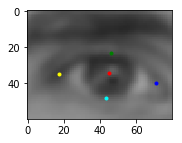

eyeGray: (80, 60)
10  1.0 (2, -2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 338 191
WH: 64 48.0
eyeXY: 338 191
eyeWH: 64 48


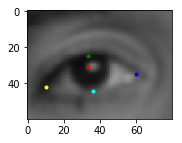

eyeGray: (80, 60)
XY: 438 185
WH: 64 48.0
eyeXY: 438 185
eyeWH: 64 48


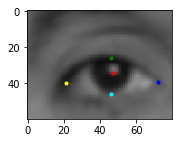

eyeGray: (80, 60)
11  1.0 (2, -2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 340 191
WH: 68 51.0
eyeXY: 340 191
eyeWH: 68 51


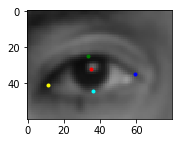

eyeGray: (80, 60)
XY: 442 189
WH: 65 48.75
eyeXY: 442 189
eyeWH: 65 48


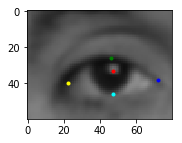

eyeGray: (80, 60)
12  1.0 (2, -2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 287 166
WH: 63 47.25
eyeXY: 287 166
eyeWH: 63 47


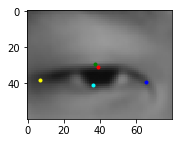

eyeGray: (80, 60)
XY: 385 167
WH: 69 51.75
eyeXY: 385 167
eyeWH: 69 51


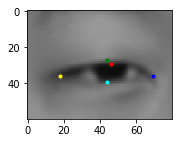

eyeGray: (80, 60)
13  1.0 (2, -2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 314 158
WH: 59 44.25
eyeXY: 314 158
eyeWH: 59 44


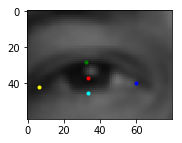

eyeGray: (80, 60)
XY: 416 162
WH: 64 48.0
eyeXY: 416 162
eyeWH: 64 48


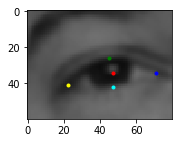

eyeGray: (80, 60)
14  1.0 (2, -2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 303 158
WH: 59 44.25
eyeXY: 303 158
eyeWH: 59 44


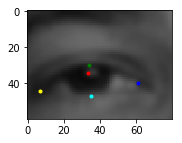

eyeGray: (80, 60)
XY: 404 162
WH: 64 48.0
eyeXY: 404 162
eyeWH: 64 48


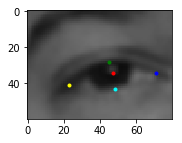

eyeGray: (80, 60)
15  1.0 (2, -2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 327 180
WH: 57 42.75
eyeXY: 327 180
eyeWH: 57 42


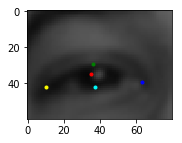

eyeGray: (80, 60)
XY: 418 182
WH: 67 50.25
eyeXY: 418 182
eyeWH: 67 50


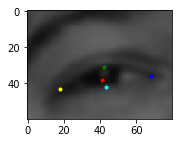

eyeGray: (80, 60)
16  1.0 (2, -2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 345 185
WH: 60 45.0
eyeXY: 345 185
eyeWH: 60 45


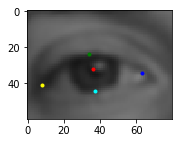

eyeGray: (80, 60)
XY: 444 178
WH: 67 50.25
eyeXY: 444 178
eyeWH: 67 50


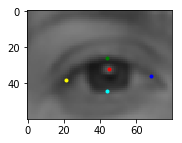

eyeGray: (80, 60)
17  1.0 (2, -2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 331 184
WH: 66 49.5
eyeXY: 331 184
eyeWH: 66 49


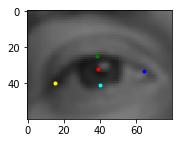

eyeGray: (80, 60)
XY: 432 179
WH: 69 51.75
eyeXY: 432 179
eyeWH: 69 51


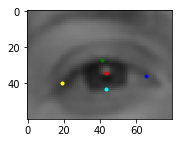

eyeGray: (80, 60)
18  1.0 (2, -2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 117 330
WH: 132 99.0
eyeXY: 117 330
eyeWH: 132 99


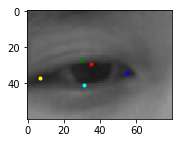

eyeGray: (80, 60)
XY: 316 325
WH: 129 96.75
eyeXY: 316 325
eyeWH: 129 96


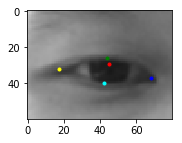

eyeGray: (80, 60)
19  1.0 (2, -2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 120 324
WH: 127 95.25
eyeXY: 120 324
eyeWH: 127 95


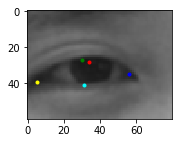

eyeGray: (80, 60)
XY: 319 316
WH: 130 97.5
eyeXY: 319 316
eyeWH: 130 97


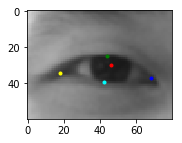

eyeGray: (80, 60)
20  1.0 (2, -2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 114 333
WH: 132 99.0
eyeXY: 114 333
eyeWH: 132 99


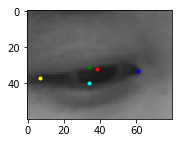

eyeGray: (80, 60)
XY: 314 322
WH: 137 102.75
eyeXY: 314 322
eyeWH: 137 102


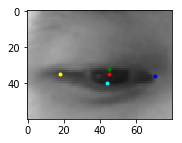

eyeGray: (80, 60)
21  1.0 (2, -2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 114 328
WH: 135 101.25
eyeXY: 114 328
eyeWH: 135 101


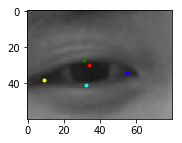

eyeGray: (80, 60)
XY: 318 323
WH: 131 98.25
eyeXY: 318 323
eyeWH: 131 98


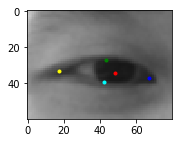

eyeGray: (80, 60)
22  1.0 (2, -2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 123 329
WH: 131 98.25
eyeXY: 123 329
eyeWH: 131 98


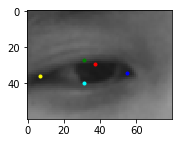

eyeGray: (80, 60)
XY: 324 324
WH: 128 96.0
eyeXY: 324 324
eyeWH: 128 96


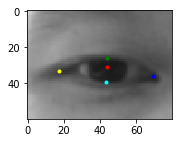

eyeGray: (80, 60)
1  1.0 (0, 0)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 303 263
WH: 84 63.0
eyeXY: 303 263
eyeWH: 84 63


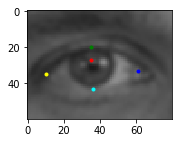

eyeGray: (80, 60)
XY: 443 257
WH: 75 56.25
eyeXY: 443 257
eyeWH: 75 56


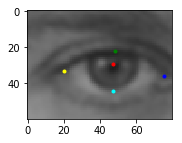

eyeGray: (80, 60)
2  1.0 (0, 0)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 254 207
WH: 75 56.25
eyeXY: 254 207
eyeWH: 75 56


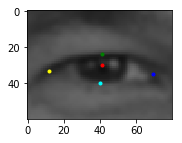

eyeGray: (80, 60)
XY: 391 217
WH: 69 51.75
eyeXY: 391 217
eyeWH: 69 51


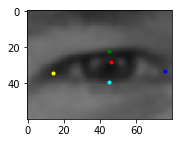

eyeGray: (80, 60)
3  1.0 (0, 0)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 268 214
WH: 66 49.5
eyeXY: 268 214
eyeWH: 66 49


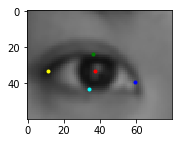

eyeGray: (80, 60)
XY: 369 220
WH: 63 47.25
eyeXY: 369 220
eyeWH: 63 47


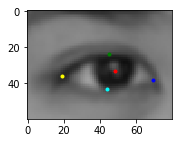

eyeGray: (80, 60)
4  1.0 (0, 0)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 268 225
WH: 65 48.75
eyeXY: 268 225
eyeWH: 65 48


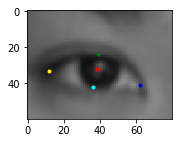

eyeGray: (80, 60)
XY: 373 233
WH: 63 47.25
eyeXY: 373 233
eyeWH: 63 47


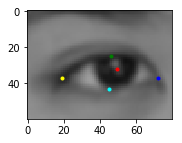

eyeGray: (80, 60)
5  1.0 (0, 0)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 255 203
WH: 88 66.0
eyeXY: 255 203
eyeWH: 88 66


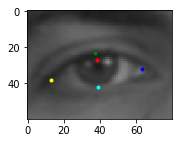

eyeGray: (80, 60)
XY: 403 201
WH: 89 66.75
eyeXY: 403 201
eyeWH: 89 66


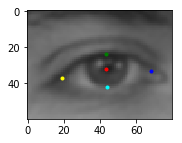

eyeGray: (80, 60)
6  1.0 (0, 0)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 309 262
WH: 60 45.0
eyeXY: 309 262
eyeWH: 60 45


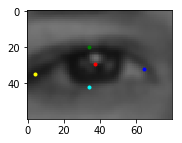

eyeGray: (80, 60)
XY: 421 255
WH: 65 48.75
eyeXY: 421 255
eyeWH: 65 48


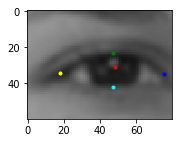

eyeGray: (80, 60)
7  1.0 (0, 0)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 325 255
WH: 62 46.5
eyeXY: 325 255
eyeWH: 62 46


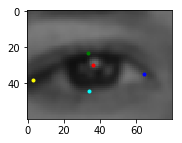

eyeGray: (80, 60)
XY: 438 251
WH: 65 48.75
eyeXY: 438 251
eyeWH: 65 48


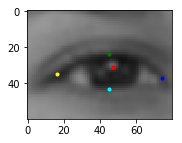

eyeGray: (80, 60)
8  1.0 (0, 0)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 325 223
WH: 59 44.25
eyeXY: 325 223
eyeWH: 59 44


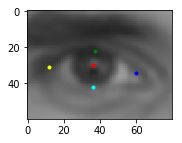

eyeGray: (80, 60)
XY: 426 225
WH: 48 36.0
eyeXY: 426 225
eyeWH: 48 36


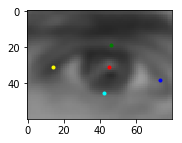

eyeGray: (80, 60)
9  1.0 (0, 0)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 317 222
WH: 53 39.75
eyeXY: 317 222
eyeWH: 53 39


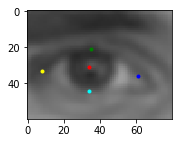

eyeGray: (80, 60)
XY: 411 222
WH: 50 37.5
eyeXY: 411 222
eyeWH: 50 37


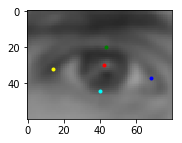

eyeGray: (80, 60)
10  1.0 (0, 0)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 336 193
WH: 64 48.0
eyeXY: 336 193
eyeWH: 64 48


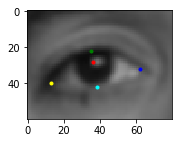

eyeGray: (80, 60)
XY: 436 187
WH: 64 48.0
eyeXY: 436 187
eyeWH: 64 48


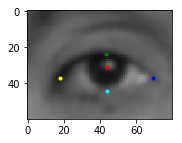

eyeGray: (80, 60)
11  1.0 (0, 0)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 338 193
WH: 68 51.0
eyeXY: 338 193
eyeWH: 68 51


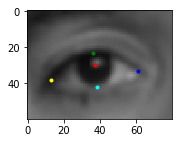

eyeGray: (80, 60)
XY: 440 191
WH: 65 48.75
eyeXY: 440 191
eyeWH: 65 48


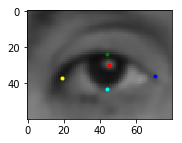

eyeGray: (80, 60)
12  1.0 (0, 0)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 285 168
WH: 63 47.25
eyeXY: 285 168
eyeWH: 63 47


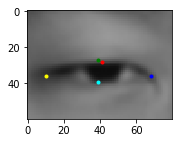

eyeGray: (80, 60)
XY: 383 169
WH: 69 51.75
eyeXY: 383 169
eyeWH: 69 51


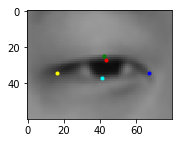

eyeGray: (80, 60)
13  1.0 (0, 0)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 312 160
WH: 59 44.25
eyeXY: 312 160
eyeWH: 59 44


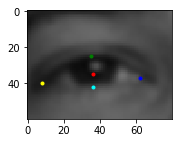

eyeGray: (80, 60)
XY: 414 164
WH: 64 48.0
eyeXY: 414 164
eyeWH: 64 48


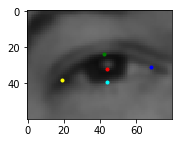

eyeGray: (80, 60)
14  1.0 (0, 0)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 301 160
WH: 59 44.25
eyeXY: 301 160
eyeWH: 59 44


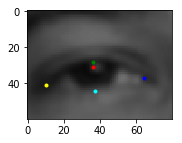

eyeGray: (80, 60)
XY: 402 164
WH: 64 48.0
eyeXY: 402 164
eyeWH: 64 48


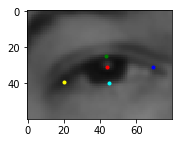

eyeGray: (80, 60)
15  1.0 (0, 0)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 325 182
WH: 57 42.75
eyeXY: 325 182
eyeWH: 57 42


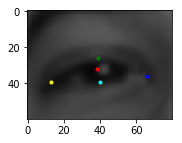

eyeGray: (80, 60)
XY: 416 184
WH: 67 50.25
eyeXY: 416 184
eyeWH: 67 50


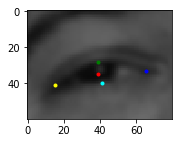

eyeGray: (80, 60)
16  1.0 (0, 0)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 343 187
WH: 60 45.0
eyeXY: 343 187
eyeWH: 60 45


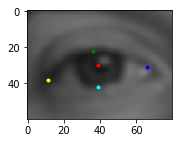

eyeGray: (80, 60)
XY: 442 180
WH: 67 50.25
eyeXY: 442 180
eyeWH: 67 50


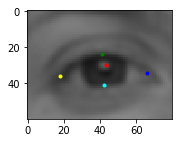

eyeGray: (80, 60)
17  1.0 (0, 0)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 329 186
WH: 66 49.5
eyeXY: 329 186
eyeWH: 66 49


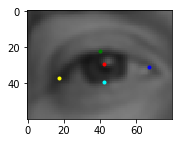

eyeGray: (80, 60)
XY: 430 181
WH: 69 51.75
eyeXY: 430 181
eyeWH: 69 51


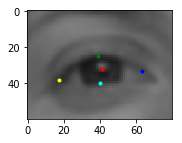

eyeGray: (80, 60)
18  1.0 (0, 0)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 115 332
WH: 132 99.0
eyeXY: 115 332
eyeWH: 132 99


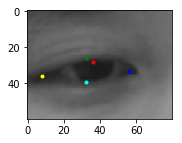

eyeGray: (80, 60)
XY: 314 327
WH: 129 96.75
eyeXY: 314 327
eyeWH: 129 96


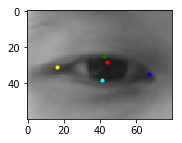

eyeGray: (80, 60)
19  1.0 (0, 0)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 118 326
WH: 127 95.25
eyeXY: 118 326
eyeWH: 127 95


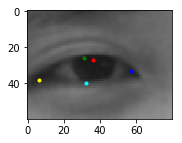

eyeGray: (80, 60)
XY: 317 318
WH: 130 97.5
eyeXY: 317 318
eyeWH: 130 97


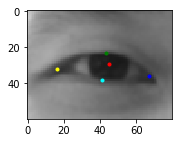

eyeGray: (80, 60)
20  1.0 (0, 0)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 112 335
WH: 132 99.0
eyeXY: 112 335
eyeWH: 132 99


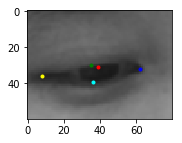

eyeGray: (80, 60)
XY: 312 324
WH: 137 102.75
eyeXY: 312 324
eyeWH: 137 102


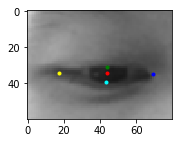

eyeGray: (80, 60)
21  1.0 (0, 0)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 112 330
WH: 135 101.25
eyeXY: 112 330
eyeWH: 135 101


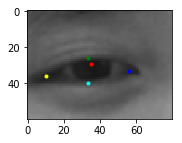

eyeGray: (80, 60)
XY: 316 325
WH: 131 98.25
eyeXY: 316 325
eyeWH: 131 98


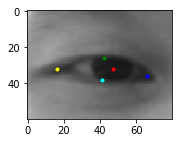

eyeGray: (80, 60)
22  1.0 (0, 0)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 121 331
WH: 131 98.25
eyeXY: 121 331
eyeWH: 131 98


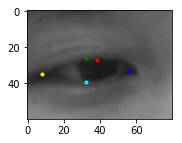

eyeGray: (80, 60)
XY: 322 326
WH: 128 96.0
eyeXY: 322 326
eyeWH: 128 96


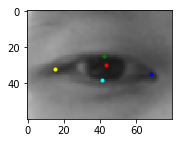

eyeGray: (80, 60)
1  1.0 (-2, 2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 301 265
WH: 84 63.0
eyeXY: 301 265
eyeWH: 84 63


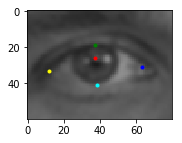

eyeGray: (80, 60)
XY: 441 259
WH: 75 56.25
eyeXY: 441 259
eyeWH: 75 56


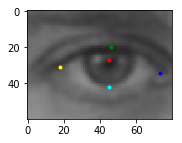

eyeGray: (80, 60)
2  1.0 (-2, 2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 252 209
WH: 75 56.25
eyeXY: 252 209
eyeWH: 75 56


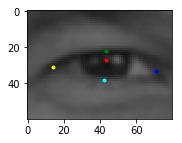

eyeGray: (80, 60)
XY: 389 219
WH: 69 51.75
eyeXY: 389 219
eyeWH: 69 51


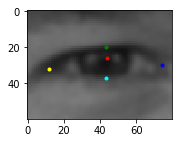

eyeGray: (80, 60)
3  1.0 (-2, 2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 266 216
WH: 66 49.5
eyeXY: 266 216
eyeWH: 66 49


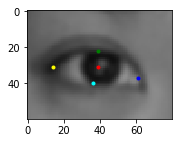

eyeGray: (80, 60)
XY: 367 222
WH: 63 47.25
eyeXY: 367 222
eyeWH: 63 47


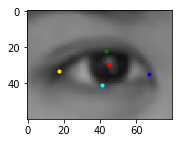

eyeGray: (80, 60)
4  1.0 (-2, 2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 266 227
WH: 65 48.75
eyeXY: 266 227
eyeWH: 65 48


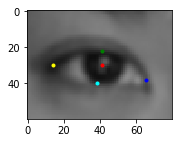

eyeGray: (80, 60)
XY: 371 235
WH: 63 47.25
eyeXY: 371 235
eyeWH: 63 47


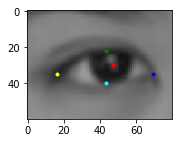

eyeGray: (80, 60)
5  1.0 (-2, 2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 253 205
WH: 88 66.0
eyeXY: 253 205
eyeWH: 88 66


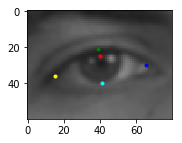

eyeGray: (80, 60)
XY: 401 203
WH: 89 66.75
eyeXY: 401 203
eyeWH: 89 66


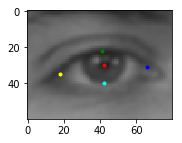

eyeGray: (80, 60)
6  1.0 (-2, 2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 307 264
WH: 60 45.0
eyeXY: 307 264
eyeWH: 60 45


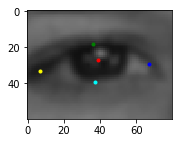

eyeGray: (80, 60)
XY: 419 257
WH: 65 48.75
eyeXY: 419 257
eyeWH: 65 48


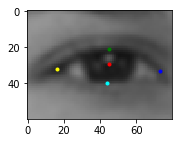

eyeGray: (80, 60)
7  1.0 (-2, 2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 323 257
WH: 62 46.5
eyeXY: 323 257
eyeWH: 62 46


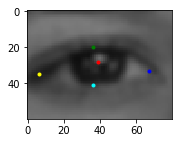

eyeGray: (80, 60)
XY: 436 253
WH: 65 48.75
eyeXY: 436 253
eyeWH: 65 48


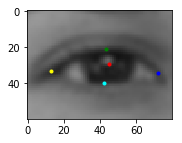

eyeGray: (80, 60)
8  1.0 (-2, 2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 323 225
WH: 59 44.25
eyeXY: 323 225
eyeWH: 59 44


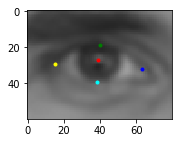

eyeGray: (80, 60)
XY: 424 227
WH: 48 36.0
eyeXY: 424 227
eyeWH: 48 36


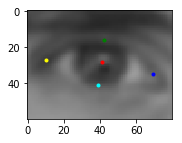

eyeGray: (80, 60)
9  1.0 (-2, 2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 315 224
WH: 53 39.75
eyeXY: 315 224
eyeWH: 53 39


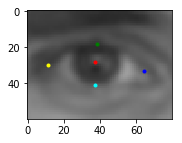

eyeGray: (80, 60)
XY: 409 224
WH: 50 37.5
eyeXY: 409 224
eyeWH: 50 37


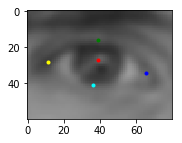

eyeGray: (80, 60)
10  1.0 (-2, 2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 334 195
WH: 64 48.0
eyeXY: 334 195
eyeWH: 64 48


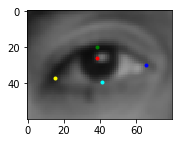

eyeGray: (80, 60)
XY: 434 189
WH: 64 48.0
eyeXY: 434 189
eyeWH: 64 48


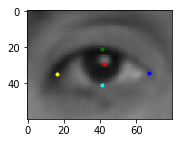

eyeGray: (80, 60)
11  1.0 (-2, 2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 336 195
WH: 68 51.0
eyeXY: 336 195
eyeWH: 68 51


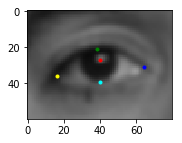

eyeGray: (80, 60)
XY: 438 193
WH: 65 48.75
eyeXY: 438 193
eyeWH: 65 48


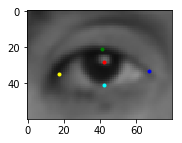

eyeGray: (80, 60)
12  1.0 (-2, 2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 283 170
WH: 63 47.25
eyeXY: 283 170
eyeWH: 63 47


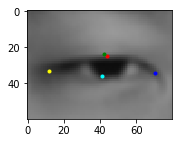

eyeGray: (80, 60)
XY: 381 171
WH: 69 51.75
eyeXY: 381 171
eyeWH: 69 51


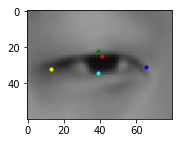

eyeGray: (80, 60)
13  1.0 (-2, 2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 310 162
WH: 59 44.25
eyeXY: 310 162
eyeWH: 59 44


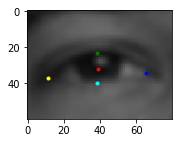

eyeGray: (80, 60)
XY: 412 166
WH: 64 48.0
eyeXY: 412 166
eyeWH: 64 48


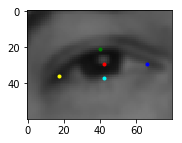

eyeGray: (80, 60)
14  1.0 (-2, 2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 299 162
WH: 59 44.25
eyeXY: 299 162
eyeWH: 59 44


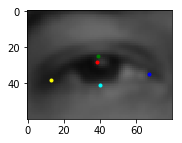

eyeGray: (80, 60)
XY: 400 166
WH: 64 48.0
eyeXY: 400 166
eyeWH: 64 48


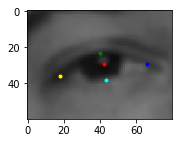

eyeGray: (80, 60)
15  1.0 (-2, 2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 323 184
WH: 57 42.75
eyeXY: 323 184
eyeWH: 57 42


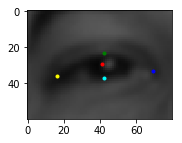

eyeGray: (80, 60)
XY: 414 186
WH: 67 50.25
eyeXY: 414 186
eyeWH: 67 50


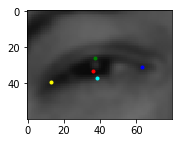

eyeGray: (80, 60)
16  1.0 (-2, 2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 341 189
WH: 60 45.0
eyeXY: 341 189
eyeWH: 60 45


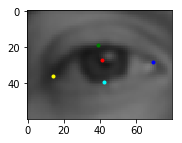

eyeGray: (80, 60)
XY: 440 182
WH: 67 50.25
eyeXY: 440 182
eyeWH: 67 50


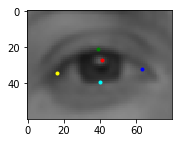

eyeGray: (80, 60)
17  1.0 (-2, 2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 327 188
WH: 66 49.5
eyeXY: 327 188
eyeWH: 66 49


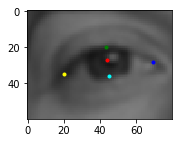

eyeGray: (80, 60)
XY: 428 183
WH: 69 51.75
eyeXY: 428 183
eyeWH: 69 51


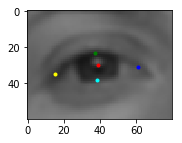

eyeGray: (80, 60)
18  1.0 (-2, 2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 113 334
WH: 132 99.0
eyeXY: 113 334
eyeWH: 132 99


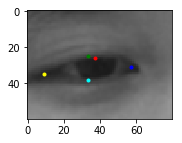

eyeGray: (80, 60)
XY: 312 329
WH: 129 96.75
eyeXY: 312 329
eyeWH: 129 96


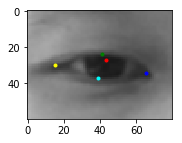

eyeGray: (80, 60)
19  1.0 (-2, 2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 116 328
WH: 127 95.25
eyeXY: 116 328
eyeWH: 127 95


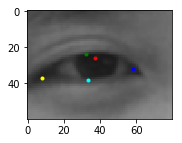

eyeGray: (80, 60)
XY: 315 320
WH: 130 97.5
eyeXY: 315 320
eyeWH: 130 97


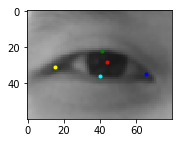

eyeGray: (80, 60)
20  1.0 (-2, 2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 110 337
WH: 132 99.0
eyeXY: 110 337
eyeWH: 132 99


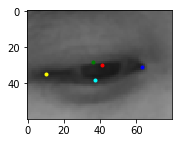

eyeGray: (80, 60)
XY: 310 326
WH: 137 102.75
eyeXY: 310 326
eyeWH: 137 102


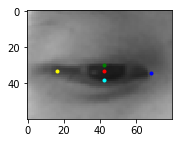

eyeGray: (80, 60)
21  1.0 (-2, 2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 110 332
WH: 135 101.25
eyeXY: 110 332
eyeWH: 135 101


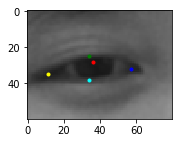

eyeGray: (80, 60)
XY: 314 327
WH: 131 98.25
eyeXY: 314 327
eyeWH: 131 98


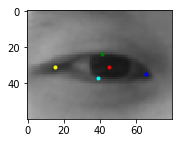

eyeGray: (80, 60)
22  1.0 (-2, 2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 119 333
WH: 131 98.25
eyeXY: 119 333
eyeWH: 131 98


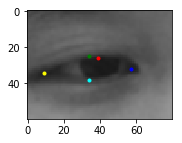

eyeGray: (80, 60)
XY: 320 328
WH: 128 96.0
eyeXY: 320 328
eyeWH: 128 96


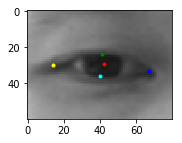

eyeGray: (80, 60)
1  1.0 (2, 2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 305 265
WH: 84 63.0
eyeXY: 305 265
eyeWH: 84 63


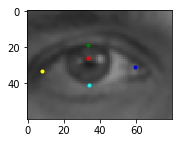

eyeGray: (80, 60)
XY: 445 259
WH: 75 56.25
eyeXY: 445 259
eyeWH: 75 56


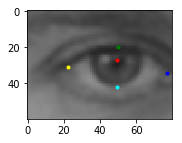

eyeGray: (80, 60)
2  1.0 (2, 2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 256 209
WH: 75 56.25
eyeXY: 256 209
eyeWH: 75 56


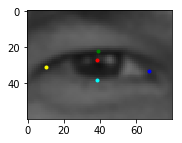

eyeGray: (80, 60)
XY: 393 219
WH: 69 51.75
eyeXY: 393 219
eyeWH: 69 51


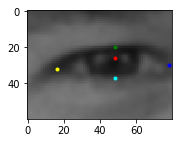

eyeGray: (80, 60)
3  1.0 (2, 2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 270 216
WH: 66 49.5
eyeXY: 270 216
eyeWH: 66 49


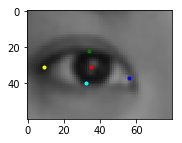

eyeGray: (80, 60)
XY: 371 222
WH: 63 47.25
eyeXY: 371 222
eyeWH: 63 47


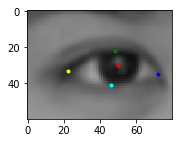

eyeGray: (80, 60)
4  1.0 (2, 2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 270 227
WH: 65 48.75
eyeXY: 270 227
eyeWH: 65 48


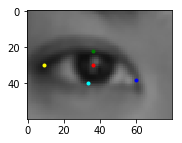

eyeGray: (80, 60)
XY: 375 235
WH: 63 47.25
eyeXY: 375 235
eyeWH: 63 47


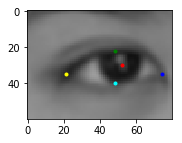

eyeGray: (80, 60)
5  1.0 (2, 2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 257 205
WH: 88 66.0
eyeXY: 257 205
eyeWH: 88 66


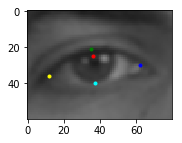

eyeGray: (80, 60)
XY: 405 203
WH: 89 66.75
eyeXY: 405 203
eyeWH: 89 66


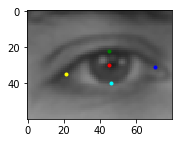

eyeGray: (80, 60)
6  1.0 (2, 2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 311 264
WH: 60 45.0
eyeXY: 311 264
eyeWH: 60 45


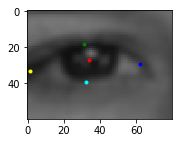

eyeGray: (80, 60)
XY: 423 257
WH: 65 48.75
eyeXY: 423 257
eyeWH: 65 48


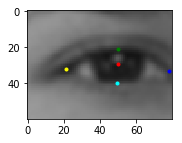

eyeGray: (80, 60)
7  1.0 (2, 2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 327 257
WH: 62 46.5
eyeXY: 327 257
eyeWH: 62 46


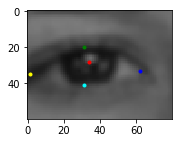

eyeGray: (80, 60)
XY: 440 253
WH: 65 48.75
eyeXY: 440 253
eyeWH: 65 48


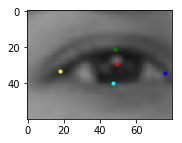

eyeGray: (80, 60)
8  1.0 (2, 2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 327 225
WH: 59 44.25
eyeXY: 327 225
eyeWH: 59 44


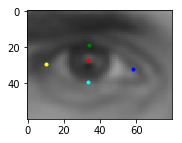

eyeGray: (80, 60)
XY: 428 227
WH: 48 36.0
eyeXY: 428 227
eyeWH: 48 36


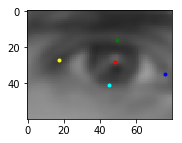

eyeGray: (80, 60)
9  1.0 (2, 2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 319 224
WH: 53 39.75
eyeXY: 319 224
eyeWH: 53 39


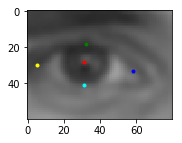

eyeGray: (80, 60)
XY: 413 224
WH: 50 37.5
eyeXY: 413 224
eyeWH: 50 37


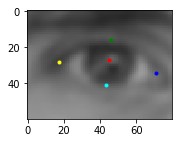

eyeGray: (80, 60)
10  1.0 (2, 2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 338 195
WH: 64 48.0
eyeXY: 338 195
eyeWH: 64 48


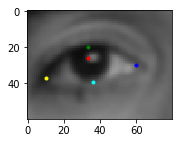

eyeGray: (80, 60)
XY: 438 189
WH: 64 48.0
eyeXY: 438 189
eyeWH: 64 48


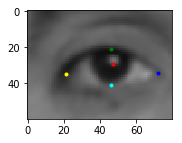

eyeGray: (80, 60)
11  1.0 (2, 2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 340 195
WH: 68 51.0
eyeXY: 340 195
eyeWH: 68 51


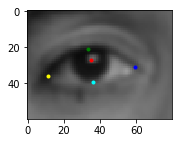

eyeGray: (80, 60)
XY: 442 193
WH: 65 48.75
eyeXY: 442 193
eyeWH: 65 48


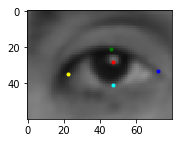

eyeGray: (80, 60)
12  1.0 (2, 2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 287 170
WH: 63 47.25
eyeXY: 287 170
eyeWH: 63 47


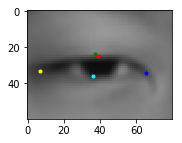

eyeGray: (80, 60)
XY: 385 171
WH: 69 51.75
eyeXY: 385 171
eyeWH: 69 51


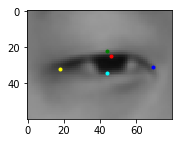

eyeGray: (80, 60)
13  1.0 (2, 2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 314 162
WH: 59 44.25
eyeXY: 314 162
eyeWH: 59 44


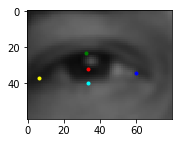

eyeGray: (80, 60)
XY: 416 166
WH: 64 48.0
eyeXY: 416 166
eyeWH: 64 48


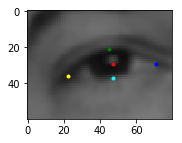

eyeGray: (80, 60)
14  1.0 (2, 2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 303 162
WH: 59 44.25
eyeXY: 303 162
eyeWH: 59 44


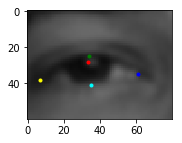

eyeGray: (80, 60)
XY: 404 166
WH: 64 48.0
eyeXY: 404 166
eyeWH: 64 48


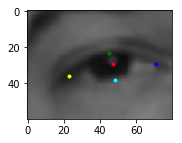

eyeGray: (80, 60)
15  1.0 (2, 2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 327 184
WH: 57 42.75
eyeXY: 327 184
eyeWH: 57 42


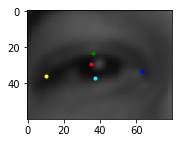

eyeGray: (80, 60)
XY: 418 186
WH: 67 50.25
eyeXY: 418 186
eyeWH: 67 50


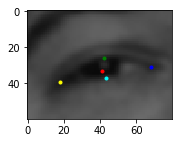

eyeGray: (80, 60)
16  1.0 (2, 2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 345 189
WH: 60 45.0
eyeXY: 345 189
eyeWH: 60 45


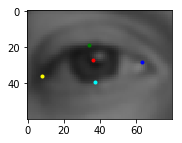

eyeGray: (80, 60)
XY: 444 182
WH: 67 50.25
eyeXY: 444 182
eyeWH: 67 50


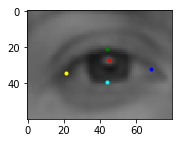

eyeGray: (80, 60)
17  1.0 (2, 2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 331 188
WH: 66 49.5
eyeXY: 331 188
eyeWH: 66 49


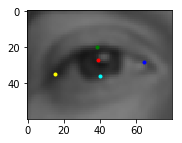

eyeGray: (80, 60)
XY: 432 183
WH: 69 51.75
eyeXY: 432 183
eyeWH: 69 51


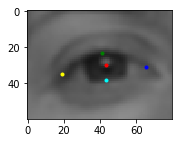

eyeGray: (80, 60)
18  1.0 (2, 2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 117 334
WH: 132 99.0
eyeXY: 117 334
eyeWH: 132 99


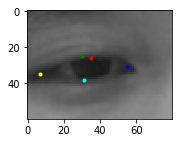

eyeGray: (80, 60)
XY: 316 329
WH: 129 96.75
eyeXY: 316 329
eyeWH: 129 96


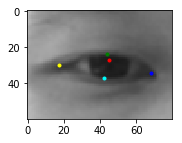

eyeGray: (80, 60)
19  1.0 (2, 2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 120 328
WH: 127 95.25
eyeXY: 120 328
eyeWH: 127 95


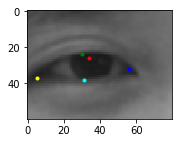

eyeGray: (80, 60)
XY: 319 320
WH: 130 97.5
eyeXY: 319 320
eyeWH: 130 97


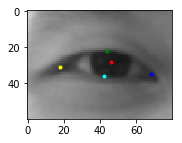

eyeGray: (80, 60)
20  1.0 (2, 2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 114 337
WH: 132 99.0
eyeXY: 114 337
eyeWH: 132 99


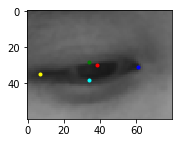

eyeGray: (80, 60)
XY: 314 326
WH: 137 102.75
eyeXY: 314 326
eyeWH: 137 102


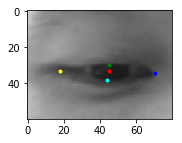

eyeGray: (80, 60)
21  1.0 (2, 2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 114 332
WH: 135 101.25
eyeXY: 114 332
eyeWH: 135 101


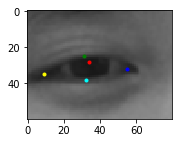

eyeGray: (80, 60)
XY: 318 327
WH: 131 98.25
eyeXY: 318 327
eyeWH: 131 98


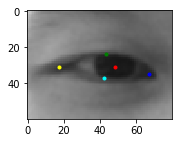

eyeGray: (80, 60)
22  1.0 (2, 2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 123 333
WH: 131 98.25
eyeXY: 123 333
eyeWH: 131 98


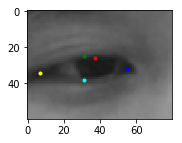

eyeGray: (80, 60)
XY: 324 328
WH: 128 96.0
eyeXY: 324 328
eyeWH: 128 96


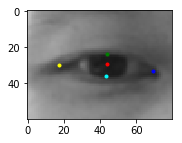

eyeGray: (80, 60)
1  1.1 (-2, -2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 301 261
WH: 84 63.0
eyeXY: 301 261
eyeWH: 92 69


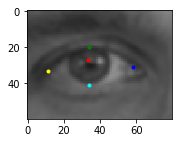

eyeGray: (80, 60)
XY: 441 255
WH: 75 56.25
eyeXY: 441 255
eyeWH: 83 62


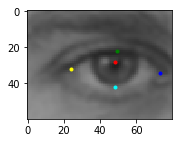

eyeGray: (80, 60)
2  1.1 (-2, -2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 252 205
WH: 75 56.25
eyeXY: 252 205
eyeWH: 83 62


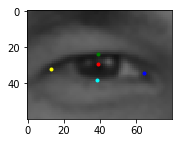

eyeGray: (80, 60)
XY: 389 215
WH: 69 51.75
eyeXY: 389 215
eyeWH: 76 57


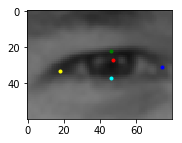

eyeGray: (80, 60)
3  1.1 (-2, -2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 266 212
WH: 66 49.5
eyeXY: 266 212
eyeWH: 73 54


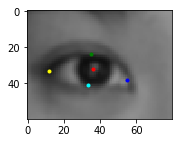

eyeGray: (80, 60)
XY: 367 218
WH: 63 47.25
eyeXY: 367 218
eyeWH: 69 51


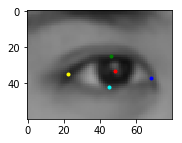

eyeGray: (80, 60)
4  1.1 (-2, -2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 266 223
WH: 65 48.75
eyeXY: 266 223
eyeWH: 72 54


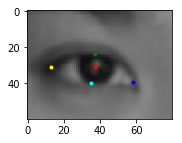

eyeGray: (80, 60)
XY: 371 231
WH: 63 47.25
eyeXY: 371 231
eyeWH: 69 51


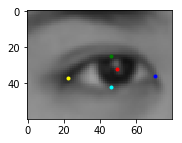

eyeGray: (80, 60)
5  1.1 (-2, -2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 253 201
WH: 88 66.0
eyeXY: 253 201
eyeWH: 97 72


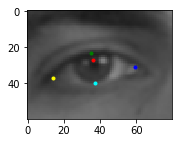

eyeGray: (80, 60)
XY: 401 199
WH: 89 66.75
eyeXY: 401 199
eyeWH: 98 73


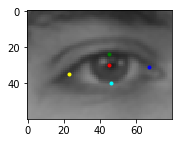

eyeGray: (80, 60)
6  1.1 (-2, -2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 307 260
WH: 60 45.0
eyeXY: 307 260
eyeWH: 66 49


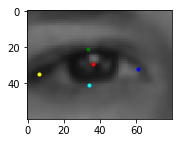

eyeGray: (80, 60)
XY: 419 253
WH: 65 48.75
eyeXY: 419 253
eyeWH: 72 54


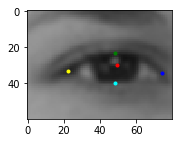

eyeGray: (80, 60)
7  1.1 (-2, -2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 323 253
WH: 62 46.5
eyeXY: 323 253
eyeWH: 68 51


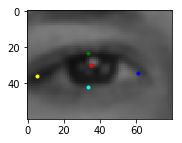

eyeGray: (80, 60)
XY: 436 249
WH: 65 48.75
eyeXY: 436 249
eyeWH: 72 54


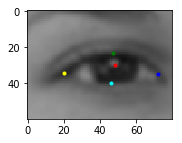

eyeGray: (80, 60)
8  1.1 (-2, -2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 323 221
WH: 59 44.25
eyeXY: 323 221
eyeWH: 65 48


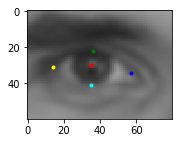

eyeGray: (80, 60)
XY: 424 223
WH: 48 36.0
eyeXY: 424 223
eyeWH: 53 39


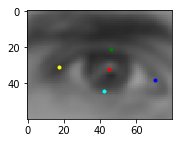

eyeGray: (80, 60)
9  1.1 (-2, -2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 315 220
WH: 53 39.75
eyeXY: 315 220
eyeWH: 58 43


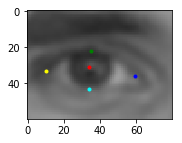

eyeGray: (80, 60)
XY: 409 220
WH: 50 37.5
eyeXY: 409 220
eyeWH: 55 41


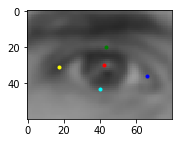

eyeGray: (80, 60)
10  1.1 (-2, -2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 334 191
WH: 64 48.0
eyeXY: 334 191
eyeWH: 70 52


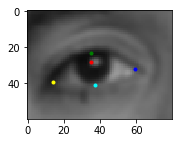

eyeGray: (80, 60)
XY: 434 185
WH: 64 48.0
eyeXY: 434 185
eyeWH: 70 52


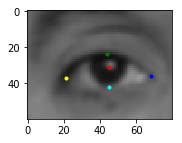

eyeGray: (80, 60)
11  1.1 (-2, -2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 336 191
WH: 68 51.0
eyeXY: 336 191
eyeWH: 75 56


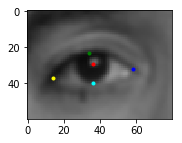

eyeGray: (80, 60)
XY: 438 189
WH: 65 48.75
eyeXY: 438 189
eyeWH: 72 54


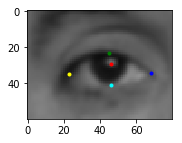

eyeGray: (80, 60)
12  1.1 (-2, -2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 283 166
WH: 63 47.25
eyeXY: 283 166
eyeWH: 69 51


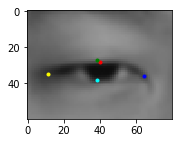

eyeGray: (80, 60)
XY: 381 167
WH: 69 51.75
eyeXY: 381 167
eyeWH: 76 57


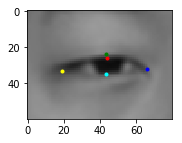

eyeGray: (80, 60)
13  1.1 (-2, -2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 310 158
WH: 59 44.25
eyeXY: 310 158
eyeWH: 65 48


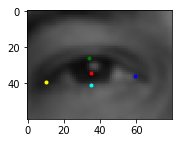

eyeGray: (80, 60)
XY: 412 162
WH: 64 48.0
eyeXY: 412 162
eyeWH: 70 52


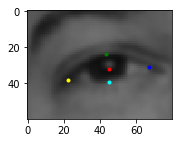

eyeGray: (80, 60)
14  1.1 (-2, -2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 299 158
WH: 59 44.25
eyeXY: 299 158
eyeWH: 65 48


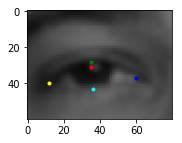

eyeGray: (80, 60)
XY: 400 162
WH: 64 48.0
eyeXY: 400 162
eyeWH: 70 52


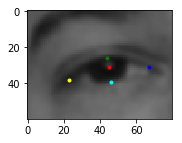

eyeGray: (80, 60)
15  1.1 (-2, -2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 323 180
WH: 57 42.75
eyeXY: 323 180
eyeWH: 63 47


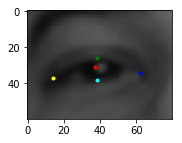

eyeGray: (80, 60)
XY: 414 182
WH: 67 50.25
eyeXY: 414 182
eyeWH: 74 55


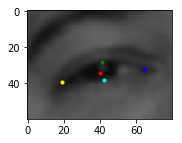

eyeGray: (80, 60)
16  1.1 (-2, -2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 341 185
WH: 60 45.0
eyeXY: 341 185
eyeWH: 66 49


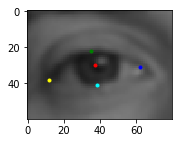

eyeGray: (80, 60)
XY: 440 178
WH: 67 50.25
eyeXY: 440 178
eyeWH: 74 55


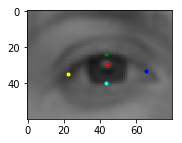

eyeGray: (80, 60)
17  1.1 (-2, -2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 327 184
WH: 66 49.5
eyeXY: 327 184
eyeWH: 73 54


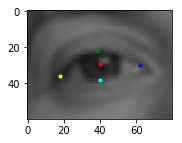

eyeGray: (80, 60)
XY: 428 179
WH: 69 51.75
eyeXY: 428 179
eyeWH: 76 57


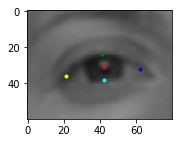

eyeGray: (80, 60)
18  1.1 (-2, -2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 113 330
WH: 132 99.0
eyeXY: 113 330
eyeWH: 145 108


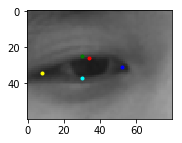

eyeGray: (80, 60)
XY: 312 325
WH: 129 96.75
eyeXY: 312 325
eyeWH: 142 106


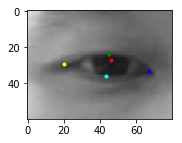

eyeGray: (80, 60)
19  1.1 (-2, -2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 116 324
WH: 127 95.25
eyeXY: 116 324
eyeWH: 140 105


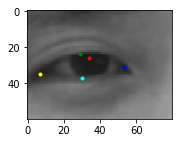

eyeGray: (80, 60)
XY: 315 316
WH: 130 97.5
eyeXY: 315 316
eyeWH: 143 107


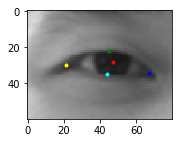

eyeGray: (80, 60)
20  1.1 (-2, -2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 110 333
WH: 132 99.0
eyeXY: 110 333
eyeWH: 145 108


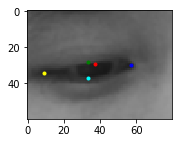

eyeGray: (80, 60)
XY: 310 322
WH: 137 102.75
eyeXY: 310 322
eyeWH: 151 113


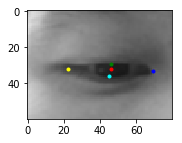

eyeGray: (80, 60)
21  1.1 (-2, -2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 110 328
WH: 135 101.25
eyeXY: 110 328
eyeWH: 149 111


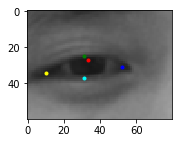

eyeGray: (80, 60)
XY: 314 323
WH: 131 98.25
eyeXY: 314 323
eyeWH: 144 108


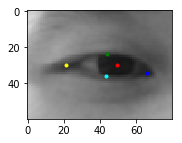

eyeGray: (80, 60)
22  1.1 (-2, -2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 119 329
WH: 131 98.25
eyeXY: 119 329
eyeWH: 144 108


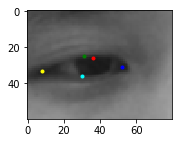

eyeGray: (80, 60)
XY: 320 324
WH: 128 96.0
eyeXY: 320 324
eyeWH: 141 105


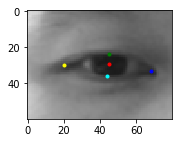

eyeGray: (80, 60)
1  1.1 (2, -2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 305 261
WH: 84 63.0
eyeXY: 305 261
eyeWH: 92 69


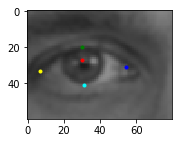

eyeGray: (80, 60)
XY: 445 255
WH: 75 56.25
eyeXY: 445 255
eyeWH: 83 62


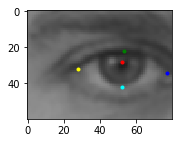

eyeGray: (80, 60)
2  1.1 (2, -2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 256 205
WH: 75 56.25
eyeXY: 256 205
eyeWH: 83 62


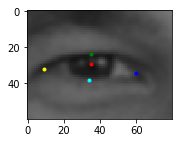

eyeGray: (80, 60)
XY: 393 215
WH: 69 51.75
eyeXY: 393 215
eyeWH: 76 57


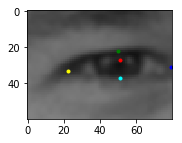

eyeGray: (80, 60)
3  1.1 (2, -2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 270 212
WH: 66 49.5
eyeXY: 270 212
eyeWH: 73 54


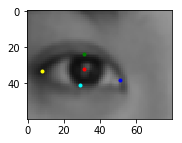

eyeGray: (80, 60)
XY: 371 218
WH: 63 47.25
eyeXY: 371 218
eyeWH: 69 51


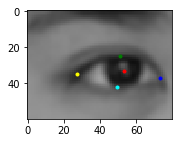

eyeGray: (80, 60)
4  1.1 (2, -2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 270 223
WH: 65 48.75
eyeXY: 270 223
eyeWH: 72 54


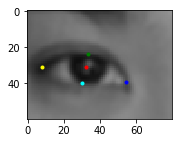

eyeGray: (80, 60)
XY: 375 231
WH: 63 47.25
eyeXY: 375 231
eyeWH: 69 51


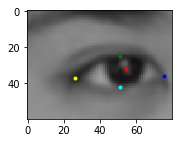

eyeGray: (80, 60)
5  1.1 (2, -2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 257 201
WH: 88 66.0
eyeXY: 257 201
eyeWH: 97 72


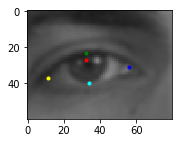

eyeGray: (80, 60)
XY: 405 199
WH: 89 66.75
eyeXY: 405 199
eyeWH: 98 73


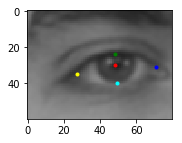

eyeGray: (80, 60)
6  1.1 (2, -2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 311 260
WH: 60 45.0
eyeXY: 311 260
eyeWH: 66 49


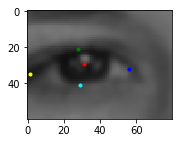

eyeGray: (80, 60)
XY: 423 253
WH: 65 48.75
eyeXY: 423 253
eyeWH: 72 54


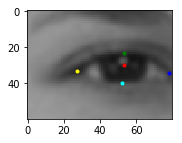

eyeGray: (80, 60)
7  1.1 (2, -2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 327 253
WH: 62 46.5
eyeXY: 327 253
eyeWH: 68 51


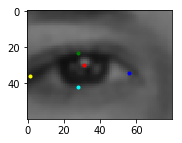

eyeGray: (80, 60)
XY: 440 249
WH: 65 48.75
eyeXY: 440 249
eyeWH: 72 54


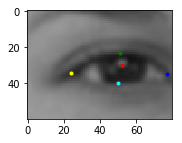

eyeGray: (80, 60)
8  1.1 (2, -2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 327 221
WH: 59 44.25
eyeXY: 327 221
eyeWH: 65 48


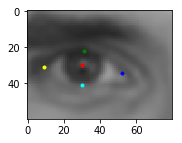

eyeGray: (80, 60)
XY: 428 223
WH: 48 36.0
eyeXY: 428 223
eyeWH: 53 39


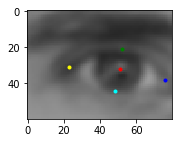

eyeGray: (80, 60)
9  1.1 (2, -2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 319 220
WH: 53 39.75
eyeXY: 319 220
eyeWH: 58 43


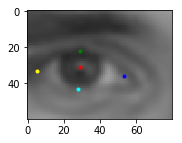

eyeGray: (80, 60)
XY: 413 220
WH: 50 37.5
eyeXY: 413 220
eyeWH: 55 41


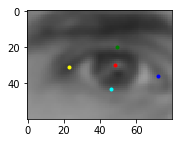

eyeGray: (80, 60)
10  1.1 (2, -2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 338 191
WH: 64 48.0
eyeXY: 338 191
eyeWH: 70 52


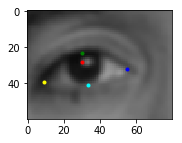

eyeGray: (80, 60)
XY: 438 185
WH: 64 48.0
eyeXY: 438 185
eyeWH: 70 52


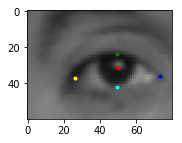

eyeGray: (80, 60)
11  1.1 (2, -2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 340 191
WH: 68 51.0
eyeXY: 340 191
eyeWH: 75 56


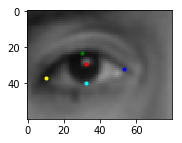

eyeGray: (80, 60)
XY: 442 189
WH: 65 48.75
eyeXY: 442 189
eyeWH: 72 54


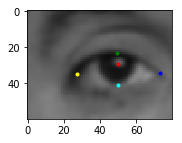

eyeGray: (80, 60)
12  1.1 (2, -2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 287 166
WH: 63 47.25
eyeXY: 287 166
eyeWH: 69 51


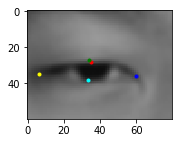

eyeGray: (80, 60)
XY: 385 167
WH: 69 51.75
eyeXY: 385 167
eyeWH: 76 57


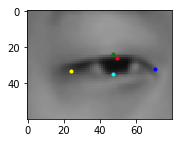

eyeGray: (80, 60)
13  1.1 (2, -2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 314 158
WH: 59 44.25
eyeXY: 314 158
eyeWH: 65 48


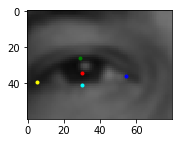

eyeGray: (80, 60)
XY: 416 162
WH: 64 48.0
eyeXY: 416 162
eyeWH: 70 52


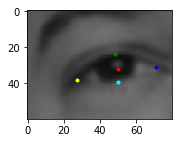

eyeGray: (80, 60)
14  1.1 (2, -2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 303 158
WH: 59 44.25
eyeXY: 303 158
eyeWH: 65 48


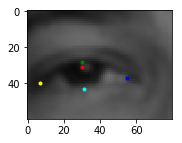

eyeGray: (80, 60)
XY: 404 162
WH: 64 48.0
eyeXY: 404 162
eyeWH: 70 52


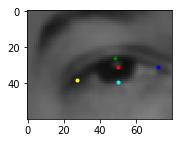

eyeGray: (80, 60)
15  1.1 (2, -2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 327 180
WH: 57 42.75
eyeXY: 327 180
eyeWH: 63 47


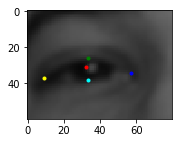

eyeGray: (80, 60)
XY: 418 182
WH: 67 50.25
eyeXY: 418 182
eyeWH: 74 55


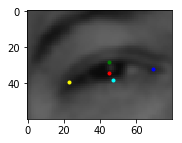

eyeGray: (80, 60)
16  1.1 (2, -2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 345 185
WH: 60 45.0
eyeXY: 345 185
eyeWH: 66 49


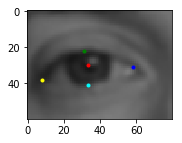

eyeGray: (80, 60)
XY: 444 178
WH: 67 50.25
eyeXY: 444 178
eyeWH: 74 55


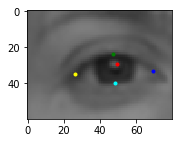

eyeGray: (80, 60)
17  1.1 (2, -2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 331 184
WH: 66 49.5
eyeXY: 331 184
eyeWH: 73 54


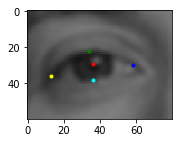

eyeGray: (80, 60)
XY: 432 179
WH: 69 51.75
eyeXY: 432 179
eyeWH: 76 57


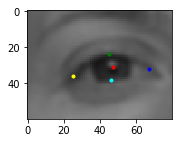

eyeGray: (80, 60)
18  1.1 (2, -2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 117 330
WH: 132 99.0
eyeXY: 117 330
eyeWH: 145 108


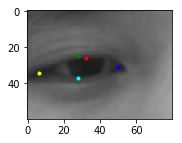

eyeGray: (80, 60)
XY: 316 325
WH: 129 96.75
eyeXY: 316 325
eyeWH: 142 106


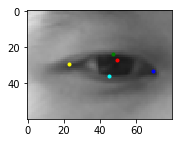

eyeGray: (80, 60)
19  1.1 (2, -2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 120 324
WH: 127 95.25
eyeXY: 120 324
eyeWH: 140 105


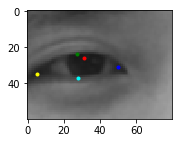

eyeGray: (80, 60)
XY: 319 316
WH: 130 97.5
eyeXY: 319 316
eyeWH: 143 107


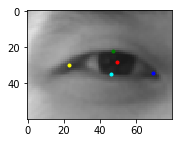

eyeGray: (80, 60)
20  1.1 (2, -2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 114 333
WH: 132 99.0
eyeXY: 114 333
eyeWH: 145 108


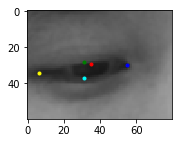

eyeGray: (80, 60)
XY: 314 322
WH: 137 102.75
eyeXY: 314 322
eyeWH: 151 113


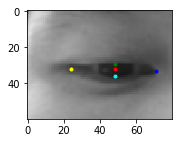

eyeGray: (80, 60)
21  1.1 (2, -2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 114 328
WH: 135 101.25
eyeXY: 114 328
eyeWH: 149 111


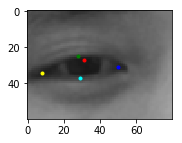

eyeGray: (80, 60)
XY: 318 323
WH: 131 98.25
eyeXY: 318 323
eyeWH: 144 108


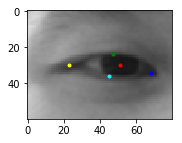

eyeGray: (80, 60)
22  1.1 (2, -2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 123 329
WH: 131 98.25
eyeXY: 123 329
eyeWH: 144 108


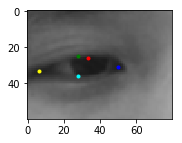

eyeGray: (80, 60)
XY: 324 324
WH: 128 96.0
eyeXY: 324 324
eyeWH: 141 105


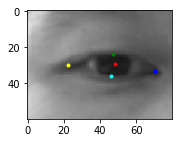

eyeGray: (80, 60)
1  1.1 (0, 0)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 303 263
WH: 84 63.0
eyeXY: 303 263
eyeWH: 92 69


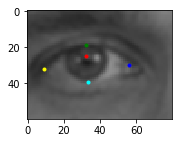

eyeGray: (80, 60)
XY: 443 257
WH: 75 56.25
eyeXY: 443 257
eyeWH: 83 62


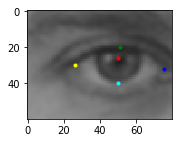

eyeGray: (80, 60)
2  1.1 (0, 0)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 254 207
WH: 75 56.25
eyeXY: 254 207
eyeWH: 83 62


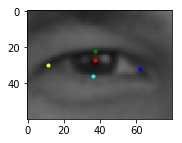

eyeGray: (80, 60)
XY: 391 217
WH: 69 51.75
eyeXY: 391 217
eyeWH: 76 57


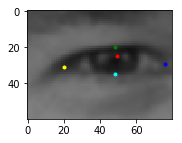

eyeGray: (80, 60)
3  1.1 (0, 0)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 268 214
WH: 66 49.5
eyeXY: 268 214
eyeWH: 73 54


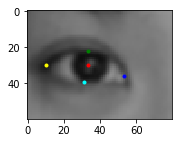

eyeGray: (80, 60)
XY: 369 220
WH: 63 47.25
eyeXY: 369 220
eyeWH: 69 51


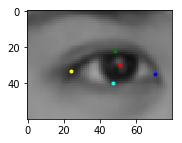

eyeGray: (80, 60)
4  1.1 (0, 0)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 268 225
WH: 65 48.75
eyeXY: 268 225
eyeWH: 72 54


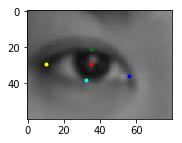

eyeGray: (80, 60)
XY: 373 233
WH: 63 47.25
eyeXY: 373 233
eyeWH: 69 51


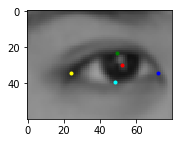

eyeGray: (80, 60)
5  1.1 (0, 0)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 255 203
WH: 88 66.0
eyeXY: 255 203
eyeWH: 97 72


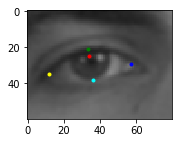

eyeGray: (80, 60)
XY: 403 201
WH: 89 66.75
eyeXY: 403 201
eyeWH: 98 73


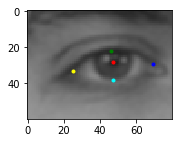

eyeGray: (80, 60)
6  1.1 (0, 0)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 309 262
WH: 60 45.0
eyeXY: 309 262
eyeWH: 66 49


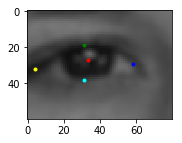

eyeGray: (80, 60)
XY: 421 255
WH: 65 48.75
eyeXY: 421 255
eyeWH: 72 54


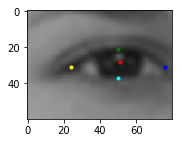

eyeGray: (80, 60)
7  1.1 (0, 0)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 325 255
WH: 62 46.5
eyeXY: 325 255
eyeWH: 68 51


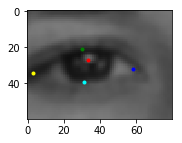

eyeGray: (80, 60)
XY: 438 251
WH: 65 48.75
eyeXY: 438 251
eyeWH: 72 54


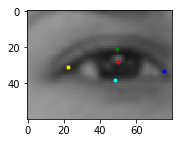

eyeGray: (80, 60)
8  1.1 (0, 0)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 325 223
WH: 59 44.25
eyeXY: 325 223
eyeWH: 65 48


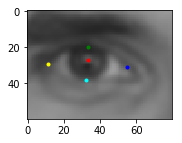

eyeGray: (80, 60)
XY: 426 225
WH: 48 36.0
eyeXY: 426 225
eyeWH: 53 39


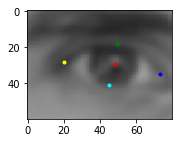

eyeGray: (80, 60)
9  1.1 (0, 0)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 317 222
WH: 53 39.75
eyeXY: 317 222
eyeWH: 58 43


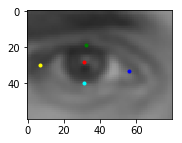

eyeGray: (80, 60)
XY: 411 222
WH: 50 37.5
eyeXY: 411 222
eyeWH: 55 41


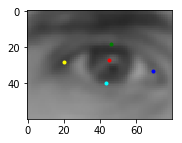

eyeGray: (80, 60)
10  1.1 (0, 0)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 336 193
WH: 64 48.0
eyeXY: 336 193
eyeWH: 70 52


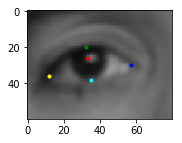

eyeGray: (80, 60)
XY: 436 187
WH: 64 48.0
eyeXY: 436 187
eyeWH: 70 52


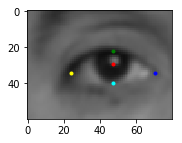

eyeGray: (80, 60)
11  1.1 (0, 0)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 338 193
WH: 68 51.0
eyeXY: 338 193
eyeWH: 75 56


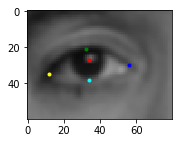

eyeGray: (80, 60)
XY: 440 191
WH: 65 48.75
eyeXY: 440 191
eyeWH: 72 54


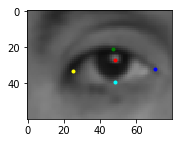

eyeGray: (80, 60)
12  1.1 (0, 0)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 285 168
WH: 63 47.25
eyeXY: 285 168
eyeWH: 69 51


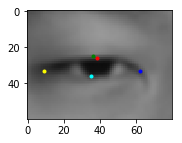

eyeGray: (80, 60)
XY: 383 169
WH: 69 51.75
eyeXY: 383 169
eyeWH: 76 57


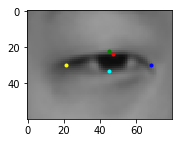

eyeGray: (80, 60)
13  1.1 (0, 0)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 312 160
WH: 59 44.25
eyeXY: 312 160
eyeWH: 65 48


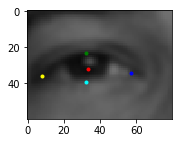

eyeGray: (80, 60)
XY: 414 164
WH: 64 48.0
eyeXY: 414 164
eyeWH: 70 52


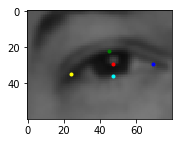

eyeGray: (80, 60)
14  1.1 (0, 0)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 301 160
WH: 59 44.25
eyeXY: 301 160
eyeWH: 65 48


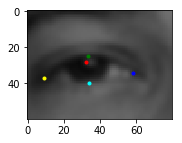

eyeGray: (80, 60)
XY: 402 164
WH: 64 48.0
eyeXY: 402 164
eyeWH: 70 52


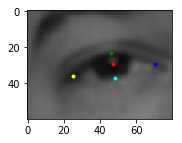

eyeGray: (80, 60)
15  1.1 (0, 0)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 325 182
WH: 57 42.75
eyeXY: 325 182
eyeWH: 63 47


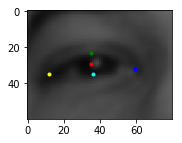

eyeGray: (80, 60)
XY: 416 184
WH: 67 50.25
eyeXY: 416 184
eyeWH: 74 55


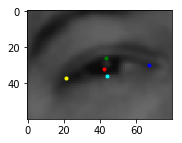

eyeGray: (80, 60)
16  1.1 (0, 0)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 343 187
WH: 60 45.0
eyeXY: 343 187
eyeWH: 66 49


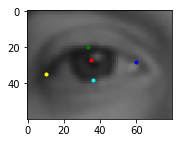

eyeGray: (80, 60)
XY: 442 180
WH: 67 50.25
eyeXY: 442 180
eyeWH: 74 55


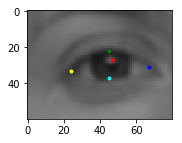

eyeGray: (80, 60)
17  1.1 (0, 0)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 329 186
WH: 66 49.5
eyeXY: 329 186
eyeWH: 73 54


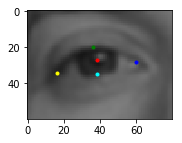

eyeGray: (80, 60)
XY: 430 181
WH: 69 51.75
eyeXY: 430 181
eyeWH: 76 57


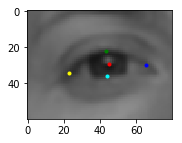

eyeGray: (80, 60)
18  1.1 (0, 0)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 115 332
WH: 132 99.0
eyeXY: 115 332
eyeWH: 145 108


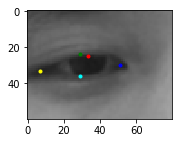

eyeGray: (80, 60)
XY: 314 327
WH: 129 96.75
eyeXY: 314 327
eyeWH: 142 106


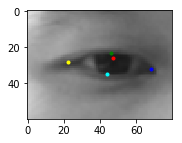

eyeGray: (80, 60)
19  1.1 (0, 0)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 118 326
WH: 127 95.25
eyeXY: 118 326
eyeWH: 140 105


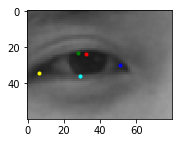

eyeGray: (80, 60)
XY: 317 318
WH: 130 97.5
eyeXY: 317 318
eyeWH: 143 107


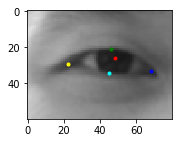

eyeGray: (80, 60)
20  1.1 (0, 0)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 112 335
WH: 132 99.0
eyeXY: 112 335
eyeWH: 145 108


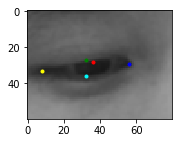

eyeGray: (80, 60)
XY: 312 324
WH: 137 102.75
eyeXY: 312 324
eyeWH: 151 113


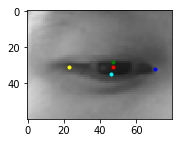

eyeGray: (80, 60)
21  1.1 (0, 0)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 112 330
WH: 135 101.25
eyeXY: 112 330
eyeWH: 149 111


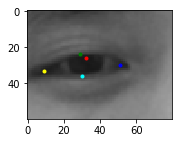

eyeGray: (80, 60)
XY: 316 325
WH: 131 98.25
eyeXY: 316 325
eyeWH: 144 108


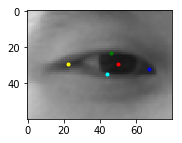

eyeGray: (80, 60)
22  1.1 (0, 0)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 121 331
WH: 131 98.25
eyeXY: 121 331
eyeWH: 144 108


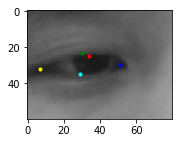

eyeGray: (80, 60)
XY: 322 326
WH: 128 96.0
eyeXY: 322 326
eyeWH: 141 105


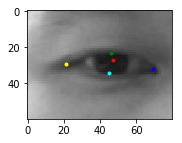

eyeGray: (80, 60)
1  1.1 (-2, 2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 301 265
WH: 84 63.0
eyeXY: 301 265
eyeWH: 92 69


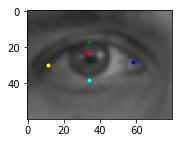

eyeGray: (80, 60)
XY: 441 259
WH: 75 56.25
eyeXY: 441 259
eyeWH: 83 62


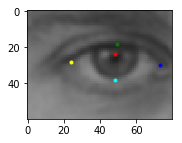

eyeGray: (80, 60)
2  1.1 (-2, 2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 252 209
WH: 75 56.25
eyeXY: 252 209
eyeWH: 83 62


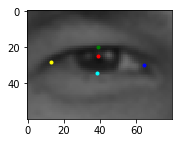

eyeGray: (80, 60)
XY: 389 219
WH: 69 51.75
eyeXY: 389 219
eyeWH: 76 57


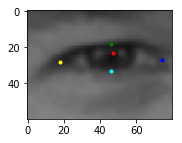

eyeGray: (80, 60)
3  1.1 (-2, 2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 266 216
WH: 66 49.5
eyeXY: 266 216
eyeWH: 73 54


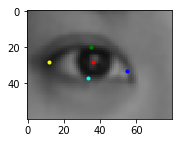

eyeGray: (80, 60)
XY: 367 222
WH: 63 47.25
eyeXY: 367 222
eyeWH: 69 51


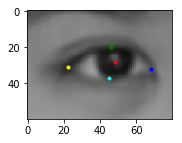

eyeGray: (80, 60)
4  1.1 (-2, 2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 266 227
WH: 65 48.75
eyeXY: 266 227
eyeWH: 72 54


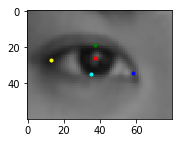

eyeGray: (80, 60)
XY: 371 235
WH: 63 47.25
eyeXY: 371 235
eyeWH: 69 51


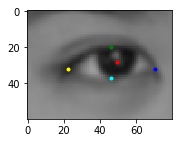

eyeGray: (80, 60)
5  1.1 (-2, 2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 253 205
WH: 88 66.0
eyeXY: 253 205
eyeWH: 97 72


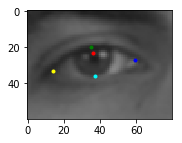

eyeGray: (80, 60)
XY: 401 203
WH: 89 66.75
eyeXY: 401 203
eyeWH: 98 73


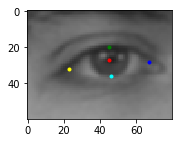

eyeGray: (80, 60)
6  1.1 (-2, 2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 307 264
WH: 60 45.0
eyeXY: 307 264
eyeWH: 66 49


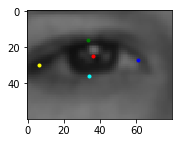

eyeGray: (80, 60)
XY: 419 257
WH: 65 48.75
eyeXY: 419 257
eyeWH: 72 54


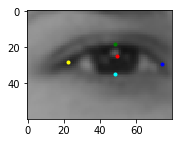

eyeGray: (80, 60)
7  1.1 (-2, 2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 323 257
WH: 62 46.5
eyeXY: 323 257
eyeWH: 68 51


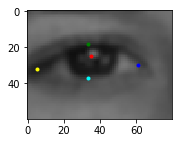

eyeGray: (80, 60)
XY: 436 253
WH: 65 48.75
eyeXY: 436 253
eyeWH: 72 54


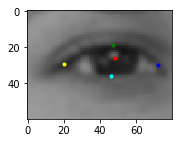

eyeGray: (80, 60)
8  1.1 (-2, 2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 323 225
WH: 59 44.25
eyeXY: 323 225
eyeWH: 65 48


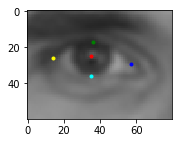

eyeGray: (80, 60)
XY: 424 227
WH: 48 36.0
eyeXY: 424 227
eyeWH: 53 39


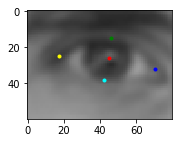

eyeGray: (80, 60)
9  1.1 (-2, 2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 315 224
WH: 53 39.75
eyeXY: 315 224
eyeWH: 58 43


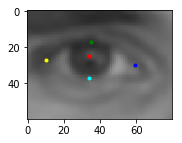

eyeGray: (80, 60)
XY: 409 224
WH: 50 37.5
eyeXY: 409 224
eyeWH: 55 41


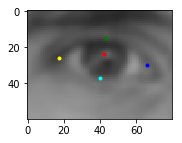

eyeGray: (80, 60)
10  1.1 (-2, 2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 334 195
WH: 64 48.0
eyeXY: 334 195
eyeWH: 70 52


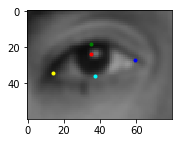

eyeGray: (80, 60)
XY: 434 189
WH: 64 48.0
eyeXY: 434 189
eyeWH: 70 52


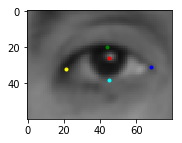

eyeGray: (80, 60)
11  1.1 (-2, 2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 336 195
WH: 68 51.0
eyeXY: 336 195
eyeWH: 75 56


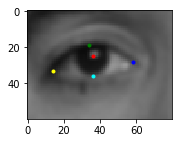

eyeGray: (80, 60)
XY: 438 193
WH: 65 48.75
eyeXY: 438 193
eyeWH: 72 54


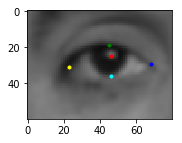

eyeGray: (80, 60)
12  1.1 (-2, 2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 283 170
WH: 63 47.25
eyeXY: 283 170
eyeWH: 69 51


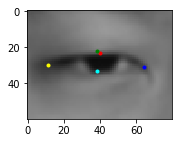

eyeGray: (80, 60)
XY: 381 171
WH: 69 51.75
eyeXY: 381 171
eyeWH: 76 57


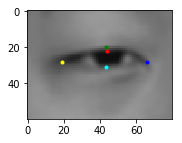

eyeGray: (80, 60)
13  1.1 (-2, 2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 310 162
WH: 59 44.25
eyeXY: 310 162
eyeWH: 65 48


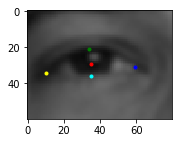

eyeGray: (80, 60)
XY: 412 166
WH: 64 48.0
eyeXY: 412 166
eyeWH: 70 52


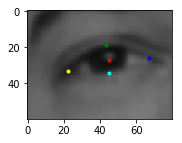

eyeGray: (80, 60)
14  1.1 (-2, 2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 299 162
WH: 59 44.25
eyeXY: 299 162
eyeWH: 65 48


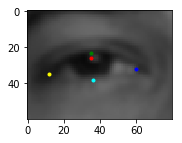

eyeGray: (80, 60)
XY: 400 166
WH: 64 48.0
eyeXY: 400 166
eyeWH: 70 52


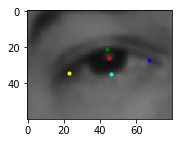

eyeGray: (80, 60)
15  1.1 (-2, 2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 323 184
WH: 57 42.75
eyeXY: 323 184
eyeWH: 63 47


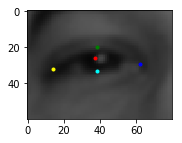

eyeGray: (80, 60)
XY: 414 186
WH: 67 50.25
eyeXY: 414 186
eyeWH: 74 55


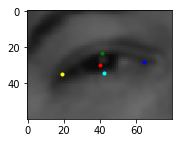

eyeGray: (80, 60)
16  1.1 (-2, 2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 341 189
WH: 60 45.0
eyeXY: 341 189
eyeWH: 66 49


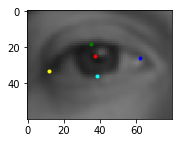

eyeGray: (80, 60)
XY: 440 182
WH: 67 50.25
eyeXY: 440 182
eyeWH: 74 55


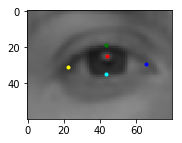

eyeGray: (80, 60)
17  1.1 (-2, 2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 327 188
WH: 66 49.5
eyeXY: 327 188
eyeWH: 73 54


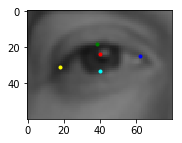

eyeGray: (80, 60)
XY: 428 183
WH: 69 51.75
eyeXY: 428 183
eyeWH: 76 57


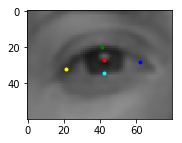

eyeGray: (80, 60)
18  1.1 (-2, 2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 113 334
WH: 132 99.0
eyeXY: 113 334
eyeWH: 145 108


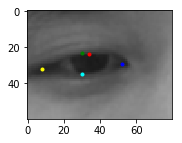

eyeGray: (80, 60)
XY: 312 329
WH: 129 96.75
eyeXY: 312 329
eyeWH: 142 106


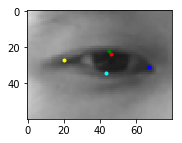

eyeGray: (80, 60)
19  1.1 (-2, 2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 116 328
WH: 127 95.25
eyeXY: 116 328
eyeWH: 140 105


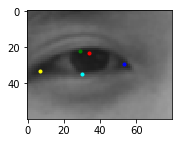

eyeGray: (80, 60)
XY: 315 320
WH: 130 97.5
eyeXY: 315 320
eyeWH: 143 107


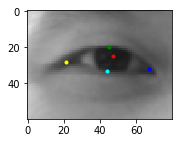

eyeGray: (80, 60)
20  1.1 (-2, 2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 110 337
WH: 132 99.0
eyeXY: 110 337
eyeWH: 145 108


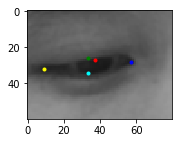

eyeGray: (80, 60)
XY: 310 326
WH: 137 102.75
eyeXY: 310 326
eyeWH: 151 113


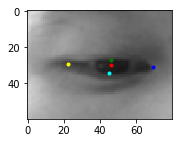

eyeGray: (80, 60)
21  1.1 (-2, 2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 110 332
WH: 135 101.25
eyeXY: 110 332
eyeWH: 149 111


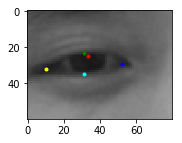

eyeGray: (80, 60)
XY: 314 327
WH: 131 98.25
eyeXY: 314 327
eyeWH: 144 108


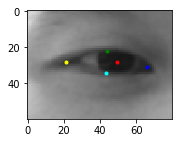

eyeGray: (80, 60)
22  1.1 (-2, 2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 119 333
WH: 131 98.25
eyeXY: 119 333
eyeWH: 144 108


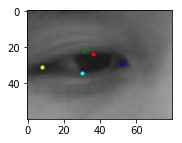

eyeGray: (80, 60)
XY: 320 328
WH: 128 96.0
eyeXY: 320 328
eyeWH: 141 105


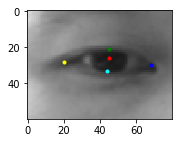

eyeGray: (80, 60)
1  1.1 (2, 2)
eye: 2
303 263.0 84 63.0
443 257.75 75 56.25
XY: 305 265
WH: 84 63.0
eyeXY: 305 265
eyeWH: 92 69


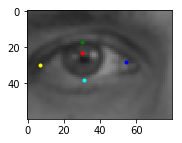

eyeGray: (80, 60)
XY: 445 259
WH: 75 56.25
eyeXY: 445 259
eyeWH: 83 62


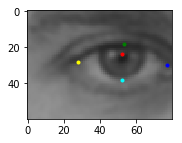

eyeGray: (80, 60)
2  1.1 (2, 2)
eye: 2
254 207.75 75 56.25
391 217.25 69 51.75
XY: 256 209
WH: 75 56.25
eyeXY: 256 209
eyeWH: 83 62


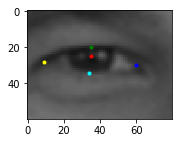

eyeGray: (80, 60)
XY: 393 219
WH: 69 51.75
eyeXY: 393 219
eyeWH: 76 57


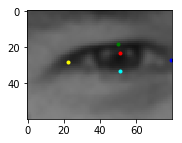

eyeGray: (80, 60)
3  1.1 (2, 2)
eye: 2
268 214.5 66 49.5
369 220.75 63 47.25
XY: 270 216
WH: 66 49.5
eyeXY: 270 216
eyeWH: 73 54


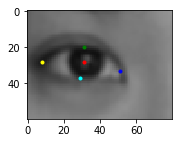

eyeGray: (80, 60)
XY: 371 222
WH: 63 47.25
eyeXY: 371 222
eyeWH: 69 51


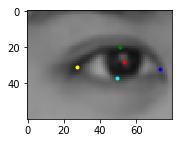

eyeGray: (80, 60)
4  1.1 (2, 2)
eye: 2
268 225.25 65 48.75
373 233.75 63 47.25
XY: 270 227
WH: 65 48.75
eyeXY: 270 227
eyeWH: 72 54


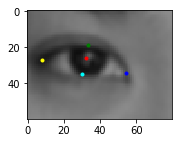

eyeGray: (80, 60)
XY: 375 235
WH: 63 47.25
eyeXY: 375 235
eyeWH: 69 51


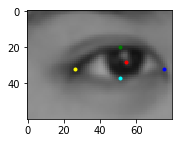

eyeGray: (80, 60)
5  1.1 (2, 2)
eye: 2
255 203.0 88 66.0
403 201.25 89 66.75
XY: 257 205
WH: 88 66.0
eyeXY: 257 205
eyeWH: 97 72


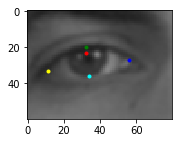

eyeGray: (80, 60)
XY: 405 203
WH: 89 66.75
eyeXY: 405 203
eyeWH: 98 73


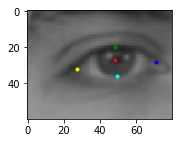

eyeGray: (80, 60)
6  1.1 (2, 2)
eye: 2
309 262.0 60 45.0
421 255.25 65 48.75
XY: 311 264
WH: 60 45.0
eyeXY: 311 264
eyeWH: 66 49


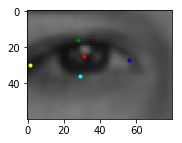

eyeGray: (80, 60)
XY: 423 257
WH: 65 48.75
eyeXY: 423 257
eyeWH: 72 54


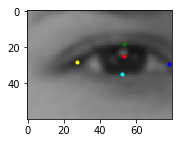

eyeGray: (80, 60)
7  1.1 (2, 2)
eye: 2
325 255.5 62 46.5
438 251.25 65 48.75
XY: 327 257
WH: 62 46.5
eyeXY: 327 257
eyeWH: 68 51


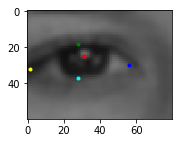

eyeGray: (80, 60)
XY: 440 253
WH: 65 48.75
eyeXY: 440 253
eyeWH: 72 54


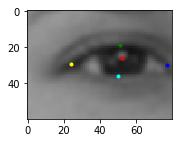

eyeGray: (80, 60)
8  1.1 (2, 2)
eye: 2
325 223.75 59 44.25
426 225.0 48 36.0
XY: 327 225
WH: 59 44.25
eyeXY: 327 225
eyeWH: 65 48


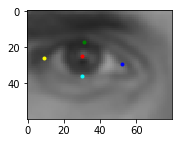

eyeGray: (80, 60)
XY: 428 227
WH: 48 36.0
eyeXY: 428 227
eyeWH: 53 39


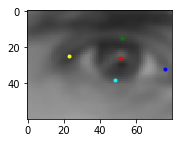

eyeGray: (80, 60)
9  1.1 (2, 2)
eye: 2
317 222.25 53 39.75
411 222.5 50 37.5
XY: 319 224
WH: 53 39.75
eyeXY: 319 224
eyeWH: 58 43


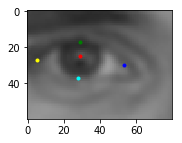

eyeGray: (80, 60)
XY: 413 224
WH: 50 37.5
eyeXY: 413 224
eyeWH: 55 41


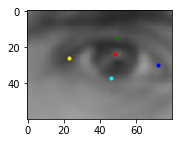

eyeGray: (80, 60)
10  1.1 (2, 2)
eye: 2
336 193.0 64 48.0
436 187.0 64 48.0
XY: 338 195
WH: 64 48.0
eyeXY: 338 195
eyeWH: 70 52


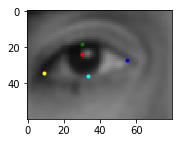

eyeGray: (80, 60)
XY: 438 189
WH: 64 48.0
eyeXY: 438 189
eyeWH: 70 52


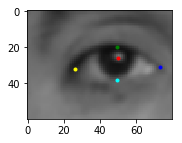

eyeGray: (80, 60)
11  1.1 (2, 2)
eye: 2
338 193.0 68 51.0
440 191.25 65 48.75
XY: 340 195
WH: 68 51.0
eyeXY: 340 195
eyeWH: 75 56


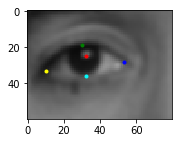

eyeGray: (80, 60)
XY: 442 193
WH: 65 48.75
eyeXY: 442 193
eyeWH: 72 54


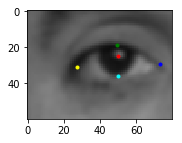

eyeGray: (80, 60)
12  1.1 (2, 2)
eye: 2
285 168.75 63 47.25
383 169.25 69 51.75
XY: 287 170
WH: 63 47.25
eyeXY: 287 170
eyeWH: 69 51


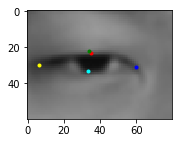

eyeGray: (80, 60)
XY: 385 171
WH: 69 51.75
eyeXY: 385 171
eyeWH: 76 57


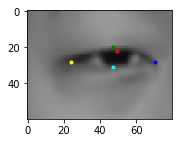

eyeGray: (80, 60)
13  1.1 (2, 2)
eye: 2
312 160.75 59 44.25
414 164.0 64 48.0
XY: 314 162
WH: 59 44.25
eyeXY: 314 162
eyeWH: 65 48


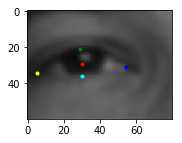

eyeGray: (80, 60)
XY: 416 166
WH: 64 48.0
eyeXY: 416 166
eyeWH: 70 52


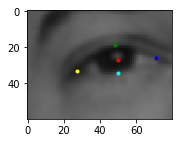

eyeGray: (80, 60)
14  1.1 (2, 2)
eye: 3
301 160.75 59 44.25
402 164.0 64 48.0
XY: 303 162
WH: 59 44.25
eyeXY: 303 162
eyeWH: 65 48


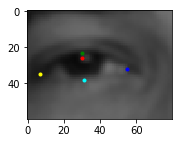

eyeGray: (80, 60)
XY: 404 166
WH: 64 48.0
eyeXY: 404 166
eyeWH: 70 52


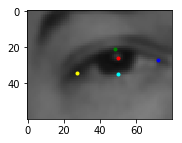

eyeGray: (80, 60)
15  1.1 (2, 2)
eye: 2
325 182.25 57 42.75
416 184.75 67 50.25
XY: 327 184
WH: 57 42.75
eyeXY: 327 184
eyeWH: 63 47


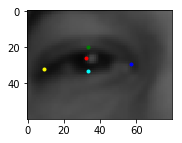

eyeGray: (80, 60)
XY: 418 186
WH: 67 50.25
eyeXY: 418 186
eyeWH: 74 55


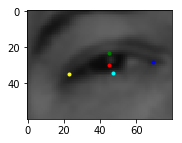

eyeGray: (80, 60)
16  1.1 (2, 2)
eye: 2
343 187.0 60 45.0
442 180.75 67 50.25
XY: 345 189
WH: 60 45.0
eyeXY: 345 189
eyeWH: 66 49


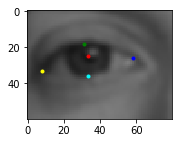

eyeGray: (80, 60)
XY: 444 182
WH: 67 50.25
eyeXY: 444 182
eyeWH: 74 55


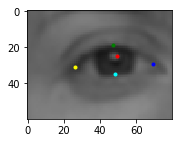

eyeGray: (80, 60)
17  1.1 (2, 2)
eye: 2
329 186.5 66 49.5
430 181.25 69 51.75
XY: 331 188
WH: 66 49.5
eyeXY: 331 188
eyeWH: 73 54


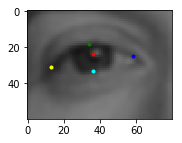

eyeGray: (80, 60)
XY: 432 183
WH: 69 51.75
eyeXY: 432 183
eyeWH: 76 57


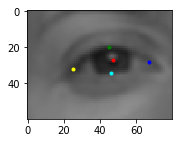

eyeGray: (80, 60)
18  1.1 (2, 2)
eye: 2
115 332.0 132 99.0
314 327.25 129 96.75
XY: 117 334
WH: 132 99.0
eyeXY: 117 334
eyeWH: 145 108


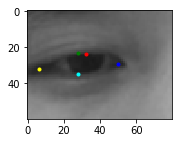

eyeGray: (80, 60)
XY: 316 329
WH: 129 96.75
eyeXY: 316 329
eyeWH: 142 106


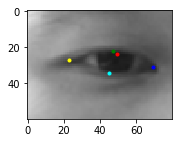

eyeGray: (80, 60)
19  1.1 (2, 2)
eye: 2
118 326.75 127 95.25
317 318.5 130 97.5
XY: 120 328
WH: 127 95.25
eyeXY: 120 328
eyeWH: 140 105


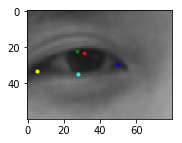

eyeGray: (80, 60)
XY: 319 320
WH: 130 97.5
eyeXY: 319 320
eyeWH: 143 107


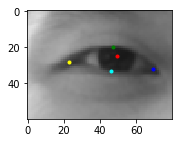

eyeGray: (80, 60)
20  1.1 (2, 2)
eye: 2
112 335.0 132 99.0
312 324.25 137 102.75
XY: 114 337
WH: 132 99.0
eyeXY: 114 337
eyeWH: 145 108


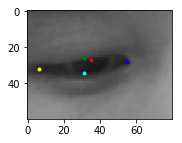

eyeGray: (80, 60)
XY: 314 326
WH: 137 102.75
eyeXY: 314 326
eyeWH: 151 113


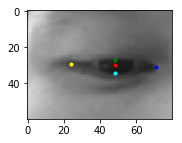

eyeGray: (80, 60)
21  1.1 (2, 2)
eye: 2
112 330.75 135 101.25
316 325.75 131 98.25
XY: 114 332
WH: 135 101.25
eyeXY: 114 332
eyeWH: 149 111


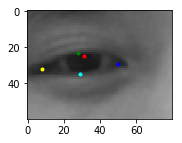

eyeGray: (80, 60)
XY: 318 327
WH: 131 98.25
eyeXY: 318 327
eyeWH: 144 108


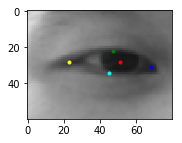

eyeGray: (80, 60)
22  1.1 (2, 2)
eye: 2
121 331.75 131 98.25
322 326.0 128 96.0
XY: 123 333
WH: 131 98.25
eyeXY: 123 333
eyeWH: 144 108


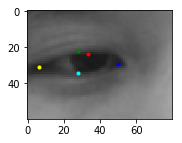

eyeGray: (80, 60)
XY: 324 328
WH: 128 96.0
eyeXY: 324 328
eyeWH: 141 105


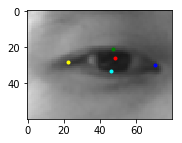

eyeGray: (80, 60)
1 _r 0.9 (-2, -2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 301 257
WH: 82 61.5
eyeXY: 301 257
eyeWH: 74 55


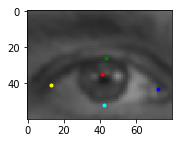

eyeGray: (80, 60)
XY: 439 262
WH: 78 58.5
eyeXY: 439 262
eyeWH: 70 52


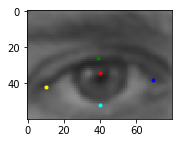

eyeGray: (80, 60)
2 _r 0.9 (-2, -2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 251 212
WH: 76 57.0
eyeXY: 251 212
eyeWH: 68 51


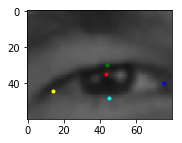

eyeGray: (80, 60)
XY: 387 212
WH: 66 49.5
eyeXY: 387 212
eyeWH: 59 44


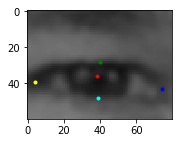

eyeGray: (80, 60)
3 _r 0.9 (-2, -2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 262 220
WH: 66 49.5
eyeXY: 262 220
eyeWH: 59 44


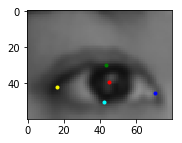

eyeGray: (80, 60)
XY: 365 217
WH: 63 47.25
eyeXY: 365 217
eyeWH: 57 42


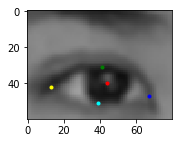

eyeGray: (80, 60)
4 _r 0.9 (-2, -2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 262 232
WH: 65 48.75
eyeXY: 262 232
eyeWH: 59 44


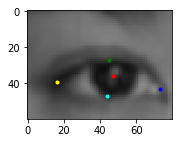

eyeGray: (80, 60)
XY: 370 230
WH: 63 47.25
eyeXY: 370 230
eyeWH: 57 42


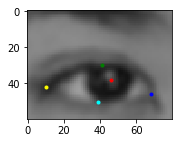

eyeGray: (80, 60)
5 _r 0.9 (-2, -2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 253 210
WH: 85 63.75
eyeXY: 253 210
eyeWH: 77 57


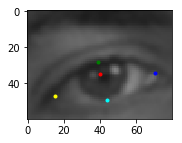

eyeGray: (80, 60)
XY: 395 193
WH: 90 67.5
eyeXY: 395 193
eyeWH: 81 60


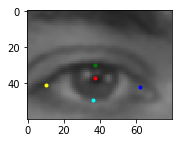

eyeGray: (80, 60)
6 _r 0.9 (-2, -2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 304 264
WH: 60 45.0
eyeXY: 304 264
eyeWH: 54 40


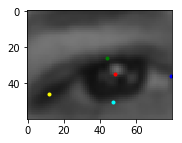

eyeGray: (80, 60)
XY: 417 246
WH: 65 48.75
eyeXY: 417 246
eyeWH: 59 44


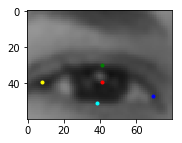

eyeGray: (80, 60)
7 _r 0.9 (-2, -2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 320 256
WH: 64 48.0
eyeXY: 320 256
eyeWH: 58 43


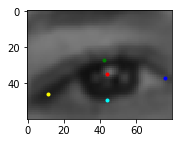

eyeGray: (80, 60)
XY: 434 241
WH: 67 50.25
eyeXY: 434 241
eyeWH: 60 45


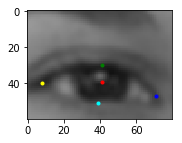

eyeGray: (80, 60)
8 _r 0.9 (-2, -2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 324 226
WH: 54 40.5
eyeXY: 324 226
eyeWH: 49 36


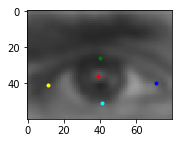

eyeGray: (80, 60)
XY: 420 216
WH: 52 39.0
eyeXY: 420 216
eyeWH: 47 35


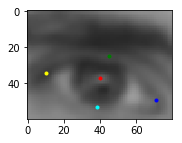

eyeGray: (80, 60)
9 _r 0.9 (-2, -2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 306 221
WH: 63 47.25
eyeXY: 306 221
eyeWH: 57 42


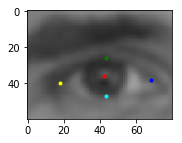

eyeGray: (80, 60)
XY: 406 215
WH: 52 39.0
eyeXY: 406 215
eyeWH: 47 35


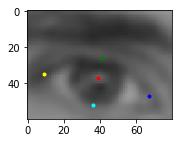

eyeGray: (80, 60)
10 _r 0.9 (-2, -2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 328 193
WH: 63 47.25
eyeXY: 328 193
eyeWH: 57 42


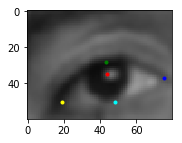

eyeGray: (80, 60)
XY: 427 178
WH: 64 48.0
eyeXY: 427 178
eyeWH: 58 43


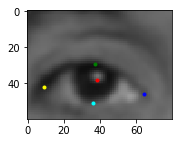

eyeGray: (80, 60)
11 _r 0.9 (-2, -2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 329 193
WH: 67 50.25
eyeXY: 329 193
eyeWH: 60 45


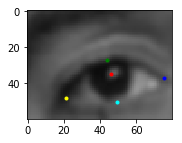

eyeGray: (80, 60)
XY: 431 182
WH: 65 48.75
eyeXY: 431 182
eyeWH: 59 44


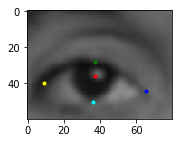

eyeGray: (80, 60)
12 _r 0.9 (-2, -2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 276 172
WH: 63 47.25
eyeXY: 276 172
eyeWH: 57 42


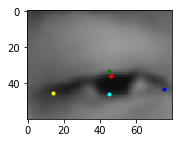

eyeGray: (80, 60)
XY: 371 162
WH: 71 53.25
eyeXY: 371 162
eyeWH: 64 48


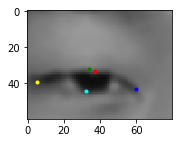

eyeGray: (80, 60)
13 _r 0.9 (-2, -2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 301 162
WH: 61 45.75
eyeXY: 301 162
eyeWH: 55 41


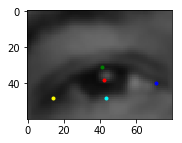

eyeGray: (80, 60)
XY: 403 155
WH: 66 49.5
eyeXY: 403 155
eyeWH: 59 44


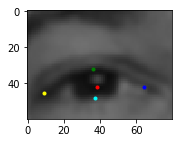

eyeGray: (80, 60)
14 _r 0.9 (-2, -2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 288 164
WH: 62 46.5
eyeXY: 288 164
eyeWH: 56 42


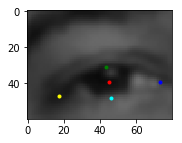

eyeGray: (80, 60)
XY: 391 158
WH: 64 48.0
eyeXY: 391 158
eyeWH: 58 43


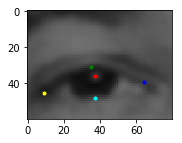

eyeGray: (80, 60)
15 _r 0.9 (-2, -2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 316 182
WH: 60 45.0
eyeXY: 316 182
eyeWH: 54 40


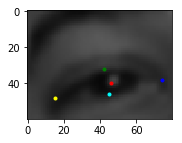

eyeGray: (80, 60)
XY: 408 177
WH: 66 49.5
eyeXY: 408 177
eyeWH: 59 44


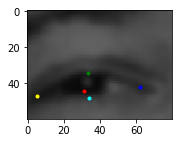

eyeGray: (80, 60)
16 _r 0.9 (-2, -2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 345 183
WH: 62 46.5
eyeXY: 345 183
eyeWH: 56 42


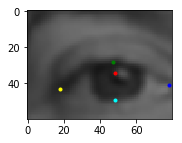

eyeGray: (80, 60)
XY: 448 186
WH: 67 50.25
eyeXY: 448 186
eyeWH: 60 45


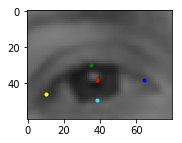

eyeGray: (80, 60)
17 _r 0.9 (-2, -2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 335 183
WH: 63 47.25
eyeXY: 335 183
eyeWH: 57 42


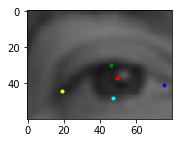

eyeGray: (80, 60)
XY: 437 187
WH: 68 51.0
eyeXY: 437 187
eyeWH: 61 45


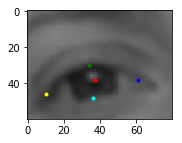

eyeGray: (80, 60)
18 _r 0.9 (-2, -2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 114 321
WH: 130 97.5
eyeXY: 114 321
eyeWH: 117 87


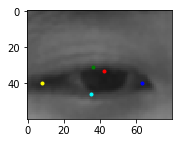

eyeGray: (80, 60)
XY: 317 335
WH: 125 93.75
eyeXY: 317 335
eyeWH: 113 84


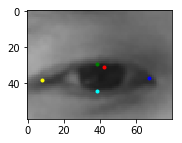

eyeGray: (80, 60)
19 _r 0.9 (-2, -2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 117 315
WH: 127 95.25
eyeXY: 117 315
eyeWH: 114 85


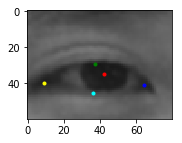

eyeGray: (80, 60)
XY: 319 327
WH: 125 93.75
eyeXY: 319 327
eyeWH: 113 84


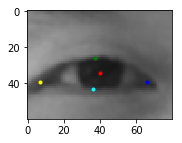

eyeGray: (80, 60)
20 _r 0.9 (-2, -2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 114 320
WH: 136 102.0
eyeXY: 114 320
eyeWH: 122 91


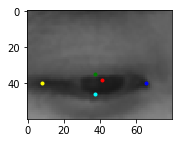

eyeGray: (80, 60)
XY: 312 335
WH: 133 99.75
eyeXY: 312 335
eyeWH: 120 90


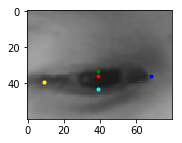

eyeGray: (80, 60)
21 _r 0.9 (-2, -2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 112 320
WH: 130 97.5
eyeXY: 112 320
eyeWH: 117 87


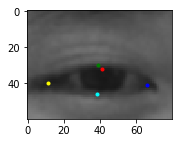

eyeGray: (80, 60)
XY: 316 333
WH: 129 96.75
eyeXY: 316 333
eyeWH: 116 87


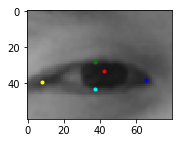

eyeGray: (80, 60)
22 _r 0.9 (-2, -2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 121 318
WH: 133 99.75
eyeXY: 121 318
eyeWH: 120 90


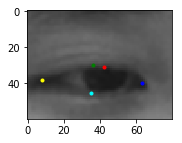

eyeGray: (80, 60)
XY: 320 332
WH: 129 96.75
eyeXY: 320 332
eyeWH: 116 87


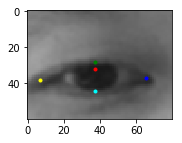

eyeGray: (80, 60)
1 _r 0.9 (2, -2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 305 257
WH: 82 61.5
eyeXY: 305 257
eyeWH: 74 55


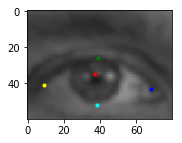

eyeGray: (80, 60)
XY: 443 262
WH: 78 58.5
eyeXY: 443 262
eyeWH: 70 52


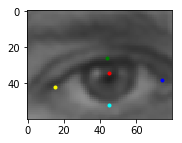

eyeGray: (80, 60)
2 _r 0.9 (2, -2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 255 212
WH: 76 57.0
eyeXY: 255 212
eyeWH: 68 51


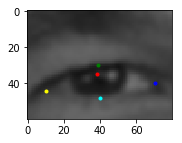

eyeGray: (80, 60)
XY: 391 212
WH: 66 49.5
eyeXY: 391 212
eyeWH: 59 44


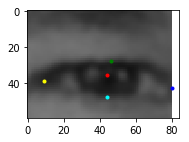

eyeGray: (80, 60)
3 _r 0.9 (2, -2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 266 220
WH: 66 49.5
eyeXY: 266 220
eyeWH: 59 44


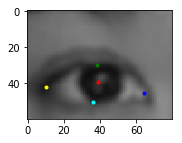

eyeGray: (80, 60)
XY: 369 217
WH: 63 47.25
eyeXY: 369 217
eyeWH: 57 42


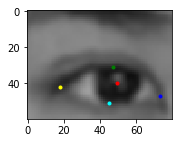

eyeGray: (80, 60)
4 _r 0.9 (2, -2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 266 232
WH: 65 48.75
eyeXY: 266 232
eyeWH: 59 44


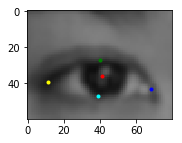

eyeGray: (80, 60)
XY: 374 230
WH: 63 47.25
eyeXY: 374 230
eyeWH: 57 42


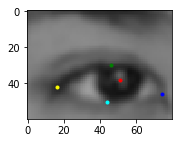

eyeGray: (80, 60)
5 _r 0.9 (2, -2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 257 210
WH: 85 63.75
eyeXY: 257 210
eyeWH: 77 57


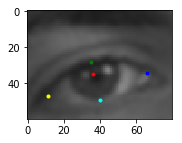

eyeGray: (80, 60)
XY: 399 193
WH: 90 67.5
eyeXY: 399 193
eyeWH: 81 60


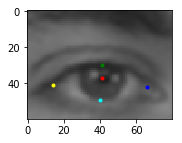

eyeGray: (80, 60)
6 _r 0.9 (2, -2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 308 264
WH: 60 45.0
eyeXY: 308 264
eyeWH: 54 40


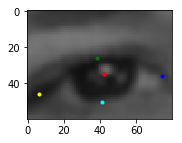

eyeGray: (80, 60)
XY: 421 246
WH: 65 48.75
eyeXY: 421 246
eyeWH: 59 44


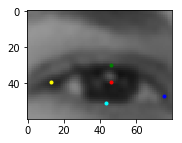

eyeGray: (80, 60)
7 _r 0.9 (2, -2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 324 256
WH: 64 48.0
eyeXY: 324 256
eyeWH: 58 43


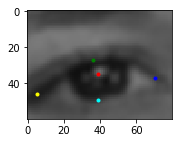

eyeGray: (80, 60)
XY: 438 241
WH: 67 50.25
eyeXY: 438 241
eyeWH: 60 45


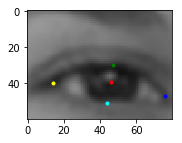

eyeGray: (80, 60)
8 _r 0.9 (2, -2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 328 226
WH: 54 40.5
eyeXY: 328 226
eyeWH: 49 36


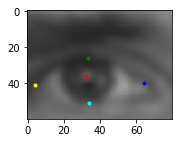

eyeGray: (80, 60)
XY: 424 216
WH: 52 39.0
eyeXY: 424 216
eyeWH: 47 35


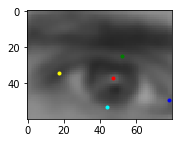

eyeGray: (80, 60)
9 _r 0.9 (2, -2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 310 221
WH: 63 47.25
eyeXY: 310 221
eyeWH: 57 42


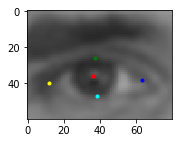

eyeGray: (80, 60)
XY: 410 215
WH: 52 39.0
eyeXY: 410 215
eyeWH: 47 35


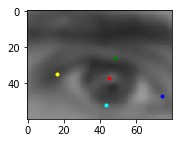

eyeGray: (80, 60)
10 _r 0.9 (2, -2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 332 193
WH: 63 47.25
eyeXY: 332 193
eyeWH: 57 42


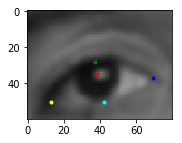

eyeGray: (80, 60)
XY: 431 178
WH: 64 48.0
eyeXY: 431 178
eyeWH: 58 43


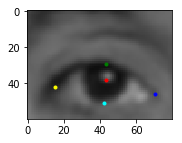

eyeGray: (80, 60)
11 _r 0.9 (2, -2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 333 193
WH: 67 50.25
eyeXY: 333 193
eyeWH: 60 45


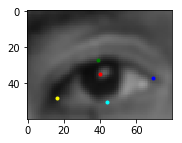

eyeGray: (80, 60)
XY: 435 182
WH: 65 48.75
eyeXY: 435 182
eyeWH: 59 44


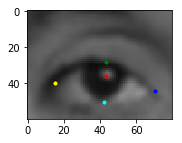

eyeGray: (80, 60)
12 _r 0.9 (2, -2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 280 172
WH: 63 47.25
eyeXY: 280 172
eyeWH: 57 42


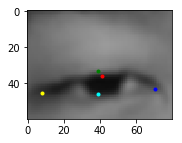

eyeGray: (80, 60)
XY: 375 162
WH: 71 53.25
eyeXY: 375 162
eyeWH: 64 48


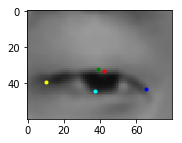

eyeGray: (80, 60)
13 _r 0.9 (2, -2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 305 162
WH: 61 45.75
eyeXY: 305 162
eyeWH: 55 41


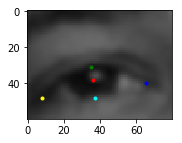

eyeGray: (80, 60)
XY: 407 155
WH: 66 49.5
eyeXY: 407 155
eyeWH: 59 44


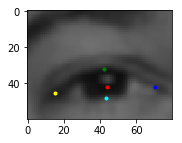

eyeGray: (80, 60)
14 _r 0.9 (2, -2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 292 164
WH: 62 46.5
eyeXY: 292 164
eyeWH: 56 42


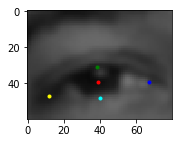

eyeGray: (80, 60)
XY: 395 158
WH: 64 48.0
eyeXY: 395 158
eyeWH: 58 43


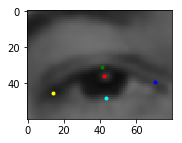

eyeGray: (80, 60)
15 _r 0.9 (2, -2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 320 182
WH: 60 45.0
eyeXY: 320 182
eyeWH: 54 40


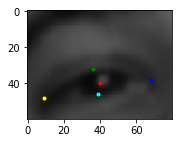

eyeGray: (80, 60)
XY: 412 177
WH: 66 49.5
eyeXY: 412 177
eyeWH: 59 44


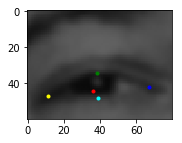

eyeGray: (80, 60)
16 _r 0.9 (2, -2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 349 183
WH: 62 46.5
eyeXY: 349 183
eyeWH: 56 42


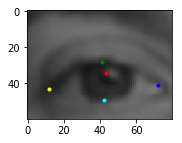

eyeGray: (80, 60)
XY: 452 186
WH: 67 50.25
eyeXY: 452 186
eyeWH: 60 45


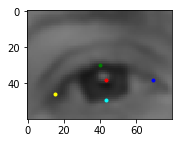

eyeGray: (80, 60)
17 _r 0.9 (2, -2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 339 183
WH: 63 47.25
eyeXY: 339 183
eyeWH: 57 42


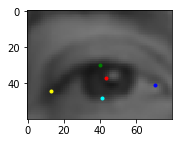

eyeGray: (80, 60)
XY: 441 187
WH: 68 51.0
eyeXY: 441 187
eyeWH: 61 45


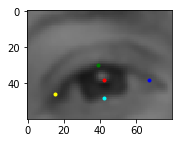

eyeGray: (80, 60)
18 _r 0.9 (2, -2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 118 321
WH: 130 97.5
eyeXY: 118 321
eyeWH: 117 87


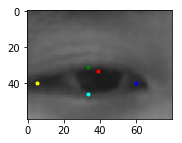

eyeGray: (80, 60)
XY: 321 335
WH: 125 93.75
eyeXY: 321 335
eyeWH: 113 84


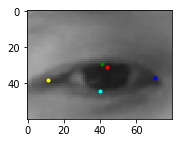

eyeGray: (80, 60)
19 _r 0.9 (2, -2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 121 315
WH: 127 95.25
eyeXY: 121 315
eyeWH: 114 85


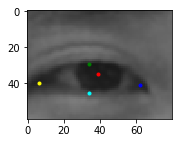

eyeGray: (80, 60)
XY: 323 327
WH: 125 93.75
eyeXY: 323 327
eyeWH: 113 84


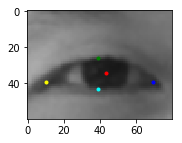

eyeGray: (80, 60)
20 _r 0.9 (2, -2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 118 320
WH: 136 102.0
eyeXY: 118 320
eyeWH: 122 91


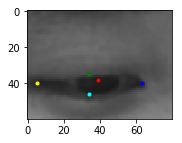

eyeGray: (80, 60)
XY: 316 335
WH: 133 99.75
eyeXY: 316 335
eyeWH: 120 90


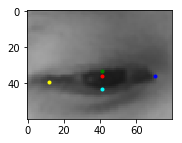

eyeGray: (80, 60)
21 _r 0.9 (2, -2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 116 320
WH: 130 97.5
eyeXY: 116 320
eyeWH: 117 87


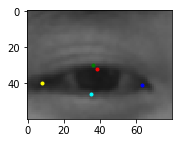

eyeGray: (80, 60)
XY: 320 333
WH: 129 96.75
eyeXY: 320 333
eyeWH: 116 87


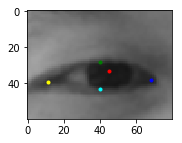

eyeGray: (80, 60)
22 _r 0.9 (2, -2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 125 318
WH: 133 99.75
eyeXY: 125 318
eyeWH: 120 90


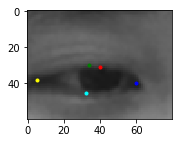

eyeGray: (80, 60)
XY: 324 332
WH: 129 96.75
eyeXY: 324 332
eyeWH: 116 87


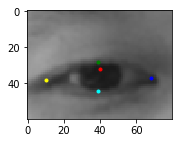

eyeGray: (80, 60)
1 _r 0.9 (0, 0)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 303 259
WH: 82 61.5
eyeXY: 303 259
eyeWH: 74 55


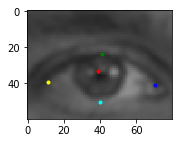

eyeGray: (80, 60)
XY: 441 264
WH: 78 58.5
eyeXY: 441 264
eyeWH: 70 52


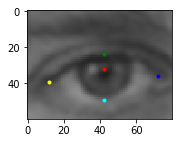

eyeGray: (80, 60)
2 _r 0.9 (0, 0)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 253 214
WH: 76 57.0
eyeXY: 253 214
eyeWH: 68 51


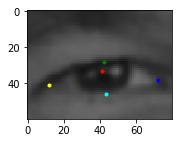

eyeGray: (80, 60)
XY: 389 214
WH: 66 49.5
eyeXY: 389 214
eyeWH: 59 44


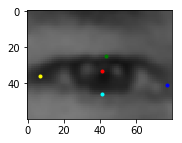

eyeGray: (80, 60)
3 _r 0.9 (0, 0)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 264 222
WH: 66 49.5
eyeXY: 264 222
eyeWH: 59 44


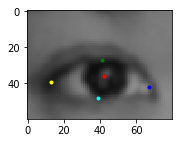

eyeGray: (80, 60)
XY: 367 219
WH: 63 47.25
eyeXY: 367 219
eyeWH: 57 42


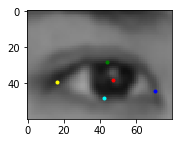

eyeGray: (80, 60)
4 _r 0.9 (0, 0)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 264 234
WH: 65 48.75
eyeXY: 264 234
eyeWH: 59 44


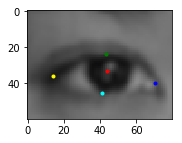

eyeGray: (80, 60)
XY: 372 232
WH: 63 47.25
eyeXY: 372 232
eyeWH: 57 42


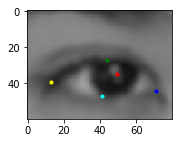

eyeGray: (80, 60)
5 _r 0.9 (0, 0)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 255 212
WH: 85 63.75
eyeXY: 255 212
eyeWH: 77 57


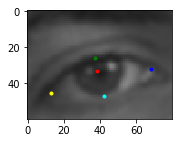

eyeGray: (80, 60)
XY: 397 195
WH: 90 67.5
eyeXY: 397 195
eyeWH: 81 60


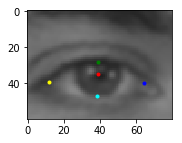

eyeGray: (80, 60)
6 _r 0.9 (0, 0)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 306 266
WH: 60 45.0
eyeXY: 306 266
eyeWH: 54 40


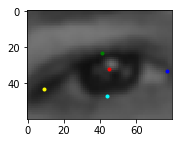

eyeGray: (80, 60)
XY: 419 248
WH: 65 48.75
eyeXY: 419 248
eyeWH: 59 44


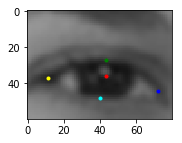

eyeGray: (80, 60)
7 _r 0.9 (0, 0)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 322 258
WH: 64 48.0
eyeXY: 322 258
eyeWH: 58 43


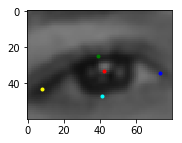

eyeGray: (80, 60)
XY: 436 243
WH: 67 50.25
eyeXY: 436 243
eyeWH: 60 45


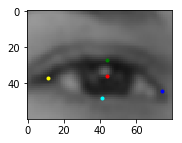

eyeGray: (80, 60)
8 _r 0.9 (0, 0)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 326 228
WH: 54 40.5
eyeXY: 326 228
eyeWH: 49 36


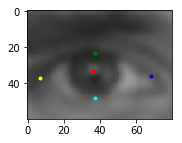

eyeGray: (80, 60)
XY: 422 218
WH: 52 39.0
eyeXY: 422 218
eyeWH: 47 35


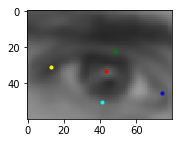

eyeGray: (80, 60)
9 _r 0.9 (0, 0)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 308 223
WH: 63 47.25
eyeXY: 308 223
eyeWH: 57 42


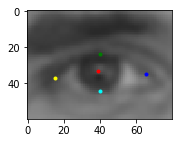

eyeGray: (80, 60)
XY: 408 217
WH: 52 39.0
eyeXY: 408 217
eyeWH: 47 35


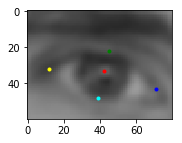

eyeGray: (80, 60)
10 _r 0.9 (0, 0)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 330 195
WH: 63 47.25
eyeXY: 330 195
eyeWH: 57 42


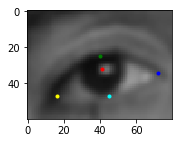

eyeGray: (80, 60)
XY: 429 180
WH: 64 48.0
eyeXY: 429 180
eyeWH: 58 43


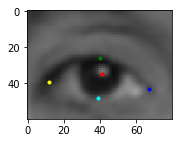

eyeGray: (80, 60)
11 _r 0.9 (0, 0)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 331 195
WH: 67 50.25
eyeXY: 331 195
eyeWH: 60 45


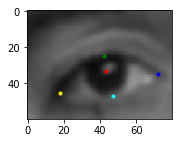

eyeGray: (80, 60)
XY: 433 184
WH: 65 48.75
eyeXY: 433 184
eyeWH: 59 44


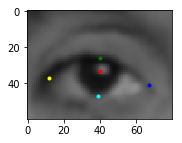

eyeGray: (80, 60)
12 _r 0.9 (0, 0)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 278 174
WH: 63 47.25
eyeXY: 278 174
eyeWH: 57 42


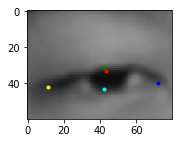

eyeGray: (80, 60)
XY: 373 164
WH: 71 53.25
eyeXY: 373 164
eyeWH: 64 48


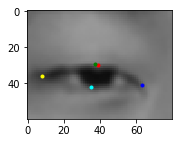

eyeGray: (80, 60)
13 _r 0.9 (0, 0)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 303 164
WH: 61 45.75
eyeXY: 303 164
eyeWH: 55 41


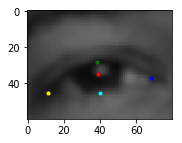

eyeGray: (80, 60)
XY: 405 157
WH: 66 49.5
eyeXY: 405 157
eyeWH: 59 44


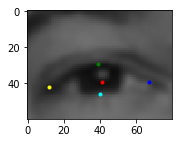

eyeGray: (80, 60)
14 _r 0.9 (0, 0)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 290 166
WH: 62 46.5
eyeXY: 290 166
eyeWH: 56 42


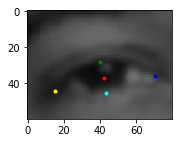

eyeGray: (80, 60)
XY: 393 160
WH: 64 48.0
eyeXY: 393 160
eyeWH: 58 43


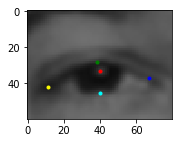

eyeGray: (80, 60)
15 _r 0.9 (0, 0)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 318 184
WH: 60 45.0
eyeXY: 318 184
eyeWH: 54 40


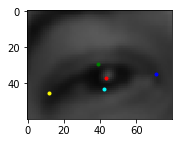

eyeGray: (80, 60)
XY: 410 179
WH: 66 49.5
eyeXY: 410 179
eyeWH: 59 44


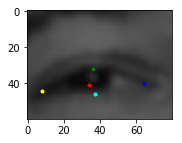

eyeGray: (80, 60)
16 _r 0.9 (0, 0)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 347 185
WH: 62 46.5
eyeXY: 347 185
eyeWH: 56 42


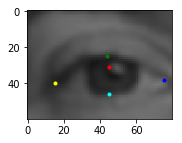

eyeGray: (80, 60)
XY: 450 188
WH: 67 50.25
eyeXY: 450 188
eyeWH: 60 45


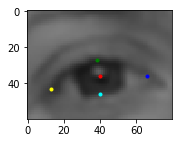

eyeGray: (80, 60)
17 _r 0.9 (0, 0)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 337 185
WH: 63 47.25
eyeXY: 337 185
eyeWH: 57 42


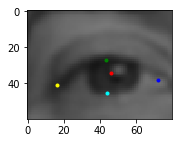

eyeGray: (80, 60)
XY: 439 189
WH: 68 51.0
eyeXY: 439 189
eyeWH: 61 45


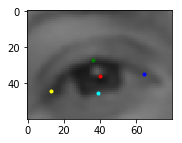

eyeGray: (80, 60)
18 _r 0.9 (0, 0)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 116 323
WH: 130 97.5
eyeXY: 116 323
eyeWH: 117 87


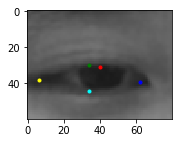

eyeGray: (80, 60)
XY: 319 337
WH: 125 93.75
eyeXY: 319 337
eyeWH: 113 84


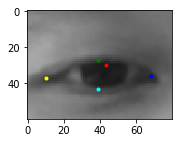

eyeGray: (80, 60)
19 _r 0.9 (0, 0)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 119 317
WH: 127 95.25
eyeXY: 119 317
eyeWH: 114 85


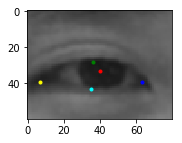

eyeGray: (80, 60)
XY: 321 329
WH: 125 93.75
eyeXY: 321 329
eyeWH: 113 84


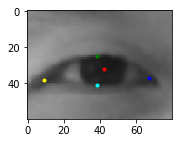

eyeGray: (80, 60)
20 _r 0.9 (0, 0)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 116 322
WH: 136 102.0
eyeXY: 116 322
eyeWH: 122 91


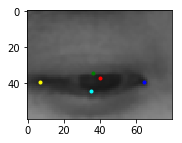

eyeGray: (80, 60)
XY: 314 337
WH: 133 99.75
eyeXY: 314 337
eyeWH: 120 90


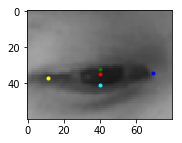

eyeGray: (80, 60)
21 _r 0.9 (0, 0)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 114 322
WH: 130 97.5
eyeXY: 114 322
eyeWH: 117 87


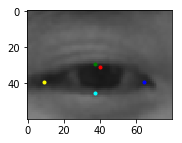

eyeGray: (80, 60)
XY: 318 335
WH: 129 96.75
eyeXY: 318 335
eyeWH: 116 87


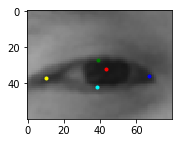

eyeGray: (80, 60)
22 _r 0.9 (0, 0)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 123 320
WH: 133 99.75
eyeXY: 123 320
eyeWH: 120 90


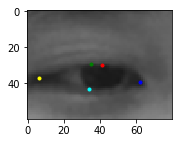

eyeGray: (80, 60)
XY: 322 334
WH: 129 96.75
eyeXY: 322 334
eyeWH: 116 87


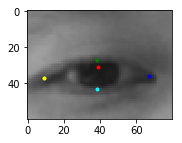

eyeGray: (80, 60)
1 _r 0.9 (-2, 2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 301 261
WH: 82 61.5
eyeXY: 301 261
eyeWH: 74 55


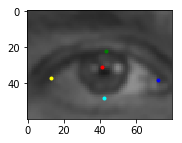

eyeGray: (80, 60)
XY: 439 266
WH: 78 58.5
eyeXY: 439 266
eyeWH: 70 52


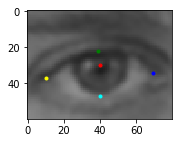

eyeGray: (80, 60)
2 _r 0.9 (-2, 2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 251 216
WH: 76 57.0
eyeXY: 251 216
eyeWH: 68 51


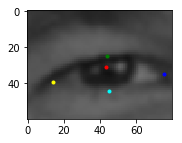

eyeGray: (80, 60)
XY: 387 216
WH: 66 49.5
eyeXY: 387 216
eyeWH: 59 44


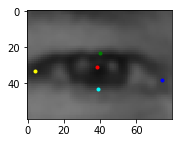

eyeGray: (80, 60)
3 _r 0.9 (-2, 2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 262 224
WH: 66 49.5
eyeXY: 262 224
eyeWH: 59 44


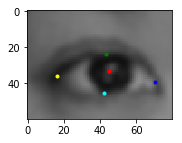

eyeGray: (80, 60)
XY: 365 221
WH: 63 47.25
eyeXY: 365 221
eyeWH: 57 42


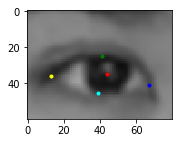

eyeGray: (80, 60)
4 _r 0.9 (-2, 2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 262 236
WH: 65 48.75
eyeXY: 262 236
eyeWH: 59 44


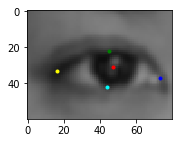

eyeGray: (80, 60)
XY: 370 234
WH: 63 47.25
eyeXY: 370 234
eyeWH: 57 42


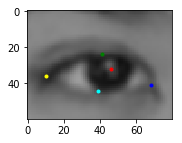

eyeGray: (80, 60)
5 _r 0.9 (-2, 2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 253 214
WH: 85 63.75
eyeXY: 253 214
eyeWH: 77 57


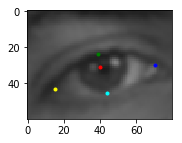

eyeGray: (80, 60)
XY: 395 197
WH: 90 67.5
eyeXY: 395 197
eyeWH: 81 60


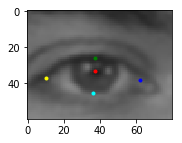

eyeGray: (80, 60)
6 _r 0.9 (-2, 2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 304 268
WH: 60 45.0
eyeXY: 304 268
eyeWH: 54 40


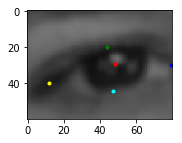

eyeGray: (80, 60)
XY: 417 250
WH: 65 48.75
eyeXY: 417 250
eyeWH: 59 44


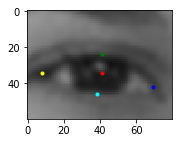

eyeGray: (80, 60)
7 _r 0.9 (-2, 2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 320 260
WH: 64 48.0
eyeXY: 320 260
eyeWH: 58 43


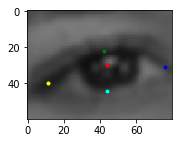

eyeGray: (80, 60)
XY: 434 245
WH: 67 50.25
eyeXY: 434 245
eyeWH: 60 45


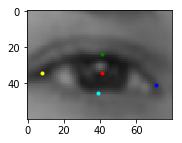

eyeGray: (80, 60)
8 _r 0.9 (-2, 2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 324 230
WH: 54 40.5
eyeXY: 324 230
eyeWH: 49 36


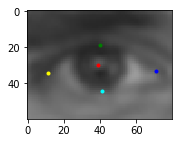

eyeGray: (80, 60)
XY: 420 220
WH: 52 39.0
eyeXY: 420 220
eyeWH: 47 35


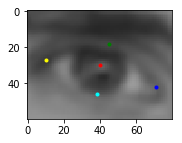

eyeGray: (80, 60)
9 _r 0.9 (-2, 2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 306 225
WH: 63 47.25
eyeXY: 306 225
eyeWH: 57 42


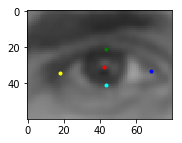

eyeGray: (80, 60)
XY: 406 219
WH: 52 39.0
eyeXY: 406 219
eyeWH: 47 35


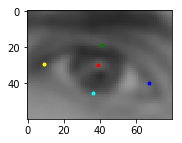

eyeGray: (80, 60)
10 _r 0.9 (-2, 2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 328 197
WH: 63 47.25
eyeXY: 328 197
eyeWH: 57 42


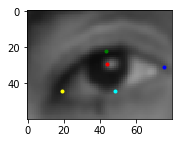

eyeGray: (80, 60)
XY: 427 182
WH: 64 48.0
eyeXY: 427 182
eyeWH: 58 43


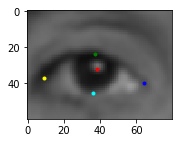

eyeGray: (80, 60)
11 _r 0.9 (-2, 2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 329 197
WH: 67 50.25
eyeXY: 329 197
eyeWH: 60 45


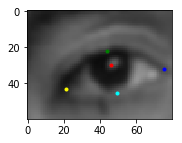

eyeGray: (80, 60)
XY: 431 186
WH: 65 48.75
eyeXY: 431 186
eyeWH: 59 44


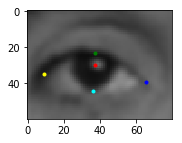

eyeGray: (80, 60)
12 _r 0.9 (-2, 2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 276 176
WH: 63 47.25
eyeXY: 276 176
eyeWH: 57 42


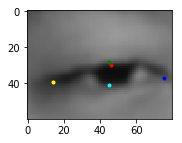

eyeGray: (80, 60)
XY: 371 166
WH: 71 53.25
eyeXY: 371 166
eyeWH: 64 48


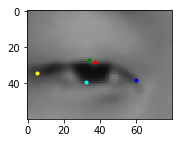

eyeGray: (80, 60)
13 _r 0.9 (-2, 2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 301 166
WH: 61 45.75
eyeXY: 301 166
eyeWH: 55 41


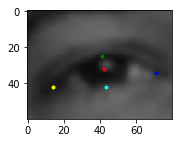

eyeGray: (80, 60)
XY: 403 159
WH: 66 49.5
eyeXY: 403 159
eyeWH: 59 44


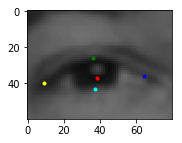

eyeGray: (80, 60)
14 _r 0.9 (-2, 2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 288 168
WH: 62 46.5
eyeXY: 288 168
eyeWH: 56 42


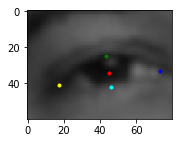

eyeGray: (80, 60)
XY: 391 162
WH: 64 48.0
eyeXY: 391 162
eyeWH: 58 43


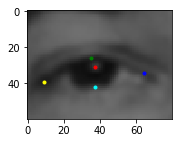

eyeGray: (80, 60)
15 _r 0.9 (-2, 2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 316 186
WH: 60 45.0
eyeXY: 316 186
eyeWH: 54 40


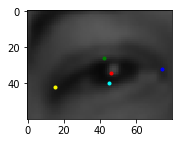

eyeGray: (80, 60)
XY: 408 181
WH: 66 49.5
eyeXY: 408 181
eyeWH: 59 44


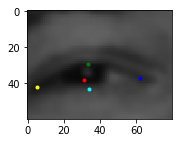

eyeGray: (80, 60)
16 _r 0.9 (-2, 2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 345 187
WH: 62 46.5
eyeXY: 345 187
eyeWH: 56 42


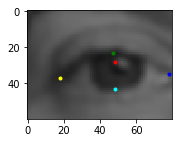

eyeGray: (80, 60)
XY: 448 190
WH: 67 50.25
eyeXY: 448 190
eyeWH: 60 45


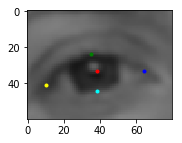

eyeGray: (80, 60)
17 _r 0.9 (-2, 2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 335 187
WH: 63 47.25
eyeXY: 335 187
eyeWH: 57 42


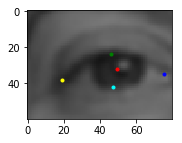

eyeGray: (80, 60)
XY: 437 191
WH: 68 51.0
eyeXY: 437 191
eyeWH: 61 45


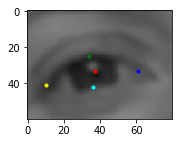

eyeGray: (80, 60)
18 _r 0.9 (-2, 2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 114 325
WH: 130 97.5
eyeXY: 114 325
eyeWH: 117 87


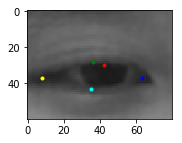

eyeGray: (80, 60)
XY: 317 339
WH: 125 93.75
eyeXY: 317 339
eyeWH: 113 84


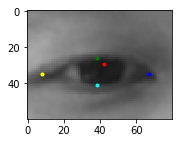

eyeGray: (80, 60)
19 _r 0.9 (-2, 2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 117 319
WH: 127 95.25
eyeXY: 117 319
eyeWH: 114 85


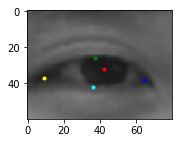

eyeGray: (80, 60)
XY: 319 331
WH: 125 93.75
eyeXY: 319 331
eyeWH: 113 84


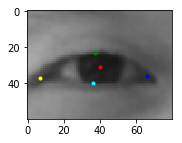

eyeGray: (80, 60)
20 _r 0.9 (-2, 2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 114 324
WH: 136 102.0
eyeXY: 114 324
eyeWH: 122 91


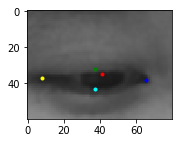

eyeGray: (80, 60)
XY: 312 339
WH: 133 99.75
eyeXY: 312 339
eyeWH: 120 90


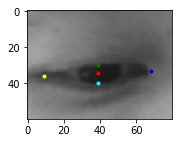

eyeGray: (80, 60)
21 _r 0.9 (-2, 2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 112 324
WH: 130 97.5
eyeXY: 112 324
eyeWH: 117 87


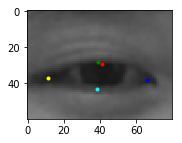

eyeGray: (80, 60)
XY: 316 337
WH: 129 96.75
eyeXY: 316 337
eyeWH: 116 87


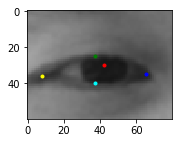

eyeGray: (80, 60)
22 _r 0.9 (-2, 2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 121 322
WH: 133 99.75
eyeXY: 121 322
eyeWH: 120 90


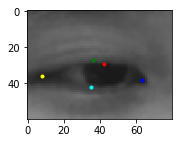

eyeGray: (80, 60)
XY: 320 336
WH: 129 96.75
eyeXY: 320 336
eyeWH: 116 87


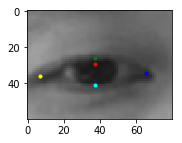

eyeGray: (80, 60)
1 _r 0.9 (2, 2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 305 261
WH: 82 61.5
eyeXY: 305 261
eyeWH: 74 55


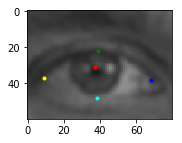

eyeGray: (80, 60)
XY: 443 266
WH: 78 58.5
eyeXY: 443 266
eyeWH: 70 52


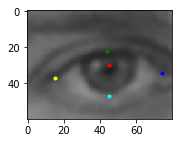

eyeGray: (80, 60)
2 _r 0.9 (2, 2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 255 216
WH: 76 57.0
eyeXY: 255 216
eyeWH: 68 51


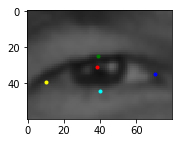

eyeGray: (80, 60)
XY: 391 216
WH: 66 49.5
eyeXY: 391 216
eyeWH: 59 44


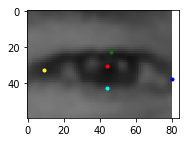

eyeGray: (80, 60)
3 _r 0.9 (2, 2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 266 224
WH: 66 49.5
eyeXY: 266 224
eyeWH: 59 44


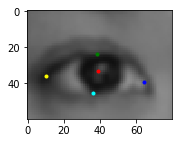

eyeGray: (80, 60)
XY: 369 221
WH: 63 47.25
eyeXY: 369 221
eyeWH: 57 42


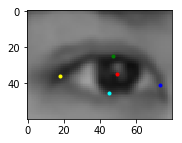

eyeGray: (80, 60)
4 _r 0.9 (2, 2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 266 236
WH: 65 48.75
eyeXY: 266 236
eyeWH: 59 44


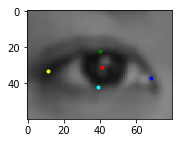

eyeGray: (80, 60)
XY: 374 234
WH: 63 47.25
eyeXY: 374 234
eyeWH: 57 42


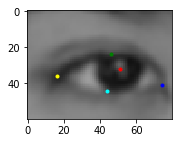

eyeGray: (80, 60)
5 _r 0.9 (2, 2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 257 214
WH: 85 63.75
eyeXY: 257 214
eyeWH: 77 57


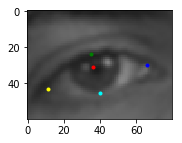

eyeGray: (80, 60)
XY: 399 197
WH: 90 67.5
eyeXY: 399 197
eyeWH: 81 60


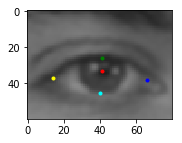

eyeGray: (80, 60)
6 _r 0.9 (2, 2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 308 268
WH: 60 45.0
eyeXY: 308 268
eyeWH: 54 40


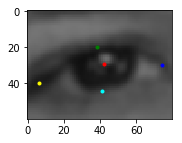

eyeGray: (80, 60)
XY: 421 250
WH: 65 48.75
eyeXY: 421 250
eyeWH: 59 44


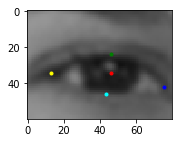

eyeGray: (80, 60)
7 _r 0.9 (2, 2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 324 260
WH: 64 48.0
eyeXY: 324 260
eyeWH: 58 43


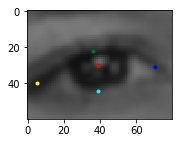

eyeGray: (80, 60)
XY: 438 245
WH: 67 50.25
eyeXY: 438 245
eyeWH: 60 45


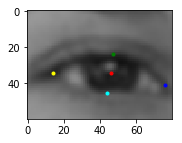

eyeGray: (80, 60)
8 _r 0.9 (2, 2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 328 230
WH: 54 40.5
eyeXY: 328 230
eyeWH: 49 36


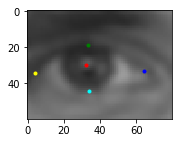

eyeGray: (80, 60)
XY: 424 220
WH: 52 39.0
eyeXY: 424 220
eyeWH: 47 35


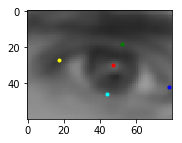

eyeGray: (80, 60)
9 _r 0.9 (2, 2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 310 225
WH: 63 47.25
eyeXY: 310 225
eyeWH: 57 42


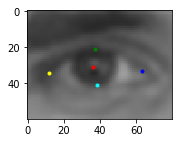

eyeGray: (80, 60)
XY: 410 219
WH: 52 39.0
eyeXY: 410 219
eyeWH: 47 35


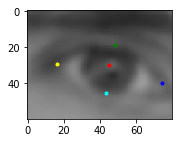

eyeGray: (80, 60)
10 _r 0.9 (2, 2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 332 197
WH: 63 47.25
eyeXY: 332 197
eyeWH: 57 42


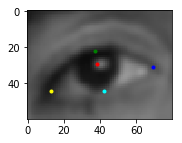

eyeGray: (80, 60)
XY: 431 182
WH: 64 48.0
eyeXY: 431 182
eyeWH: 58 43


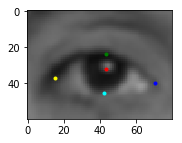

eyeGray: (80, 60)
11 _r 0.9 (2, 2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 333 197
WH: 67 50.25
eyeXY: 333 197
eyeWH: 60 45


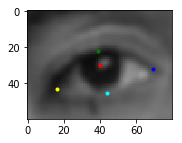

eyeGray: (80, 60)
XY: 435 186
WH: 65 48.75
eyeXY: 435 186
eyeWH: 59 44


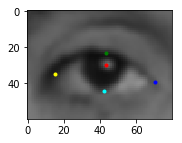

eyeGray: (80, 60)
12 _r 0.9 (2, 2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 280 176
WH: 63 47.25
eyeXY: 280 176
eyeWH: 57 42


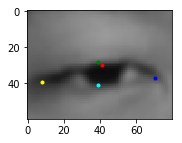

eyeGray: (80, 60)
XY: 375 166
WH: 71 53.25
eyeXY: 375 166
eyeWH: 64 48


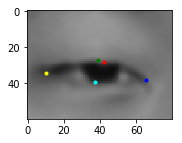

eyeGray: (80, 60)
13 _r 0.9 (2, 2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 305 166
WH: 61 45.75
eyeXY: 305 166
eyeWH: 55 41


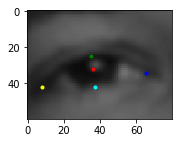

eyeGray: (80, 60)
XY: 407 159
WH: 66 49.5
eyeXY: 407 159
eyeWH: 59 44


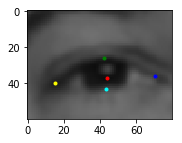

eyeGray: (80, 60)
14 _r 0.9 (2, 2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 292 168
WH: 62 46.5
eyeXY: 292 168
eyeWH: 56 42


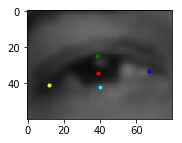

eyeGray: (80, 60)
XY: 395 162
WH: 64 48.0
eyeXY: 395 162
eyeWH: 58 43


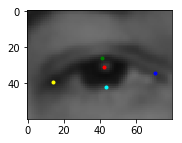

eyeGray: (80, 60)
15 _r 0.9 (2, 2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 320 186
WH: 60 45.0
eyeXY: 320 186
eyeWH: 54 40


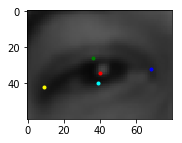

eyeGray: (80, 60)
XY: 412 181
WH: 66 49.5
eyeXY: 412 181
eyeWH: 59 44


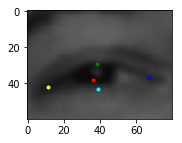

eyeGray: (80, 60)
16 _r 0.9 (2, 2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 349 187
WH: 62 46.5
eyeXY: 349 187
eyeWH: 56 42


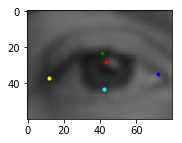

eyeGray: (80, 60)
XY: 452 190
WH: 67 50.25
eyeXY: 452 190
eyeWH: 60 45


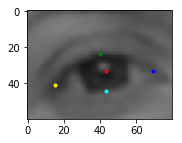

eyeGray: (80, 60)
17 _r 0.9 (2, 2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 339 187
WH: 63 47.25
eyeXY: 339 187
eyeWH: 57 42


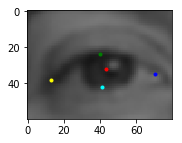

eyeGray: (80, 60)
XY: 441 191
WH: 68 51.0
eyeXY: 441 191
eyeWH: 61 45


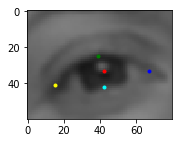

eyeGray: (80, 60)
18 _r 0.9 (2, 2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 118 325
WH: 130 97.5
eyeXY: 118 325
eyeWH: 117 87


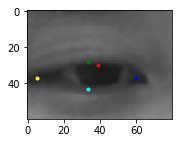

eyeGray: (80, 60)
XY: 321 339
WH: 125 93.75
eyeXY: 321 339
eyeWH: 113 84


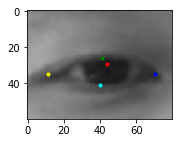

eyeGray: (80, 60)
19 _r 0.9 (2, 2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 121 319
WH: 127 95.25
eyeXY: 121 319
eyeWH: 114 85


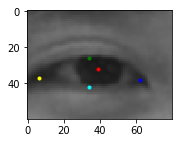

eyeGray: (80, 60)
XY: 323 331
WH: 125 93.75
eyeXY: 323 331
eyeWH: 113 84


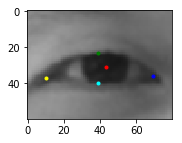

eyeGray: (80, 60)
20 _r 0.9 (2, 2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 118 324
WH: 136 102.0
eyeXY: 118 324
eyeWH: 122 91


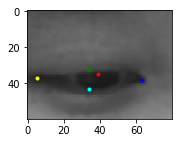

eyeGray: (80, 60)
XY: 316 339
WH: 133 99.75
eyeXY: 316 339
eyeWH: 120 90


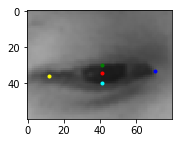

eyeGray: (80, 60)
21 _r 0.9 (2, 2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 116 324
WH: 130 97.5
eyeXY: 116 324
eyeWH: 117 87


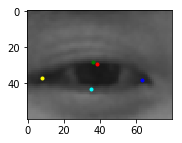

eyeGray: (80, 60)
XY: 320 337
WH: 129 96.75
eyeXY: 320 337
eyeWH: 116 87


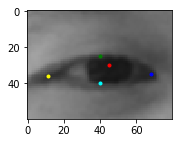

eyeGray: (80, 60)
22 _r 0.9 (2, 2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 125 322
WH: 133 99.75
eyeXY: 125 322
eyeWH: 120 90


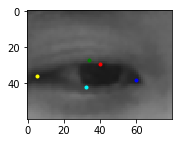

eyeGray: (80, 60)
XY: 324 336
WH: 129 96.75
eyeXY: 324 336
eyeWH: 116 87


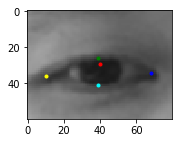

eyeGray: (80, 60)
1 _r 1.0 (-2, -2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 301 257
WH: 82 61.5
eyeXY: 301 257
eyeWH: 82 61


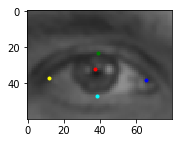

eyeGray: (80, 60)
XY: 439 262
WH: 78 58.5
eyeXY: 439 262
eyeWH: 78 58


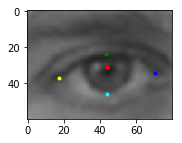

eyeGray: (80, 60)
2 _r 1.0 (-2, -2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 251 212
WH: 76 57.0
eyeXY: 251 212
eyeWH: 76 57


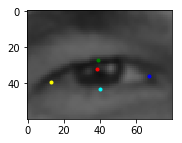

eyeGray: (80, 60)
XY: 387 212
WH: 66 49.5
eyeXY: 387 212
eyeWH: 66 49


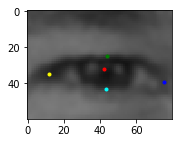

eyeGray: (80, 60)
3 _r 1.0 (-2, -2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 262 220
WH: 66 49.5
eyeXY: 262 220
eyeWH: 66 49


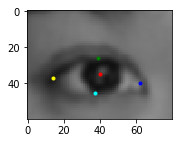

eyeGray: (80, 60)
XY: 365 217
WH: 63 47.25
eyeXY: 365 217
eyeWH: 63 47


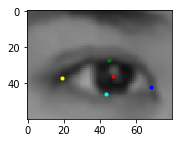

eyeGray: (80, 60)
4 _r 1.0 (-2, -2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 262 232
WH: 65 48.75
eyeXY: 262 232
eyeWH: 65 48


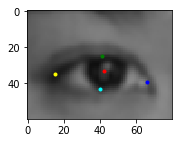

eyeGray: (80, 60)
XY: 370 230
WH: 63 47.25
eyeXY: 370 230
eyeWH: 63 47


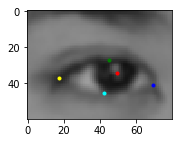

eyeGray: (80, 60)
5 _r 1.0 (-2, -2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 253 210
WH: 85 63.75
eyeXY: 253 210
eyeWH: 85 63


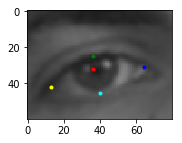

eyeGray: (80, 60)
XY: 395 193
WH: 90 67.5
eyeXY: 395 193
eyeWH: 90 67


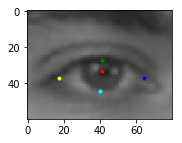

eyeGray: (80, 60)
6 _r 1.0 (-2, -2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 304 264
WH: 60 45.0
eyeXY: 304 264
eyeWH: 60 45


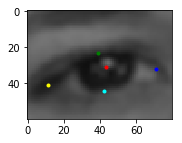

eyeGray: (80, 60)
XY: 417 246
WH: 65 48.75
eyeXY: 417 246
eyeWH: 65 48


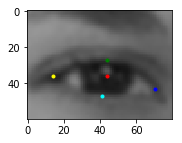

eyeGray: (80, 60)
7 _r 1.0 (-2, -2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 320 256
WH: 64 48.0
eyeXY: 320 256
eyeWH: 64 48


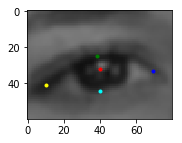

eyeGray: (80, 60)
XY: 434 241
WH: 67 50.25
eyeXY: 434 241
eyeWH: 67 50


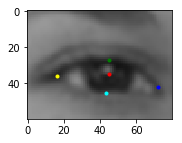

eyeGray: (80, 60)
8 _r 1.0 (-2, -2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 324 226
WH: 54 40.5
eyeXY: 324 226
eyeWH: 54 40


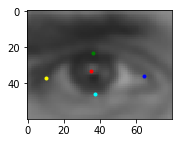

eyeGray: (80, 60)
XY: 420 216
WH: 52 39.0
eyeXY: 420 216
eyeWH: 52 39


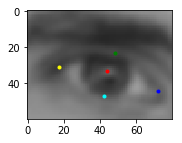

eyeGray: (80, 60)
9 _r 1.0 (-2, -2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 306 221
WH: 63 47.25
eyeXY: 306 221
eyeWH: 63 47


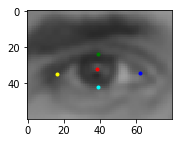

eyeGray: (80, 60)
XY: 406 215
WH: 52 39.0
eyeXY: 406 215
eyeWH: 52 39


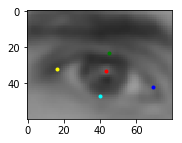

eyeGray: (80, 60)
10 _r 1.0 (-2, -2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 328 193
WH: 63 47.25
eyeXY: 328 193
eyeWH: 63 47


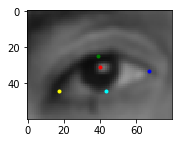

eyeGray: (80, 60)
XY: 427 178
WH: 64 48.0
eyeXY: 427 178
eyeWH: 64 48


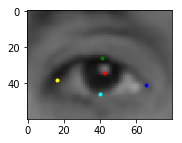

eyeGray: (80, 60)
11 _r 1.0 (-2, -2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 329 193
WH: 67 50.25
eyeXY: 329 193
eyeWH: 67 50


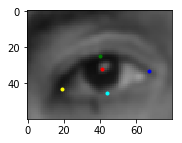

eyeGray: (80, 60)
XY: 431 182
WH: 65 48.75
eyeXY: 431 182
eyeWH: 65 48


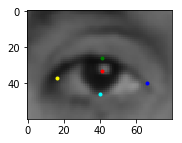

eyeGray: (80, 60)
12 _r 1.0 (-2, -2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 276 172
WH: 63 47.25
eyeXY: 276 172
eyeWH: 63 47


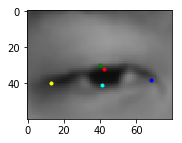

eyeGray: (80, 60)
XY: 371 162
WH: 71 53.25
eyeXY: 371 162
eyeWH: 71 53


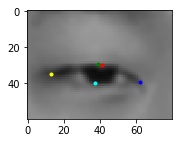

eyeGray: (80, 60)
13 _r 1.0 (-2, -2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 301 162
WH: 61 45.75
eyeXY: 301 162
eyeWH: 61 45


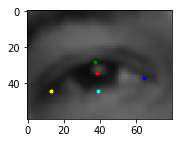

eyeGray: (80, 60)
XY: 403 155
WH: 66 49.5
eyeXY: 403 155
eyeWH: 66 49


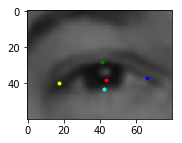

eyeGray: (80, 60)
14 _r 1.0 (-2, -2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 288 164
WH: 62 46.5
eyeXY: 288 164
eyeWH: 62 46


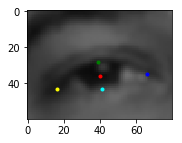

eyeGray: (80, 60)
XY: 391 158
WH: 64 48.0
eyeXY: 391 158
eyeWH: 64 48


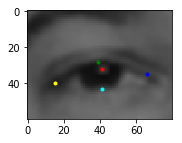

eyeGray: (80, 60)
15 _r 1.0 (-2, -2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 316 182
WH: 60 45.0
eyeXY: 316 182
eyeWH: 60 45


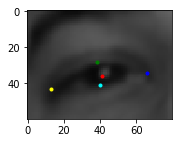

eyeGray: (80, 60)
XY: 408 177
WH: 66 49.5
eyeXY: 408 177
eyeWH: 66 49


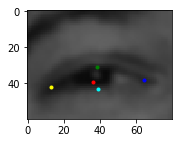

eyeGray: (80, 60)
16 _r 1.0 (-2, -2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 345 183
WH: 62 46.5
eyeXY: 345 183
eyeWH: 62 46


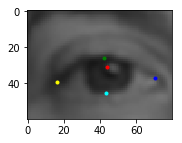

eyeGray: (80, 60)
XY: 448 186
WH: 67 50.25
eyeXY: 448 186
eyeWH: 67 50


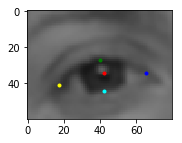

eyeGray: (80, 60)
17 _r 1.0 (-2, -2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 335 183
WH: 63 47.25
eyeXY: 335 183
eyeWH: 63 47


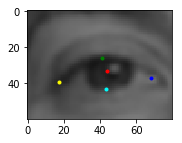

eyeGray: (80, 60)
XY: 437 187
WH: 68 51.0
eyeXY: 437 187
eyeWH: 68 51


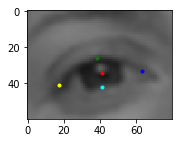

eyeGray: (80, 60)
18 _r 1.0 (-2, -2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 114 321
WH: 130 97.5
eyeXY: 114 321
eyeWH: 130 97


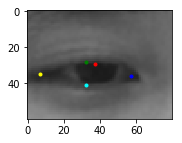

eyeGray: (80, 60)
XY: 317 335
WH: 125 93.75
eyeXY: 317 335
eyeWH: 125 93


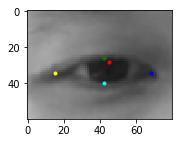

eyeGray: (80, 60)
19 _r 1.0 (-2, -2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 117 315
WH: 127 95.25
eyeXY: 117 315
eyeWH: 127 95


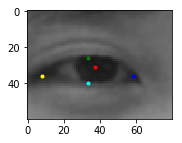

eyeGray: (80, 60)
XY: 319 327
WH: 125 93.75
eyeXY: 319 327
eyeWH: 125 93


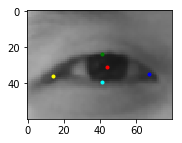

eyeGray: (80, 60)
20 _r 1.0 (-2, -2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 114 320
WH: 136 102.0
eyeXY: 114 320
eyeWH: 136 102


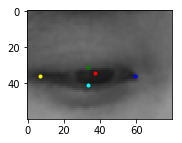

eyeGray: (80, 60)
XY: 312 335
WH: 133 99.75
eyeXY: 312 335
eyeWH: 133 99


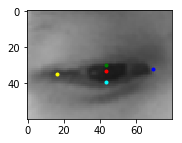

eyeGray: (80, 60)
21 _r 1.0 (-2, -2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 112 320
WH: 130 97.5
eyeXY: 112 320
eyeWH: 130 97


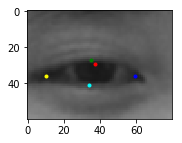

eyeGray: (80, 60)
XY: 316 333
WH: 129 96.75
eyeXY: 316 333
eyeWH: 129 96


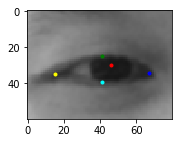

eyeGray: (80, 60)
22 _r 1.0 (-2, -2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 121 318
WH: 133 99.75
eyeXY: 121 318
eyeWH: 133 99


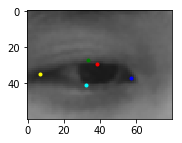

eyeGray: (80, 60)
XY: 320 332
WH: 129 96.75
eyeXY: 320 332
eyeWH: 129 96


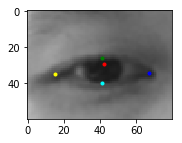

eyeGray: (80, 60)
1 _r 1.0 (2, -2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 305 257
WH: 82 61.5
eyeXY: 305 257
eyeWH: 82 61


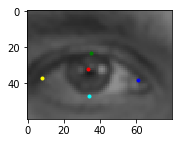

eyeGray: (80, 60)
XY: 443 262
WH: 78 58.5
eyeXY: 443 262
eyeWH: 78 58


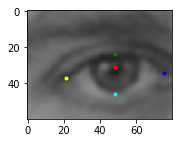

eyeGray: (80, 60)
2 _r 1.0 (2, -2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 255 212
WH: 76 57.0
eyeXY: 255 212
eyeWH: 76 57


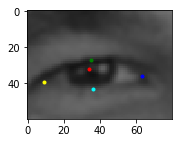

eyeGray: (80, 60)
XY: 391 212
WH: 66 49.5
eyeXY: 391 212
eyeWH: 66 49


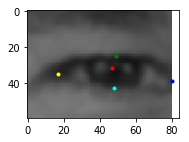

eyeGray: (80, 60)
3 _r 1.0 (2, -2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 266 220
WH: 66 49.5
eyeXY: 266 220
eyeWH: 66 49


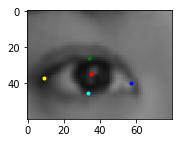

eyeGray: (80, 60)
XY: 369 217
WH: 63 47.25
eyeXY: 369 217
eyeWH: 63 47


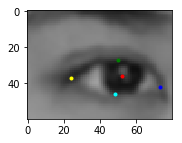

eyeGray: (80, 60)
4 _r 1.0 (2, -2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 266 232
WH: 65 48.75
eyeXY: 266 232
eyeWH: 65 48


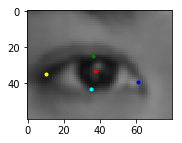

eyeGray: (80, 60)
XY: 374 230
WH: 63 47.25
eyeXY: 374 230
eyeWH: 63 47


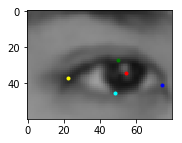

eyeGray: (80, 60)
5 _r 1.0 (2, -2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 257 210
WH: 85 63.75
eyeXY: 257 210
eyeWH: 85 63


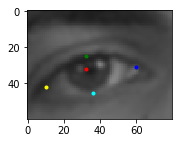

eyeGray: (80, 60)
XY: 399 193
WH: 90 67.5
eyeXY: 399 193
eyeWH: 90 67


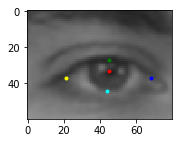

eyeGray: (80, 60)
6 _r 1.0 (2, -2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 308 264
WH: 60 45.0
eyeXY: 308 264
eyeWH: 60 45


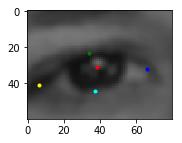

eyeGray: (80, 60)
XY: 421 246
WH: 65 48.75
eyeXY: 421 246
eyeWH: 65 48


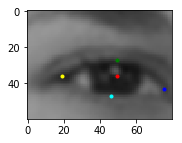

eyeGray: (80, 60)
7 _r 1.0 (2, -2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 324 256
WH: 64 48.0
eyeXY: 324 256
eyeWH: 64 48


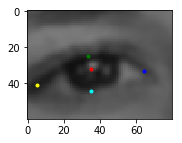

eyeGray: (80, 60)
XY: 438 241
WH: 67 50.25
eyeXY: 438 241
eyeWH: 67 50


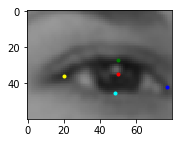

eyeGray: (80, 60)
8 _r 1.0 (2, -2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 328 226
WH: 54 40.5
eyeXY: 328 226
eyeWH: 54 40


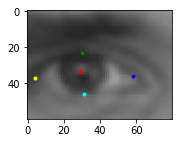

eyeGray: (80, 60)
XY: 424 216
WH: 52 39.0
eyeXY: 424 216
eyeWH: 52 39


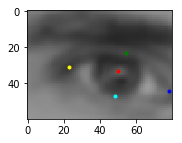

eyeGray: (80, 60)
9 _r 1.0 (2, -2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 310 221
WH: 63 47.25
eyeXY: 310 221
eyeWH: 63 47


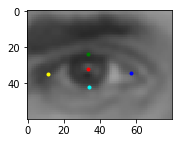

eyeGray: (80, 60)
XY: 410 215
WH: 52 39.0
eyeXY: 410 215
eyeWH: 52 39


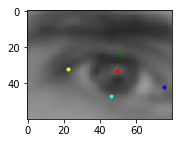

eyeGray: (80, 60)
10 _r 1.0 (2, -2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 332 193
WH: 63 47.25
eyeXY: 332 193
eyeWH: 63 47


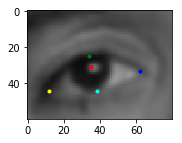

eyeGray: (80, 60)
XY: 431 178
WH: 64 48.0
eyeXY: 431 178
eyeWH: 64 48


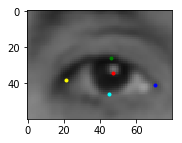

eyeGray: (80, 60)
11 _r 1.0 (2, -2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 333 193
WH: 67 50.25
eyeXY: 333 193
eyeWH: 67 50


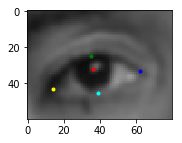

eyeGray: (80, 60)
XY: 435 182
WH: 65 48.75
eyeXY: 435 182
eyeWH: 65 48


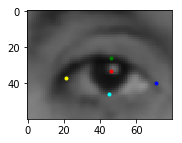

eyeGray: (80, 60)
12 _r 1.0 (2, -2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 280 172
WH: 63 47.25
eyeXY: 280 172
eyeWH: 63 47


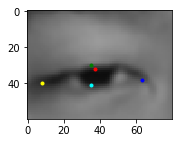

eyeGray: (80, 60)
XY: 375 162
WH: 71 53.25
eyeXY: 375 162
eyeWH: 71 53


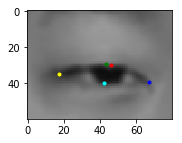

eyeGray: (80, 60)
13 _r 1.0 (2, -2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 305 162
WH: 61 45.75
eyeXY: 305 162
eyeWH: 61 45


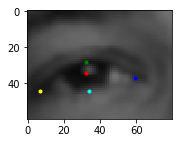

eyeGray: (80, 60)
XY: 407 155
WH: 66 49.5
eyeXY: 407 155
eyeWH: 66 49


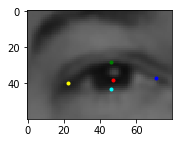

eyeGray: (80, 60)
14 _r 1.0 (2, -2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 292 164
WH: 62 46.5
eyeXY: 292 164
eyeWH: 62 46


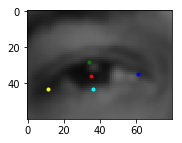

eyeGray: (80, 60)
XY: 395 158
WH: 64 48.0
eyeXY: 395 158
eyeWH: 64 48


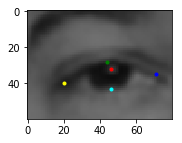

eyeGray: (80, 60)
15 _r 1.0 (2, -2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 320 182
WH: 60 45.0
eyeXY: 320 182
eyeWH: 60 45


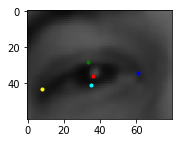

eyeGray: (80, 60)
XY: 412 177
WH: 66 49.5
eyeXY: 412 177
eyeWH: 66 49


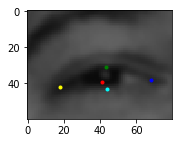

eyeGray: (80, 60)
16 _r 1.0 (2, -2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 349 183
WH: 62 46.5
eyeXY: 349 183
eyeWH: 62 46


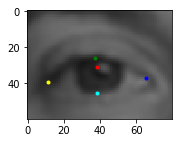

eyeGray: (80, 60)
XY: 452 186
WH: 67 50.25
eyeXY: 452 186
eyeWH: 67 50


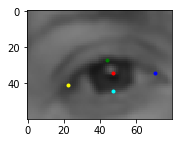

eyeGray: (80, 60)
17 _r 1.0 (2, -2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 339 183
WH: 63 47.25
eyeXY: 339 183
eyeWH: 63 47


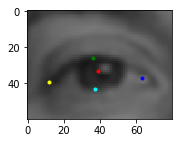

eyeGray: (80, 60)
XY: 441 187
WH: 68 51.0
eyeXY: 441 187
eyeWH: 68 51


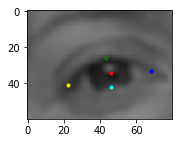

eyeGray: (80, 60)
18 _r 1.0 (2, -2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 118 321
WH: 130 97.5
eyeXY: 118 321
eyeWH: 130 97


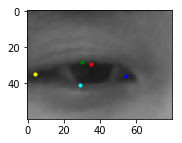

eyeGray: (80, 60)
XY: 321 335
WH: 125 93.75
eyeXY: 321 335
eyeWH: 125 93


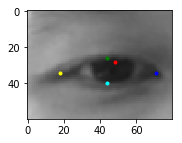

eyeGray: (80, 60)
19 _r 1.0 (2, -2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 121 315
WH: 127 95.25
eyeXY: 121 315
eyeWH: 127 95


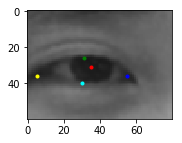

eyeGray: (80, 60)
XY: 323 327
WH: 125 93.75
eyeXY: 323 327
eyeWH: 125 93


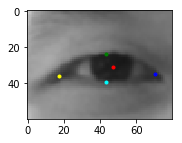

eyeGray: (80, 60)
20 _r 1.0 (2, -2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 118 320
WH: 136 102.0
eyeXY: 118 320
eyeWH: 136 102


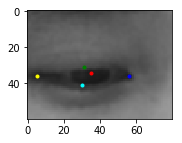

eyeGray: (80, 60)
XY: 316 335
WH: 133 99.75
eyeXY: 316 335
eyeWH: 133 99


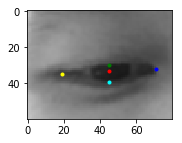

eyeGray: (80, 60)
21 _r 1.0 (2, -2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 116 320
WH: 130 97.5
eyeXY: 116 320
eyeWH: 130 97


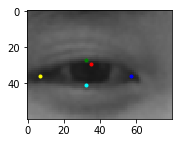

eyeGray: (80, 60)
XY: 320 333
WH: 129 96.75
eyeXY: 320 333
eyeWH: 129 96


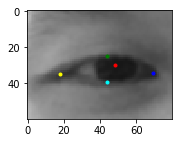

eyeGray: (80, 60)
22 _r 1.0 (2, -2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 125 318
WH: 133 99.75
eyeXY: 125 318
eyeWH: 133 99


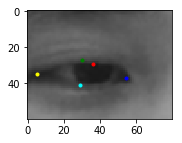

eyeGray: (80, 60)
XY: 324 332
WH: 129 96.75
eyeXY: 324 332
eyeWH: 129 96


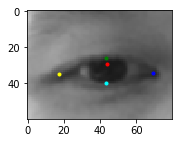

eyeGray: (80, 60)
1 _r 1.0 (0, 0)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 303 259
WH: 82 61.5
eyeXY: 303 259
eyeWH: 82 61


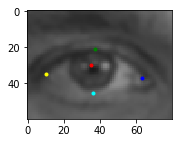

eyeGray: (80, 60)
XY: 441 264
WH: 78 58.5
eyeXY: 441 264
eyeWH: 78 58


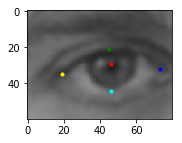

eyeGray: (80, 60)
2 _r 1.0 (0, 0)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 253 214
WH: 76 57.0
eyeXY: 253 214
eyeWH: 76 57


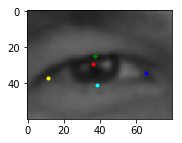

eyeGray: (80, 60)
XY: 389 214
WH: 66 49.5
eyeXY: 389 214
eyeWH: 66 49


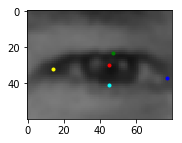

eyeGray: (80, 60)
3 _r 1.0 (0, 0)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 264 222
WH: 66 49.5
eyeXY: 264 222
eyeWH: 66 49


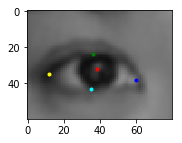

eyeGray: (80, 60)
XY: 367 219
WH: 63 47.25
eyeXY: 367 219
eyeWH: 63 47


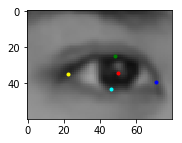

eyeGray: (80, 60)
4 _r 1.0 (0, 0)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 264 234
WH: 65 48.75
eyeXY: 264 234
eyeWH: 65 48


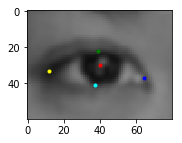

eyeGray: (80, 60)
XY: 372 232
WH: 63 47.25
eyeXY: 372 232
eyeWH: 63 47


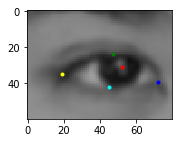

eyeGray: (80, 60)
5 _r 1.0 (0, 0)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 255 212
WH: 85 63.75
eyeXY: 255 212
eyeWH: 85 63


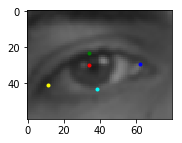

eyeGray: (80, 60)
XY: 397 195
WH: 90 67.5
eyeXY: 397 195
eyeWH: 90 67


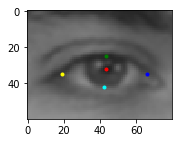

eyeGray: (80, 60)
6 _r 1.0 (0, 0)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 306 266
WH: 60 45.0
eyeXY: 306 266
eyeWH: 60 45


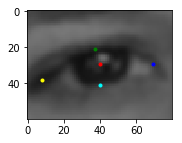

eyeGray: (80, 60)
XY: 419 248
WH: 65 48.75
eyeXY: 419 248
eyeWH: 65 48


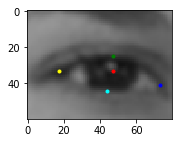

eyeGray: (80, 60)
7 _r 1.0 (0, 0)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 322 258
WH: 64 48.0
eyeXY: 322 258
eyeWH: 64 48


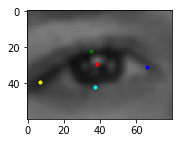

eyeGray: (80, 60)
XY: 436 243
WH: 67 50.25
eyeXY: 436 243
eyeWH: 67 50


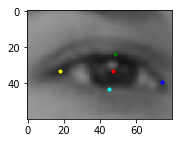

eyeGray: (80, 60)
8 _r 1.0 (0, 0)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 326 228
WH: 54 40.5
eyeXY: 326 228
eyeWH: 54 40


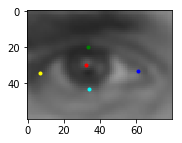

eyeGray: (80, 60)
XY: 422 218
WH: 52 39.0
eyeXY: 422 218
eyeWH: 52 39


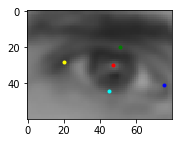

eyeGray: (80, 60)
9 _r 1.0 (0, 0)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 308 223
WH: 63 47.25
eyeXY: 308 223
eyeWH: 63 47


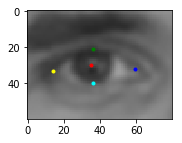

eyeGray: (80, 60)
XY: 408 217
WH: 52 39.0
eyeXY: 408 217
eyeWH: 52 39


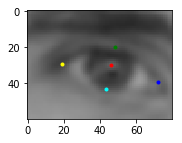

eyeGray: (80, 60)
10 _r 1.0 (0, 0)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 330 195
WH: 63 47.25
eyeXY: 330 195
eyeWH: 63 47


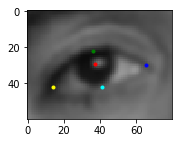

eyeGray: (80, 60)
XY: 429 180
WH: 64 48.0
eyeXY: 429 180
eyeWH: 64 48


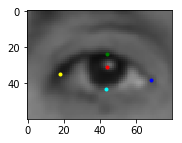

eyeGray: (80, 60)
11 _r 1.0 (0, 0)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 331 195
WH: 67 50.25
eyeXY: 331 195
eyeWH: 67 50


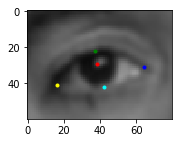

eyeGray: (80, 60)
XY: 433 184
WH: 65 48.75
eyeXY: 433 184
eyeWH: 65 48


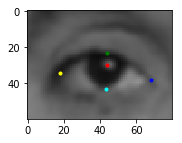

eyeGray: (80, 60)
12 _r 1.0 (0, 0)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 278 174
WH: 63 47.25
eyeXY: 278 174
eyeWH: 63 47


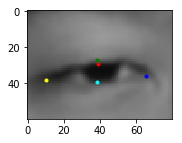

eyeGray: (80, 60)
XY: 373 164
WH: 71 53.25
eyeXY: 373 164
eyeWH: 71 53


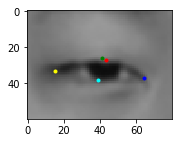

eyeGray: (80, 60)
13 _r 1.0 (0, 0)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 303 164
WH: 61 45.75
eyeXY: 303 164
eyeWH: 61 45


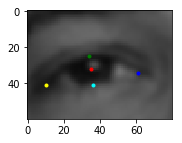

eyeGray: (80, 60)
XY: 405 157
WH: 66 49.5
eyeXY: 405 157
eyeWH: 66 49


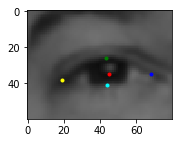

eyeGray: (80, 60)
14 _r 1.0 (0, 0)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 290 166
WH: 62 46.5
eyeXY: 290 166
eyeWH: 62 46


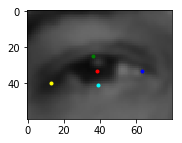

eyeGray: (80, 60)
XY: 393 160
WH: 64 48.0
eyeXY: 393 160
eyeWH: 64 48


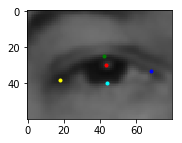

eyeGray: (80, 60)
15 _r 1.0 (0, 0)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 318 184
WH: 60 45.0
eyeXY: 318 184
eyeWH: 60 45


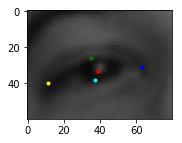

eyeGray: (80, 60)
XY: 410 179
WH: 66 49.5
eyeXY: 410 179
eyeWH: 66 49


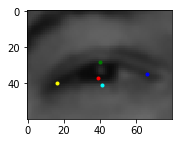

eyeGray: (80, 60)
16 _r 1.0 (0, 0)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 347 185
WH: 62 46.5
eyeXY: 347 185
eyeWH: 62 46


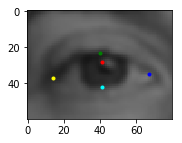

eyeGray: (80, 60)
XY: 450 188
WH: 67 50.25
eyeXY: 450 188
eyeWH: 67 50


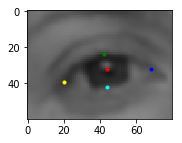

eyeGray: (80, 60)
17 _r 1.0 (0, 0)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 337 185
WH: 63 47.25
eyeXY: 337 185
eyeWH: 63 47


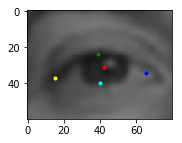

eyeGray: (80, 60)
XY: 439 189
WH: 68 51.0
eyeXY: 439 189
eyeWH: 68 51


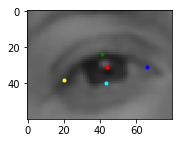

eyeGray: (80, 60)
18 _r 1.0 (0, 0)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 116 323
WH: 130 97.5
eyeXY: 116 323
eyeWH: 130 97


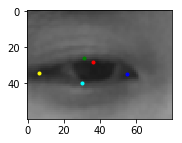

eyeGray: (80, 60)
XY: 319 337
WH: 125 93.75
eyeXY: 319 337
eyeWH: 125 93


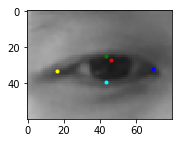

eyeGray: (80, 60)
19 _r 1.0 (0, 0)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 119 317
WH: 127 95.25
eyeXY: 119 317
eyeWH: 127 95


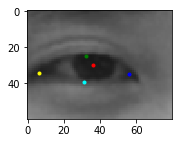

eyeGray: (80, 60)
XY: 321 329
WH: 125 93.75
eyeXY: 321 329
eyeWH: 125 93


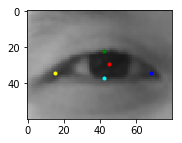

eyeGray: (80, 60)
20 _r 1.0 (0, 0)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 116 322
WH: 136 102.0
eyeXY: 116 322
eyeWH: 136 102


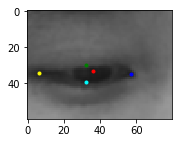

eyeGray: (80, 60)
XY: 314 337
WH: 133 99.75
eyeXY: 314 337
eyeWH: 133 99


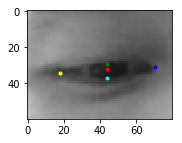

eyeGray: (80, 60)
21 _r 1.0 (0, 0)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 114 322
WH: 130 97.5
eyeXY: 114 322
eyeWH: 130 97


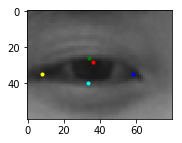

eyeGray: (80, 60)
XY: 318 335
WH: 129 96.75
eyeXY: 318 335
eyeWH: 129 96


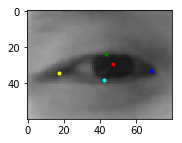

eyeGray: (80, 60)
22 _r 1.0 (0, 0)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 123 320
WH: 133 99.75
eyeXY: 123 320
eyeWH: 133 99


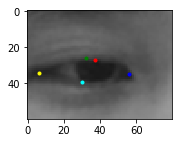

eyeGray: (80, 60)
XY: 322 334
WH: 129 96.75
eyeXY: 322 334
eyeWH: 129 96


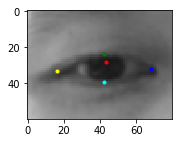

eyeGray: (80, 60)
1 _r 1.0 (-2, 2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 301 261
WH: 82 61.5
eyeXY: 301 261
eyeWH: 82 61


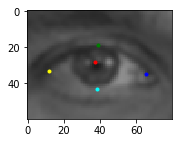

eyeGray: (80, 60)
XY: 439 266
WH: 78 58.5
eyeXY: 439 266
eyeWH: 78 58


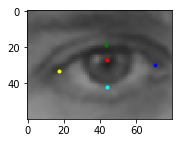

eyeGray: (80, 60)
2 _r 1.0 (-2, 2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 251 216
WH: 76 57.0
eyeXY: 251 216
eyeWH: 76 57


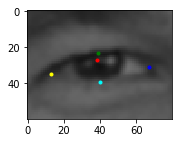

eyeGray: (80, 60)
XY: 387 216
WH: 66 49.5
eyeXY: 387 216
eyeWH: 66 49


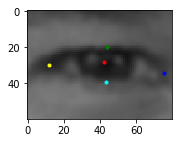

eyeGray: (80, 60)
3 _r 1.0 (-2, 2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 262 224
WH: 66 49.5
eyeXY: 262 224
eyeWH: 66 49


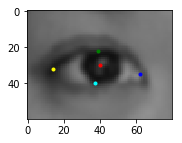

eyeGray: (80, 60)
XY: 365 221
WH: 63 47.25
eyeXY: 365 221
eyeWH: 63 47


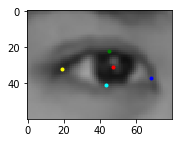

eyeGray: (80, 60)
4 _r 1.0 (-2, 2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 262 236
WH: 65 48.75
eyeXY: 262 236
eyeWH: 65 48


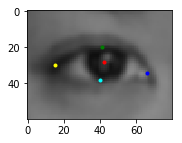

eyeGray: (80, 60)
XY: 370 234
WH: 63 47.25
eyeXY: 370 234
eyeWH: 63 47


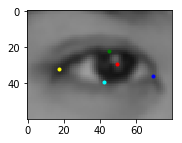

eyeGray: (80, 60)
5 _r 1.0 (-2, 2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 253 214
WH: 85 63.75
eyeXY: 253 214
eyeWH: 85 63


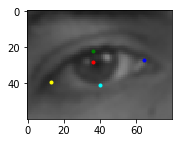

eyeGray: (80, 60)
XY: 395 197
WH: 90 67.5
eyeXY: 395 197
eyeWH: 90 67


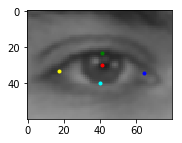

eyeGray: (80, 60)
6 _r 1.0 (-2, 2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 304 268
WH: 60 45.0
eyeXY: 304 268
eyeWH: 60 45


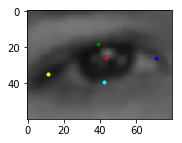

eyeGray: (80, 60)
XY: 417 250
WH: 65 48.75
eyeXY: 417 250
eyeWH: 65 48


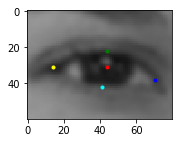

eyeGray: (80, 60)
7 _r 1.0 (-2, 2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 320 260
WH: 64 48.0
eyeXY: 320 260
eyeWH: 64 48


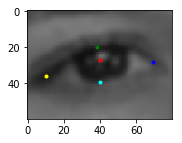

eyeGray: (80, 60)
XY: 434 245
WH: 67 50.25
eyeXY: 434 245
eyeWH: 67 50


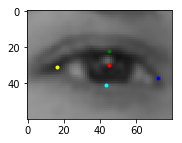

eyeGray: (80, 60)
8 _r 1.0 (-2, 2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 324 230
WH: 54 40.5
eyeXY: 324 230
eyeWH: 54 40


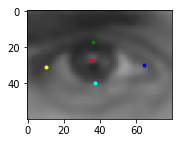

eyeGray: (80, 60)
XY: 420 220
WH: 52 39.0
eyeXY: 420 220
eyeWH: 52 39


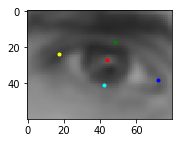

eyeGray: (80, 60)
9 _r 1.0 (-2, 2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 306 225
WH: 63 47.25
eyeXY: 306 225
eyeWH: 63 47


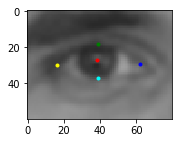

eyeGray: (80, 60)
XY: 406 219
WH: 52 39.0
eyeXY: 406 219
eyeWH: 52 39


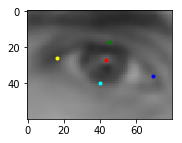

eyeGray: (80, 60)
10 _r 1.0 (-2, 2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 328 197
WH: 63 47.25
eyeXY: 328 197
eyeWH: 63 47


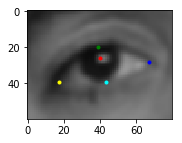

eyeGray: (80, 60)
XY: 427 182
WH: 64 48.0
eyeXY: 427 182
eyeWH: 64 48


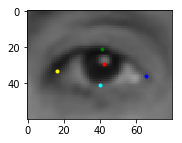

eyeGray: (80, 60)
11 _r 1.0 (-2, 2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 329 197
WH: 67 50.25
eyeXY: 329 197
eyeWH: 67 50


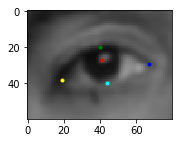

eyeGray: (80, 60)
XY: 431 186
WH: 65 48.75
eyeXY: 431 186
eyeWH: 65 48


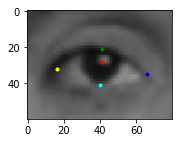

eyeGray: (80, 60)
12 _r 1.0 (-2, 2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 276 176
WH: 63 47.25
eyeXY: 276 176
eyeWH: 63 47


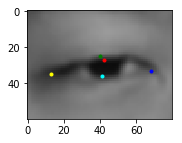

eyeGray: (80, 60)
XY: 371 166
WH: 71 53.25
eyeXY: 371 166
eyeWH: 71 53


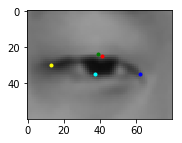

eyeGray: (80, 60)
13 _r 1.0 (-2, 2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 301 166
WH: 61 45.75
eyeXY: 301 166
eyeWH: 61 45


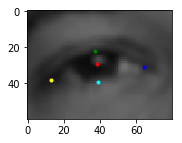

eyeGray: (80, 60)
XY: 403 159
WH: 66 49.5
eyeXY: 403 159
eyeWH: 66 49


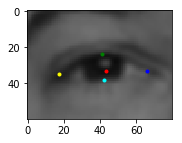

eyeGray: (80, 60)
14 _r 1.0 (-2, 2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 288 168
WH: 62 46.5
eyeXY: 288 168
eyeWH: 62 46


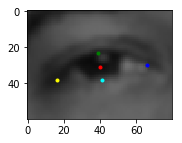

eyeGray: (80, 60)
XY: 391 162
WH: 64 48.0
eyeXY: 391 162
eyeWH: 64 48


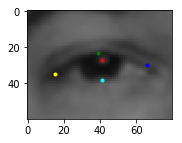

eyeGray: (80, 60)
15 _r 1.0 (-2, 2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 316 186
WH: 60 45.0
eyeXY: 316 186
eyeWH: 60 45


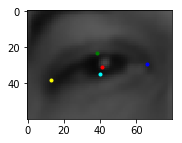

eyeGray: (80, 60)
XY: 408 181
WH: 66 49.5
eyeXY: 408 181
eyeWH: 66 49


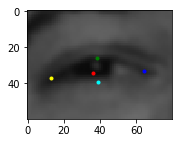

eyeGray: (80, 60)
16 _r 1.0 (-2, 2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 345 187
WH: 62 46.5
eyeXY: 345 187
eyeWH: 62 46


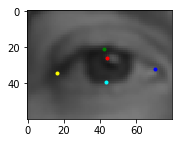

eyeGray: (80, 60)
XY: 448 190
WH: 67 50.25
eyeXY: 448 190
eyeWH: 67 50


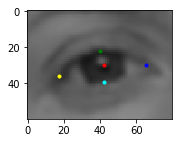

eyeGray: (80, 60)
17 _r 1.0 (-2, 2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 335 187
WH: 63 47.25
eyeXY: 335 187
eyeWH: 63 47


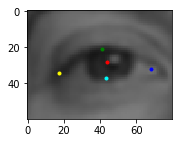

eyeGray: (80, 60)
XY: 437 191
WH: 68 51.0
eyeXY: 437 191
eyeWH: 68 51


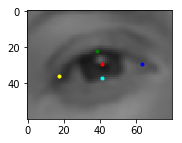

eyeGray: (80, 60)
18 _r 1.0 (-2, 2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 114 325
WH: 130 97.5
eyeXY: 114 325
eyeWH: 130 97


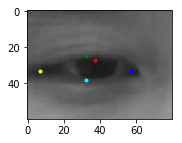

eyeGray: (80, 60)
XY: 317 339
WH: 125 93.75
eyeXY: 317 339
eyeWH: 125 93


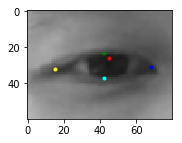

eyeGray: (80, 60)
19 _r 1.0 (-2, 2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 117 319
WH: 127 95.25
eyeXY: 117 319
eyeWH: 127 95


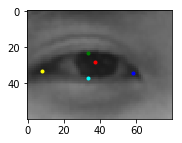

eyeGray: (80, 60)
XY: 319 331
WH: 125 93.75
eyeXY: 319 331
eyeWH: 125 93


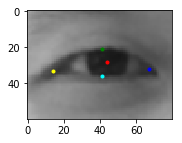

eyeGray: (80, 60)
20 _r 1.0 (-2, 2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 114 324
WH: 136 102.0
eyeXY: 114 324
eyeWH: 136 102


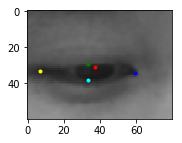

eyeGray: (80, 60)
XY: 312 339
WH: 133 99.75
eyeXY: 312 339
eyeWH: 133 99


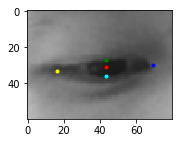

eyeGray: (80, 60)
21 _r 1.0 (-2, 2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 112 324
WH: 130 97.5
eyeXY: 112 324
eyeWH: 130 97


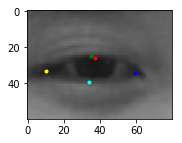

eyeGray: (80, 60)
XY: 316 337
WH: 129 96.75
eyeXY: 316 337
eyeWH: 129 96


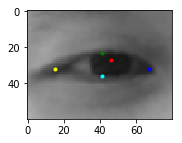

eyeGray: (80, 60)
22 _r 1.0 (-2, 2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 121 322
WH: 133 99.75
eyeXY: 121 322
eyeWH: 133 99


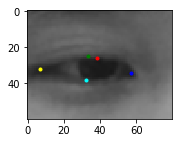

eyeGray: (80, 60)
XY: 320 336
WH: 129 96.75
eyeXY: 320 336
eyeWH: 129 96


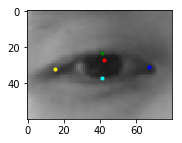

eyeGray: (80, 60)
1 _r 1.0 (2, 2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 305 261
WH: 82 61.5
eyeXY: 305 261
eyeWH: 82 61


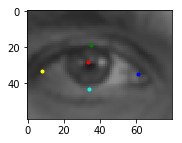

eyeGray: (80, 60)
XY: 443 266
WH: 78 58.5
eyeXY: 443 266
eyeWH: 78 58


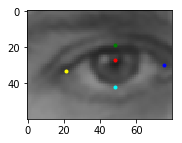

eyeGray: (80, 60)
2 _r 1.0 (2, 2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 255 216
WH: 76 57.0
eyeXY: 255 216
eyeWH: 76 57


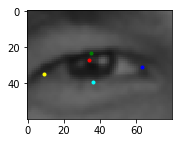

eyeGray: (80, 60)
XY: 391 216
WH: 66 49.5
eyeXY: 391 216
eyeWH: 66 49


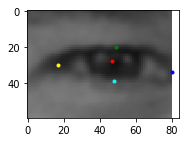

eyeGray: (80, 60)
3 _r 1.0 (2, 2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 266 224
WH: 66 49.5
eyeXY: 266 224
eyeWH: 66 49


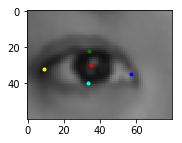

eyeGray: (80, 60)
XY: 369 221
WH: 63 47.25
eyeXY: 369 221
eyeWH: 63 47


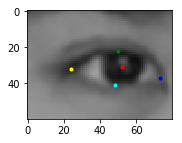

eyeGray: (80, 60)
4 _r 1.0 (2, 2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 266 236
WH: 65 48.75
eyeXY: 266 236
eyeWH: 65 48


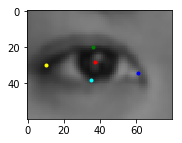

eyeGray: (80, 60)
XY: 374 234
WH: 63 47.25
eyeXY: 374 234
eyeWH: 63 47


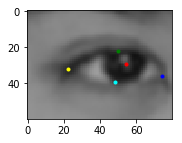

eyeGray: (80, 60)
5 _r 1.0 (2, 2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 257 214
WH: 85 63.75
eyeXY: 257 214
eyeWH: 85 63


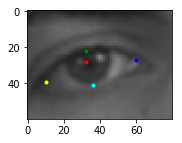

eyeGray: (80, 60)
XY: 399 197
WH: 90 67.5
eyeXY: 399 197
eyeWH: 90 67


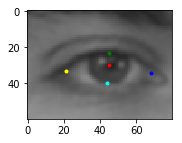

eyeGray: (80, 60)
6 _r 1.0 (2, 2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 308 268
WH: 60 45.0
eyeXY: 308 268
eyeWH: 60 45


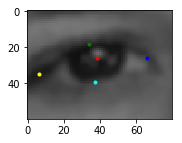

eyeGray: (80, 60)
XY: 421 250
WH: 65 48.75
eyeXY: 421 250
eyeWH: 65 48


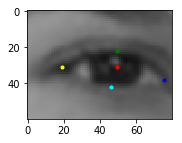

eyeGray: (80, 60)
7 _r 1.0 (2, 2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 324 260
WH: 64 48.0
eyeXY: 324 260
eyeWH: 64 48


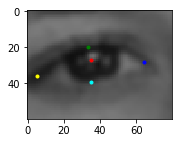

eyeGray: (80, 60)
XY: 438 245
WH: 67 50.25
eyeXY: 438 245
eyeWH: 67 50


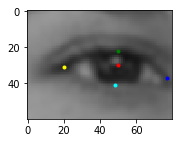

eyeGray: (80, 60)
8 _r 1.0 (2, 2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 328 230
WH: 54 40.5
eyeXY: 328 230
eyeWH: 54 40


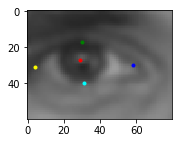

eyeGray: (80, 60)
XY: 424 220
WH: 52 39.0
eyeXY: 424 220
eyeWH: 52 39


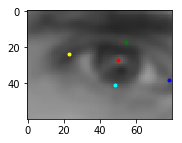

eyeGray: (80, 60)
9 _r 1.0 (2, 2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 310 225
WH: 63 47.25
eyeXY: 310 225
eyeWH: 63 47


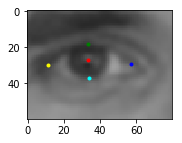

eyeGray: (80, 60)
XY: 410 219
WH: 52 39.0
eyeXY: 410 219
eyeWH: 52 39


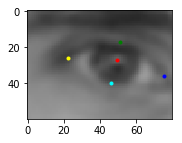

eyeGray: (80, 60)
10 _r 1.0 (2, 2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 332 197
WH: 63 47.25
eyeXY: 332 197
eyeWH: 63 47


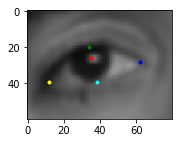

eyeGray: (80, 60)
XY: 431 182
WH: 64 48.0
eyeXY: 431 182
eyeWH: 64 48


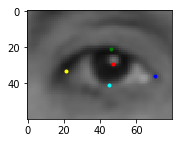

eyeGray: (80, 60)
11 _r 1.0 (2, 2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 333 197
WH: 67 50.25
eyeXY: 333 197
eyeWH: 67 50


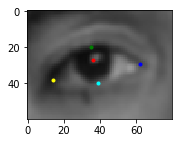

eyeGray: (80, 60)
XY: 435 186
WH: 65 48.75
eyeXY: 435 186
eyeWH: 65 48


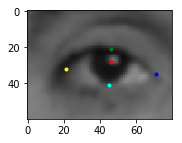

eyeGray: (80, 60)
12 _r 1.0 (2, 2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 280 176
WH: 63 47.25
eyeXY: 280 176
eyeWH: 63 47


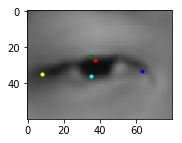

eyeGray: (80, 60)
XY: 375 166
WH: 71 53.25
eyeXY: 375 166
eyeWH: 71 53


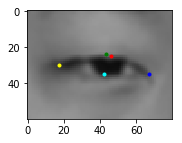

eyeGray: (80, 60)
13 _r 1.0 (2, 2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 305 166
WH: 61 45.75
eyeXY: 305 166
eyeWH: 61 45


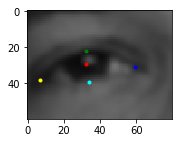

eyeGray: (80, 60)
XY: 407 159
WH: 66 49.5
eyeXY: 407 159
eyeWH: 66 49


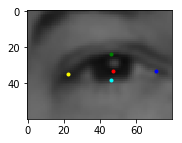

eyeGray: (80, 60)
14 _r 1.0 (2, 2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 292 168
WH: 62 46.5
eyeXY: 292 168
eyeWH: 62 46


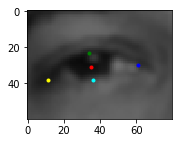

eyeGray: (80, 60)
XY: 395 162
WH: 64 48.0
eyeXY: 395 162
eyeWH: 64 48


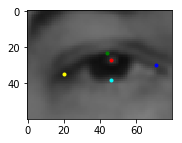

eyeGray: (80, 60)
15 _r 1.0 (2, 2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 320 186
WH: 60 45.0
eyeXY: 320 186
eyeWH: 60 45


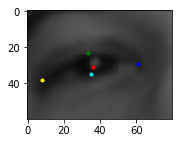

eyeGray: (80, 60)
XY: 412 181
WH: 66 49.5
eyeXY: 412 181
eyeWH: 66 49


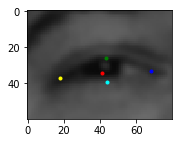

eyeGray: (80, 60)
16 _r 1.0 (2, 2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 349 187
WH: 62 46.5
eyeXY: 349 187
eyeWH: 62 46


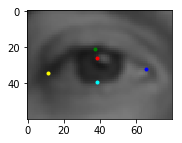

eyeGray: (80, 60)
XY: 452 190
WH: 67 50.25
eyeXY: 452 190
eyeWH: 67 50


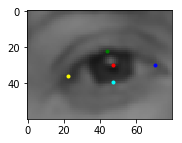

eyeGray: (80, 60)
17 _r 1.0 (2, 2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 339 187
WH: 63 47.25
eyeXY: 339 187
eyeWH: 63 47


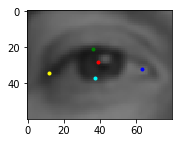

eyeGray: (80, 60)
XY: 441 191
WH: 68 51.0
eyeXY: 441 191
eyeWH: 68 51


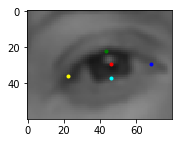

eyeGray: (80, 60)
18 _r 1.0 (2, 2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 118 325
WH: 130 97.5
eyeXY: 118 325
eyeWH: 130 97


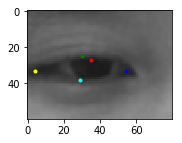

eyeGray: (80, 60)
XY: 321 339
WH: 125 93.75
eyeXY: 321 339
eyeWH: 125 93


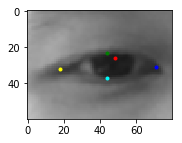

eyeGray: (80, 60)
19 _r 1.0 (2, 2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 121 319
WH: 127 95.25
eyeXY: 121 319
eyeWH: 127 95


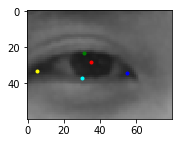

eyeGray: (80, 60)
XY: 323 331
WH: 125 93.75
eyeXY: 323 331
eyeWH: 125 93


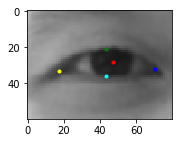

eyeGray: (80, 60)
20 _r 1.0 (2, 2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 118 324
WH: 136 102.0
eyeXY: 118 324
eyeWH: 136 102


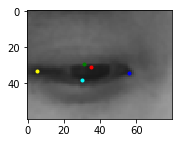

eyeGray: (80, 60)
XY: 316 339
WH: 133 99.75
eyeXY: 316 339
eyeWH: 133 99


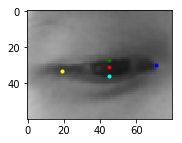

eyeGray: (80, 60)
21 _r 1.0 (2, 2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 116 324
WH: 130 97.5
eyeXY: 116 324
eyeWH: 130 97


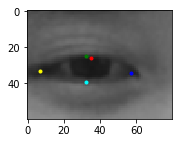

eyeGray: (80, 60)
XY: 320 337
WH: 129 96.75
eyeXY: 320 337
eyeWH: 129 96


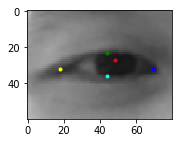

eyeGray: (80, 60)
22 _r 1.0 (2, 2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 125 322
WH: 133 99.75
eyeXY: 125 322
eyeWH: 133 99


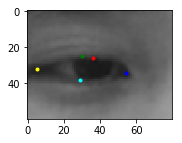

eyeGray: (80, 60)
XY: 324 336
WH: 129 96.75
eyeXY: 324 336
eyeWH: 129 96


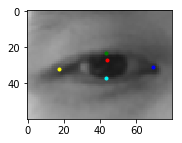

eyeGray: (80, 60)
1 _r 1.1 (-2, -2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 301 257
WH: 82 61.5
eyeXY: 301 257
eyeWH: 90 67


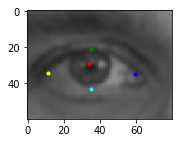

eyeGray: (80, 60)
XY: 439 262
WH: 78 58.5
eyeXY: 439 262
eyeWH: 86 64


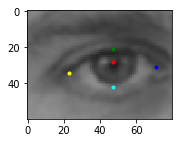

eyeGray: (80, 60)
2 _r 1.1 (-2, -2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 251 212
WH: 76 57.0
eyeXY: 251 212
eyeWH: 84 63


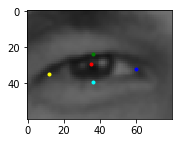

eyeGray: (80, 60)
XY: 387 212
WH: 66 49.5
eyeXY: 387 212
eyeWH: 73 54


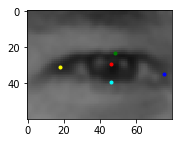

eyeGray: (80, 60)
3 _r 1.1 (-2, -2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 262 220
WH: 66 49.5
eyeXY: 262 220
eyeWH: 73 54


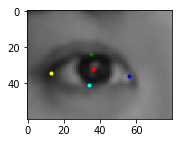

eyeGray: (80, 60)
XY: 365 217
WH: 63 47.25
eyeXY: 365 217
eyeWH: 69 51


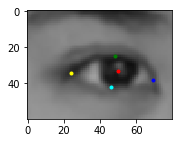

eyeGray: (80, 60)
4 _r 1.1 (-2, -2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 262 232
WH: 65 48.75
eyeXY: 262 232
eyeWH: 72 54


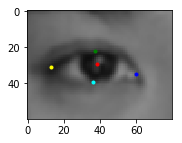

eyeGray: (80, 60)
XY: 370 230
WH: 63 47.25
eyeXY: 370 230
eyeWH: 69 51


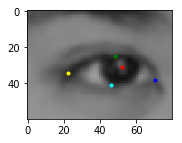

eyeGray: (80, 60)
5 _r 1.1 (-2, -2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 253 210
WH: 85 63.75
eyeXY: 253 210
eyeWH: 94 70


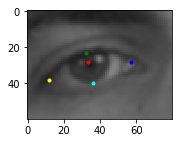

eyeGray: (80, 60)
XY: 395 193
WH: 90 67.5
eyeXY: 395 193
eyeWH: 99 74


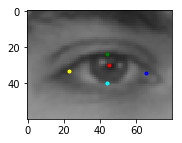

eyeGray: (80, 60)
6 _r 1.1 (-2, -2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 304 264
WH: 60 45.0
eyeXY: 304 264
eyeWH: 66 49


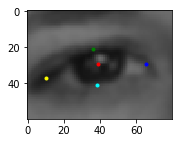

eyeGray: (80, 60)
XY: 417 246
WH: 65 48.75
eyeXY: 417 246
eyeWH: 72 54


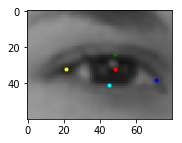

eyeGray: (80, 60)
7 _r 1.1 (-2, -2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 320 256
WH: 64 48.0
eyeXY: 320 256
eyeWH: 70 52


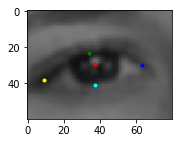

eyeGray: (80, 60)
XY: 434 241
WH: 67 50.25
eyeXY: 434 241
eyeWH: 74 55


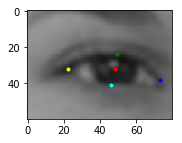

eyeGray: (80, 60)
8 _r 1.1 (-2, -2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 324 226
WH: 54 40.5
eyeXY: 324 226
eyeWH: 59 44


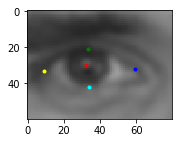

eyeGray: (80, 60)
XY: 420 216
WH: 52 39.0
eyeXY: 420 216
eyeWH: 57 42


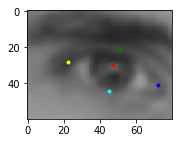

eyeGray: (80, 60)
9 _r 1.1 (-2, -2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 306 221
WH: 63 47.25
eyeXY: 306 221
eyeWH: 69 51


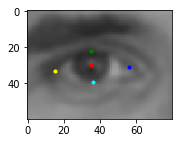

eyeGray: (80, 60)
XY: 406 215
WH: 52 39.0
eyeXY: 406 215
eyeWH: 57 42


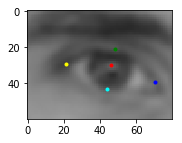

eyeGray: (80, 60)
10 _r 1.1 (-2, -2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 328 193
WH: 63 47.25
eyeXY: 328 193
eyeWH: 69 51


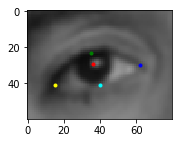

eyeGray: (80, 60)
XY: 427 178
WH: 64 48.0
eyeXY: 427 178
eyeWH: 70 52


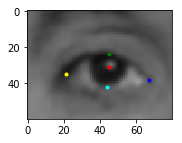

eyeGray: (80, 60)
11 _r 1.1 (-2, -2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 329 193
WH: 67 50.25
eyeXY: 329 193
eyeWH: 74 55


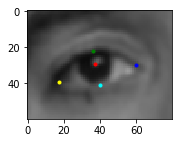

eyeGray: (80, 60)
XY: 431 182
WH: 65 48.75
eyeXY: 431 182
eyeWH: 72 54


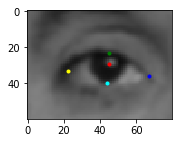

eyeGray: (80, 60)
12 _r 1.1 (-2, -2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 276 172
WH: 63 47.25
eyeXY: 276 172
eyeWH: 69 51


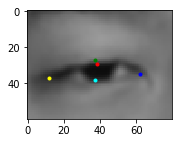

eyeGray: (80, 60)
XY: 371 162
WH: 71 53.25
eyeXY: 371 162
eyeWH: 78 58


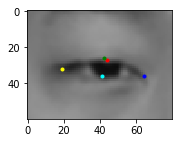

eyeGray: (80, 60)
13 _r 1.1 (-2, -2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 301 162
WH: 61 45.75
eyeXY: 301 162
eyeWH: 67 50


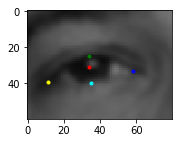

eyeGray: (80, 60)
XY: 403 155
WH: 66 49.5
eyeXY: 403 155
eyeWH: 73 54


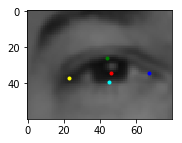

eyeGray: (80, 60)
14 _r 1.1 (-2, -2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 288 164
WH: 62 46.5
eyeXY: 288 164
eyeWH: 68 51


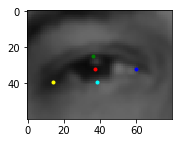

eyeGray: (80, 60)
XY: 391 158
WH: 64 48.0
eyeXY: 391 158
eyeWH: 70 52


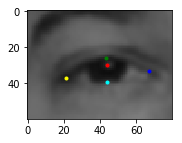

eyeGray: (80, 60)
15 _r 1.1 (-2, -2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 316 182
WH: 60 45.0
eyeXY: 316 182
eyeWH: 66 49


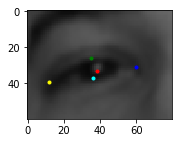

eyeGray: (80, 60)
XY: 408 177
WH: 66 49.5
eyeXY: 408 177
eyeWH: 73 54


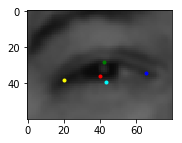

eyeGray: (80, 60)
16 _r 1.1 (-2, -2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 345 183
WH: 62 46.5
eyeXY: 345 183
eyeWH: 68 51


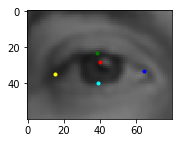

eyeGray: (80, 60)
XY: 448 186
WH: 67 50.25
eyeXY: 448 186
eyeWH: 74 55


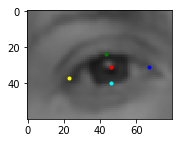

eyeGray: (80, 60)
17 _r 1.1 (-2, -2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 335 183
WH: 63 47.25
eyeXY: 335 183
eyeWH: 69 51


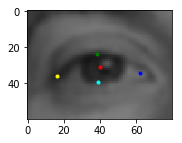

eyeGray: (80, 60)
XY: 437 187
WH: 68 51.0
eyeXY: 437 187
eyeWH: 75 56


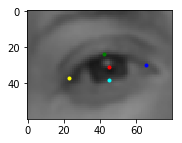

eyeGray: (80, 60)
18 _r 1.1 (-2, -2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 114 321
WH: 130 97.5
eyeXY: 114 321
eyeWH: 143 107


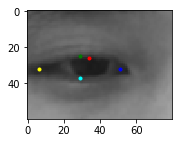

eyeGray: (80, 60)
XY: 317 335
WH: 125 93.75
eyeXY: 317 335
eyeWH: 138 103


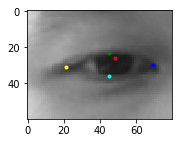

eyeGray: (80, 60)
19 _r 1.1 (-2, -2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 117 315
WH: 127 95.25
eyeXY: 117 315
eyeWH: 140 105


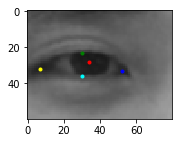

eyeGray: (80, 60)
XY: 319 327
WH: 125 93.75
eyeXY: 319 327
eyeWH: 138 103


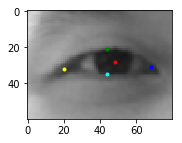

eyeGray: (80, 60)
20 _r 1.1 (-2, -2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 114 320
WH: 136 102.0
eyeXY: 114 320
eyeWH: 150 112


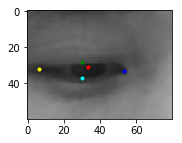

eyeGray: (80, 60)
XY: 312 335
WH: 133 99.75
eyeXY: 312 335
eyeWH: 146 109


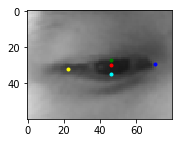

eyeGray: (80, 60)
21 _r 1.1 (-2, -2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 112 320
WH: 130 97.5
eyeXY: 112 320
eyeWH: 143 107


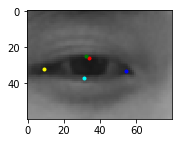

eyeGray: (80, 60)
XY: 316 333
WH: 129 96.75
eyeXY: 316 333
eyeWH: 142 106


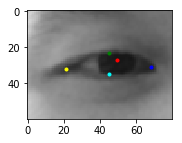

eyeGray: (80, 60)
22 _r 1.1 (-2, -2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 121 318
WH: 133 99.75
eyeXY: 121 318
eyeWH: 146 109


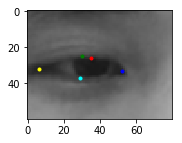

eyeGray: (80, 60)
XY: 320 332
WH: 129 96.75
eyeXY: 320 332
eyeWH: 142 106


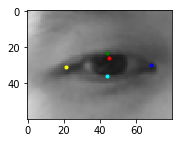

eyeGray: (80, 60)
1 _r 1.1 (2, -2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 305 257
WH: 82 61.5
eyeXY: 305 257
eyeWH: 90 67


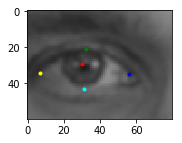

eyeGray: (80, 60)
XY: 443 262
WH: 78 58.5
eyeXY: 443 262
eyeWH: 86 64


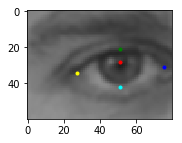

eyeGray: (80, 60)
2 _r 1.1 (2, -2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 255 212
WH: 76 57.0
eyeXY: 255 212
eyeWH: 84 63


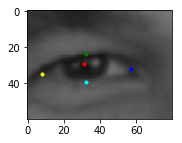

eyeGray: (80, 60)
XY: 391 212
WH: 66 49.5
eyeXY: 391 212
eyeWH: 73 54


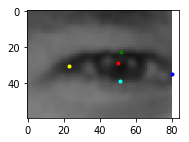

eyeGray: (80, 60)
3 _r 1.1 (2, -2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 266 220
WH: 66 49.5
eyeXY: 266 220
eyeWH: 73 54


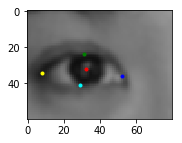

eyeGray: (80, 60)
XY: 369 217
WH: 63 47.25
eyeXY: 369 217
eyeWH: 69 51


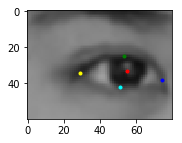

eyeGray: (80, 60)
4 _r 1.1 (2, -2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 266 232
WH: 65 48.75
eyeXY: 266 232
eyeWH: 72 54


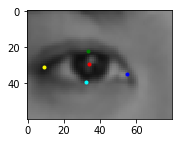

eyeGray: (80, 60)
XY: 374 230
WH: 63 47.25
eyeXY: 374 230
eyeWH: 69 51


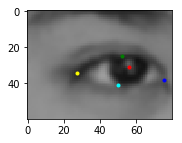

eyeGray: (80, 60)
5 _r 1.1 (2, -2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 257 210
WH: 85 63.75
eyeXY: 257 210
eyeWH: 94 70


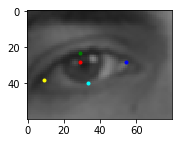

eyeGray: (80, 60)
XY: 399 193
WH: 90 67.5
eyeXY: 399 193
eyeWH: 99 74


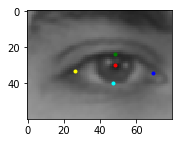

eyeGray: (80, 60)
6 _r 1.1 (2, -2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 308 264
WH: 60 45.0
eyeXY: 308 264
eyeWH: 66 49


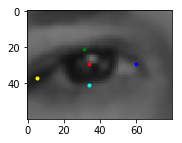

eyeGray: (80, 60)
XY: 421 246
WH: 65 48.75
eyeXY: 421 246
eyeWH: 72 54


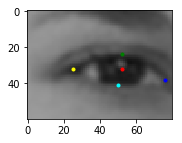

eyeGray: (80, 60)
7 _r 1.1 (2, -2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 324 256
WH: 64 48.0
eyeXY: 324 256
eyeWH: 70 52


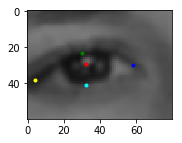

eyeGray: (80, 60)
XY: 438 241
WH: 67 50.25
eyeXY: 438 241
eyeWH: 74 55


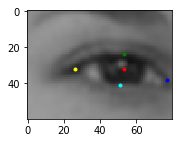

eyeGray: (80, 60)
8 _r 1.1 (2, -2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 328 226
WH: 54 40.5
eyeXY: 328 226
eyeWH: 59 44


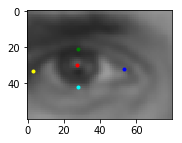

eyeGray: (80, 60)
XY: 424 216
WH: 52 39.0
eyeXY: 424 216
eyeWH: 57 42


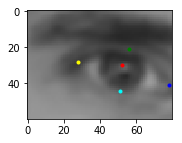

eyeGray: (80, 60)
9 _r 1.1 (2, -2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 310 221
WH: 63 47.25
eyeXY: 310 221
eyeWH: 69 51


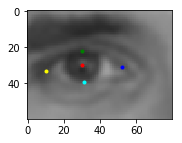

eyeGray: (80, 60)
XY: 410 215
WH: 52 39.0
eyeXY: 410 215
eyeWH: 57 42


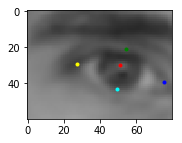

eyeGray: (80, 60)
10 _r 1.1 (2, -2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 332 193
WH: 63 47.25
eyeXY: 332 193
eyeWH: 69 51


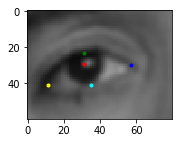

eyeGray: (80, 60)
XY: 431 178
WH: 64 48.0
eyeXY: 431 178
eyeWH: 70 52


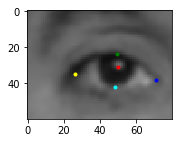

eyeGray: (80, 60)
11 _r 1.1 (2, -2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 333 193
WH: 67 50.25
eyeXY: 333 193
eyeWH: 74 55


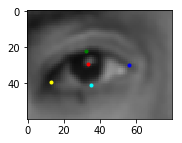

eyeGray: (80, 60)
XY: 435 182
WH: 65 48.75
eyeXY: 435 182
eyeWH: 72 54


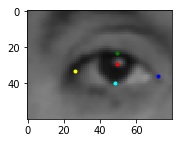

eyeGray: (80, 60)
12 _r 1.1 (2, -2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 280 172
WH: 63 47.25
eyeXY: 280 172
eyeWH: 69 51


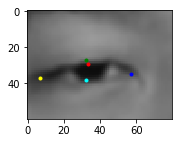

eyeGray: (80, 60)
XY: 375 162
WH: 71 53.25
eyeXY: 375 162
eyeWH: 78 58


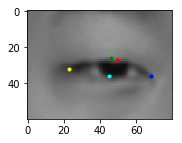

eyeGray: (80, 60)
13 _r 1.1 (2, -2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 305 162
WH: 61 45.75
eyeXY: 305 162
eyeWH: 67 50


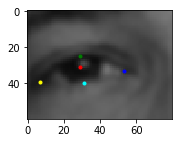

eyeGray: (80, 60)
XY: 407 155
WH: 66 49.5
eyeXY: 407 155
eyeWH: 73 54


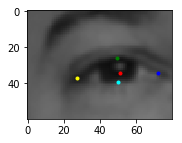

eyeGray: (80, 60)
14 _r 1.1 (2, -2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 292 164
WH: 62 46.5
eyeXY: 292 164
eyeWH: 68 51


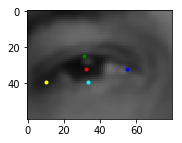

eyeGray: (80, 60)
XY: 395 158
WH: 64 48.0
eyeXY: 395 158
eyeWH: 70 52


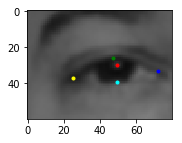

eyeGray: (80, 60)
15 _r 1.1 (2, -2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 320 182
WH: 60 45.0
eyeXY: 320 182
eyeWH: 66 49


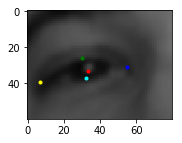

eyeGray: (80, 60)
XY: 412 177
WH: 66 49.5
eyeXY: 412 177
eyeWH: 73 54


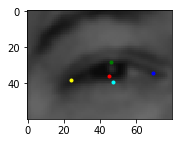

eyeGray: (80, 60)
16 _r 1.1 (2, -2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 349 183
WH: 62 46.5
eyeXY: 349 183
eyeWH: 68 51


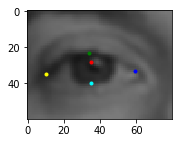

eyeGray: (80, 60)
XY: 452 186
WH: 67 50.25
eyeXY: 452 186
eyeWH: 74 55


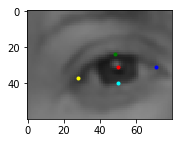

eyeGray: (80, 60)
17 _r 1.1 (2, -2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 339 183
WH: 63 47.25
eyeXY: 339 183
eyeWH: 69 51


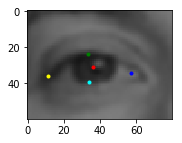

eyeGray: (80, 60)
XY: 441 187
WH: 68 51.0
eyeXY: 441 187
eyeWH: 75 56


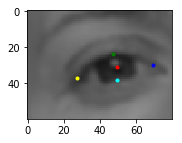

eyeGray: (80, 60)
18 _r 1.1 (2, -2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 118 321
WH: 130 97.5
eyeXY: 118 321
eyeWH: 143 107


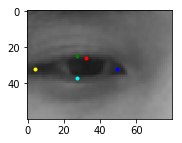

eyeGray: (80, 60)
XY: 321 335
WH: 125 93.75
eyeXY: 321 335
eyeWH: 138 103


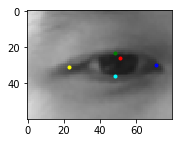

eyeGray: (80, 60)
19 _r 1.1 (2, -2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 121 315
WH: 127 95.25
eyeXY: 121 315
eyeWH: 140 105


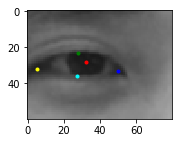

eyeGray: (80, 60)
XY: 323 327
WH: 125 93.75
eyeXY: 323 327
eyeWH: 138 103


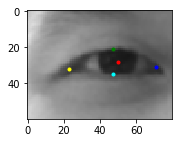

eyeGray: (80, 60)
20 _r 1.1 (2, -2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 118 320
WH: 136 102.0
eyeXY: 118 320
eyeWH: 150 112


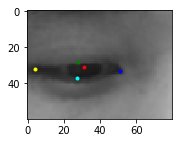

eyeGray: (80, 60)
XY: 316 335
WH: 133 99.75
eyeXY: 316 335
eyeWH: 146 109


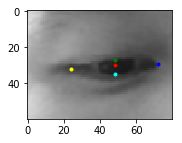

eyeGray: (80, 60)
21 _r 1.1 (2, -2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 116 320
WH: 130 97.5
eyeXY: 116 320
eyeWH: 143 107


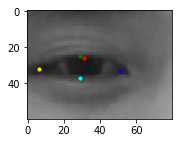

eyeGray: (80, 60)
XY: 320 333
WH: 129 96.75
eyeXY: 320 333
eyeWH: 142 106


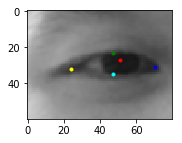

eyeGray: (80, 60)
22 _r 1.1 (2, -2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 125 318
WH: 133 99.75
eyeXY: 125 318
eyeWH: 146 109


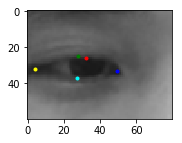

eyeGray: (80, 60)
XY: 324 332
WH: 129 96.75
eyeXY: 324 332
eyeWH: 142 106


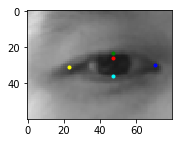

eyeGray: (80, 60)
1 _r 1.1 (0, 0)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 303 259
WH: 82 61.5
eyeXY: 303 259
eyeWH: 90 67


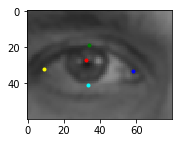

eyeGray: (80, 60)
XY: 441 264
WH: 78 58.5
eyeXY: 441 264
eyeWH: 86 64


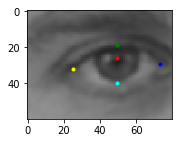

eyeGray: (80, 60)
2 _r 1.1 (0, 0)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 253 214
WH: 76 57.0
eyeXY: 253 214
eyeWH: 84 63


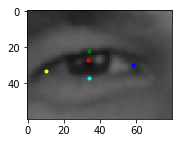

eyeGray: (80, 60)
XY: 389 214
WH: 66 49.5
eyeXY: 389 214
eyeWH: 73 54


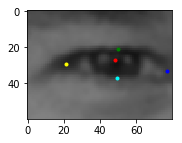

eyeGray: (80, 60)
3 _r 1.1 (0, 0)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 264 222
WH: 66 49.5
eyeXY: 264 222
eyeWH: 73 54


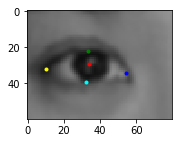

eyeGray: (80, 60)
XY: 367 219
WH: 63 47.25
eyeXY: 367 219
eyeWH: 69 51


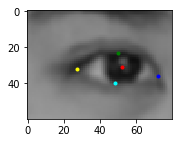

eyeGray: (80, 60)
4 _r 1.1 (0, 0)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 264 234
WH: 65 48.75
eyeXY: 264 234
eyeWH: 72 54


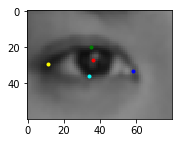

eyeGray: (80, 60)
XY: 372 232
WH: 63 47.25
eyeXY: 372 232
eyeWH: 69 51


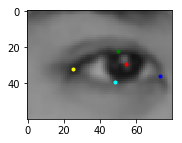

eyeGray: (80, 60)
5 _r 1.1 (0, 0)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 255 212
WH: 85 63.75
eyeXY: 255 212
eyeWH: 94 70


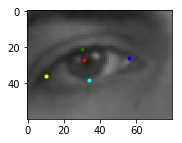

eyeGray: (80, 60)
XY: 397 195
WH: 90 67.5
eyeXY: 397 195
eyeWH: 99 74


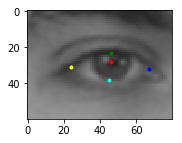

eyeGray: (80, 60)
6 _r 1.1 (0, 0)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 306 266
WH: 60 45.0
eyeXY: 306 266
eyeWH: 66 49


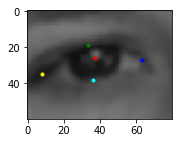

eyeGray: (80, 60)
XY: 419 248
WH: 65 48.75
eyeXY: 419 248
eyeWH: 72 54


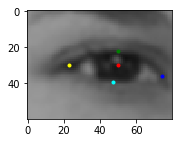

eyeGray: (80, 60)
7 _r 1.1 (0, 0)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 322 258
WH: 64 48.0
eyeXY: 322 258
eyeWH: 70 52


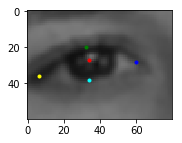

eyeGray: (80, 60)
XY: 436 243
WH: 67 50.25
eyeXY: 436 243
eyeWH: 74 55


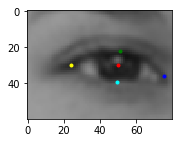

eyeGray: (80, 60)
8 _r 1.1 (0, 0)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 326 228
WH: 54 40.5
eyeXY: 326 228
eyeWH: 59 44


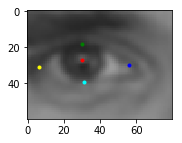

eyeGray: (80, 60)
XY: 422 218
WH: 52 39.0
eyeXY: 422 218
eyeWH: 57 42


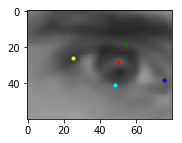

eyeGray: (80, 60)
9 _r 1.1 (0, 0)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 308 223
WH: 63 47.25
eyeXY: 308 223
eyeWH: 69 51


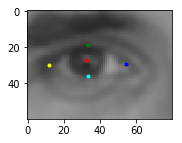

eyeGray: (80, 60)
XY: 408 217
WH: 52 39.0
eyeXY: 408 217
eyeWH: 57 42


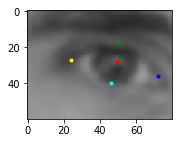

eyeGray: (80, 60)
10 _r 1.1 (0, 0)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 330 195
WH: 63 47.25
eyeXY: 330 195
eyeWH: 69 51


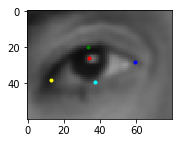

eyeGray: (80, 60)
XY: 429 180
WH: 64 48.0
eyeXY: 429 180
eyeWH: 70 52


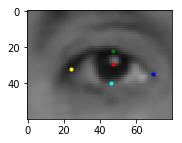

eyeGray: (80, 60)
11 _r 1.1 (0, 0)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 331 195
WH: 67 50.25
eyeXY: 331 195
eyeWH: 74 55


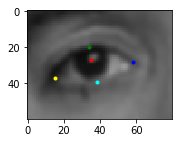

eyeGray: (80, 60)
XY: 433 184
WH: 65 48.75
eyeXY: 433 184
eyeWH: 72 54


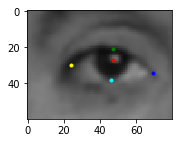

eyeGray: (80, 60)
12 _r 1.1 (0, 0)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 278 174
WH: 63 47.25
eyeXY: 278 174
eyeWH: 69 51


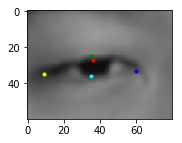

eyeGray: (80, 60)
XY: 373 164
WH: 71 53.25
eyeXY: 373 164
eyeWH: 78 58


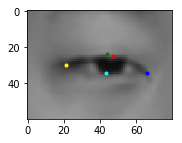

eyeGray: (80, 60)
13 _r 1.1 (0, 0)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 303 164
WH: 61 45.75
eyeXY: 303 164
eyeWH: 67 50


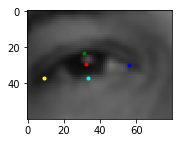

eyeGray: (80, 60)
XY: 405 157
WH: 66 49.5
eyeXY: 405 157
eyeWH: 73 54


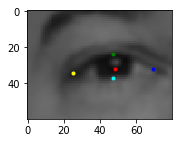

eyeGray: (80, 60)
14 _r 1.1 (0, 0)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 290 166
WH: 62 46.5
eyeXY: 290 166
eyeWH: 68 51


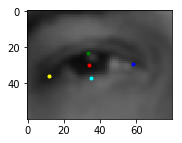

eyeGray: (80, 60)
XY: 393 160
WH: 64 48.0
eyeXY: 393 160
eyeWH: 70 52


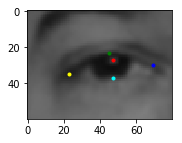

eyeGray: (80, 60)
15 _r 1.1 (0, 0)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 318 184
WH: 60 45.0
eyeXY: 318 184
eyeWH: 66 49


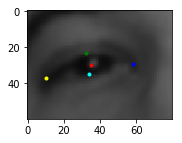

eyeGray: (80, 60)
XY: 410 179
WH: 66 49.5
eyeXY: 410 179
eyeWH: 73 54


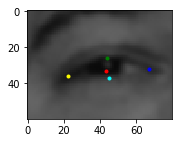

eyeGray: (80, 60)
16 _r 1.1 (0, 0)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 347 185
WH: 62 46.5
eyeXY: 347 185
eyeWH: 68 51


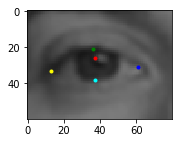

eyeGray: (80, 60)
XY: 450 188
WH: 67 50.25
eyeXY: 450 188
eyeWH: 74 55


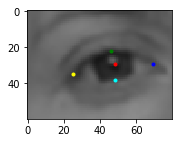

eyeGray: (80, 60)
17 _r 1.1 (0, 0)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 337 185
WH: 63 47.25
eyeXY: 337 185
eyeWH: 69 51


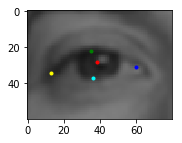

eyeGray: (80, 60)
XY: 439 189
WH: 68 51.0
eyeXY: 439 189
eyeWH: 75 56


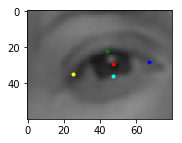

eyeGray: (80, 60)
18 _r 1.1 (0, 0)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 116 323
WH: 130 97.5
eyeXY: 116 323
eyeWH: 143 107


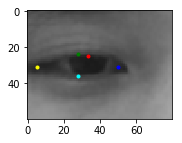

eyeGray: (80, 60)
XY: 319 337
WH: 125 93.75
eyeXY: 319 337
eyeWH: 138 103


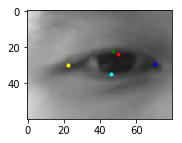

eyeGray: (80, 60)
19 _r 1.1 (0, 0)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 119 317
WH: 127 95.25
eyeXY: 119 317
eyeWH: 140 105


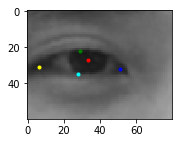

eyeGray: (80, 60)
XY: 321 329
WH: 125 93.75
eyeXY: 321 329
eyeWH: 138 103


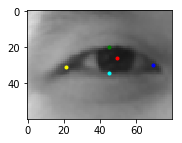

eyeGray: (80, 60)
20 _r 1.1 (0, 0)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 116 322
WH: 136 102.0
eyeXY: 116 322
eyeWH: 150 112


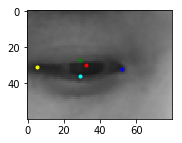

eyeGray: (80, 60)
XY: 314 337
WH: 133 99.75
eyeXY: 314 337
eyeWH: 146 109


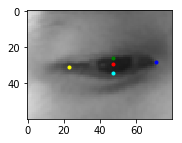

eyeGray: (80, 60)
21 _r 1.1 (0, 0)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 114 322
WH: 130 97.5
eyeXY: 114 322
eyeWH: 143 107


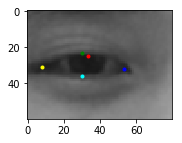

eyeGray: (80, 60)
XY: 318 335
WH: 129 96.75
eyeXY: 318 335
eyeWH: 142 106


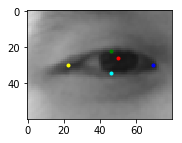

eyeGray: (80, 60)
22 _r 1.1 (0, 0)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 123 320
WH: 133 99.75
eyeXY: 123 320
eyeWH: 146 109


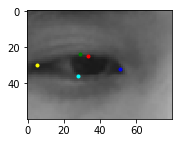

eyeGray: (80, 60)
XY: 322 334
WH: 129 96.75
eyeXY: 322 334
eyeWH: 142 106


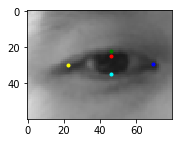

eyeGray: (80, 60)
1 _r 1.1 (-2, 2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 301 261
WH: 82 61.5
eyeXY: 301 261
eyeWH: 90 67


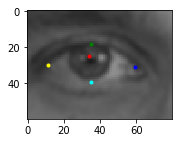

eyeGray: (80, 60)
XY: 439 266
WH: 78 58.5
eyeXY: 439 266
eyeWH: 86 64


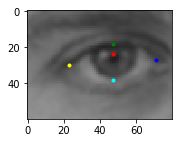

eyeGray: (80, 60)
2 _r 1.1 (-2, 2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 251 216
WH: 76 57.0
eyeXY: 251 216
eyeWH: 84 63


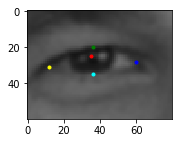

eyeGray: (80, 60)
XY: 387 216
WH: 66 49.5
eyeXY: 387 216
eyeWH: 73 54


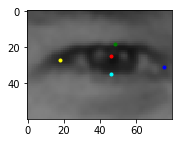

eyeGray: (80, 60)
3 _r 1.1 (-2, 2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 262 224
WH: 66 49.5
eyeXY: 262 224
eyeWH: 73 54


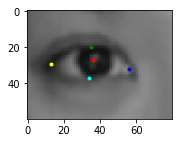

eyeGray: (80, 60)
XY: 365 221
WH: 63 47.25
eyeXY: 365 221
eyeWH: 69 51


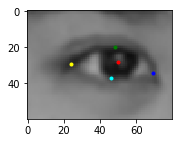

eyeGray: (80, 60)
4 _r 1.1 (-2, 2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 262 236
WH: 65 48.75
eyeXY: 262 236
eyeWH: 72 54


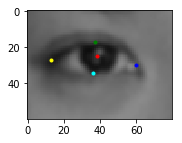

eyeGray: (80, 60)
XY: 370 234
WH: 63 47.25
eyeXY: 370 234
eyeWH: 69 51


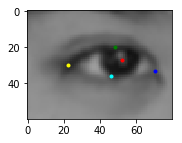

eyeGray: (80, 60)
5 _r 1.1 (-2, 2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 253 214
WH: 85 63.75
eyeXY: 253 214
eyeWH: 94 70


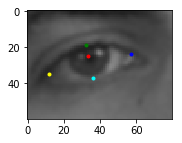

eyeGray: (80, 60)
XY: 395 197
WH: 90 67.5
eyeXY: 395 197
eyeWH: 99 74


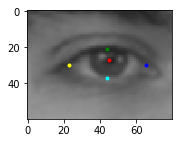

eyeGray: (80, 60)
6 _r 1.1 (-2, 2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 304 268
WH: 60 45.0
eyeXY: 304 268
eyeWH: 66 49


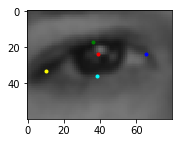

eyeGray: (80, 60)
XY: 417 250
WH: 65 48.75
eyeXY: 417 250
eyeWH: 72 54


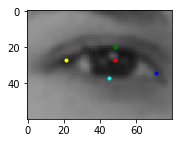

eyeGray: (80, 60)
7 _r 1.1 (-2, 2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 320 260
WH: 64 48.0
eyeXY: 320 260
eyeWH: 70 52


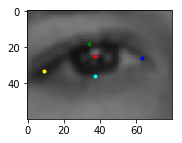

eyeGray: (80, 60)
XY: 434 245
WH: 67 50.25
eyeXY: 434 245
eyeWH: 74 55


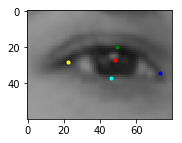

eyeGray: (80, 60)
8 _r 1.1 (-2, 2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 324 230
WH: 54 40.5
eyeXY: 324 230
eyeWH: 59 44


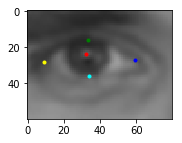

eyeGray: (80, 60)
XY: 420 220
WH: 52 39.0
eyeXY: 420 220
eyeWH: 57 42


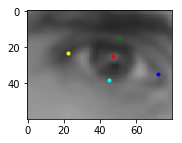

eyeGray: (80, 60)
9 _r 1.1 (-2, 2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 306 225
WH: 63 47.25
eyeXY: 306 225
eyeWH: 69 51


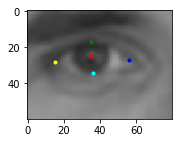

eyeGray: (80, 60)
XY: 406 219
WH: 52 39.0
eyeXY: 406 219
eyeWH: 57 42


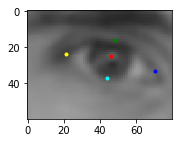

eyeGray: (80, 60)
10 _r 1.1 (-2, 2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 328 197
WH: 63 47.25
eyeXY: 328 197
eyeWH: 69 51


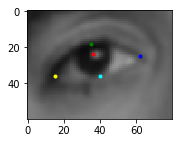

eyeGray: (80, 60)
XY: 427 182
WH: 64 48.0
eyeXY: 427 182
eyeWH: 70 52


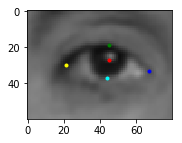

eyeGray: (80, 60)
11 _r 1.1 (-2, 2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 329 197
WH: 67 50.25
eyeXY: 329 197
eyeWH: 74 55


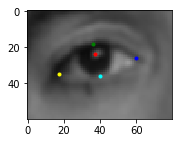

eyeGray: (80, 60)
XY: 431 186
WH: 65 48.75
eyeXY: 431 186
eyeWH: 72 54


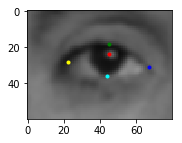

eyeGray: (80, 60)
12 _r 1.1 (-2, 2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 276 176
WH: 63 47.25
eyeXY: 276 176
eyeWH: 69 51


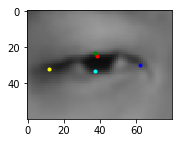

eyeGray: (80, 60)
XY: 371 166
WH: 71 53.25
eyeXY: 371 166
eyeWH: 78 58


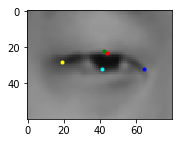

eyeGray: (80, 60)
13 _r 1.1 (-2, 2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 301 166
WH: 61 45.75
eyeXY: 301 166
eyeWH: 67 50


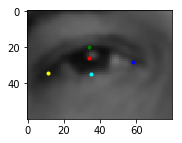

eyeGray: (80, 60)
XY: 403 159
WH: 66 49.5
eyeXY: 403 159
eyeWH: 73 54


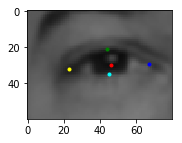

eyeGray: (80, 60)
14 _r 1.1 (-2, 2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 288 168
WH: 62 46.5
eyeXY: 288 168
eyeWH: 68 51


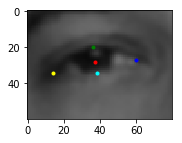

eyeGray: (80, 60)
XY: 391 162
WH: 64 48.0
eyeXY: 391 162
eyeWH: 70 52


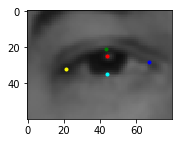

eyeGray: (80, 60)
15 _r 1.1 (-2, 2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 316 186
WH: 60 45.0
eyeXY: 316 186
eyeWH: 66 49


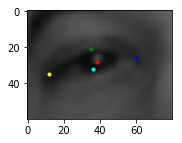

eyeGray: (80, 60)
XY: 408 181
WH: 66 49.5
eyeXY: 408 181
eyeWH: 73 54


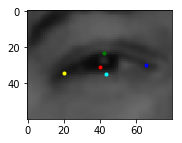

eyeGray: (80, 60)
16 _r 1.1 (-2, 2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 345 187
WH: 62 46.5
eyeXY: 345 187
eyeWH: 68 51


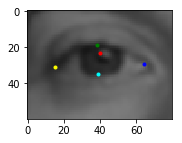

eyeGray: (80, 60)
XY: 448 190
WH: 67 50.25
eyeXY: 448 190
eyeWH: 74 55


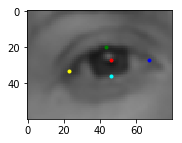

eyeGray: (80, 60)
17 _r 1.1 (-2, 2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 335 187
WH: 63 47.25
eyeXY: 335 187
eyeWH: 69 51


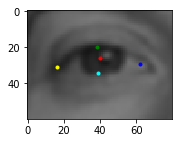

eyeGray: (80, 60)
XY: 437 191
WH: 68 51.0
eyeXY: 437 191
eyeWH: 75 56


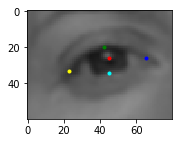

eyeGray: (80, 60)
18 _r 1.1 (-2, 2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 114 325
WH: 130 97.5
eyeXY: 114 325
eyeWH: 143 107


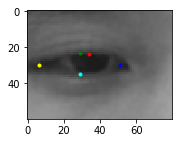

eyeGray: (80, 60)
XY: 317 339
WH: 125 93.75
eyeXY: 317 339
eyeWH: 138 103


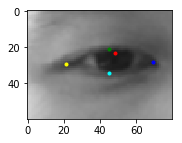

eyeGray: (80, 60)
19 _r 1.1 (-2, 2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 117 319
WH: 127 95.25
eyeXY: 117 319
eyeWH: 140 105


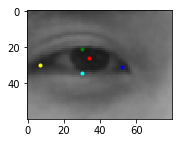

eyeGray: (80, 60)
XY: 319 331
WH: 125 93.75
eyeXY: 319 331
eyeWH: 138 103


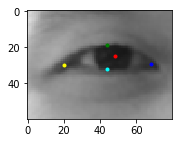

eyeGray: (80, 60)
20 _r 1.1 (-2, 2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 114 324
WH: 136 102.0
eyeXY: 114 324
eyeWH: 150 112


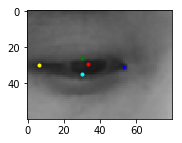

eyeGray: (80, 60)
XY: 312 339
WH: 133 99.75
eyeXY: 312 339
eyeWH: 146 109


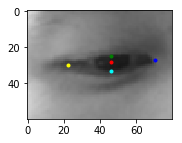

eyeGray: (80, 60)
21 _r 1.1 (-2, 2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 112 324
WH: 130 97.5
eyeXY: 112 324
eyeWH: 143 107


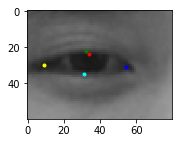

eyeGray: (80, 60)
XY: 316 337
WH: 129 96.75
eyeXY: 316 337
eyeWH: 142 106


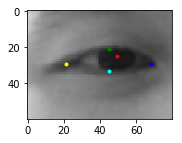

eyeGray: (80, 60)
22 _r 1.1 (-2, 2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 121 322
WH: 133 99.75
eyeXY: 121 322
eyeWH: 146 109


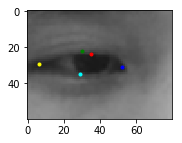

eyeGray: (80, 60)
XY: 320 336
WH: 129 96.75
eyeXY: 320 336
eyeWH: 142 106


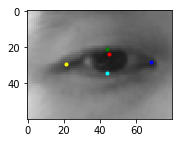

eyeGray: (80, 60)
1 _r 1.1 (2, 2)
eye: 2
303 259.5 82 61.5
441 264.5 78 58.5
XY: 305 261
WH: 82 61.5
eyeXY: 305 261
eyeWH: 90 67


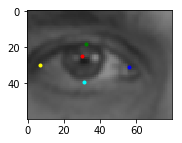

eyeGray: (80, 60)
XY: 443 266
WH: 78 58.5
eyeXY: 443 266
eyeWH: 86 64


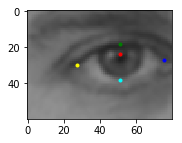

eyeGray: (80, 60)
2 _r 1.1 (2, 2)
eye: 2
253 214.0 76 57.0
389 214.5 66 49.5
XY: 255 216
WH: 76 57.0
eyeXY: 255 216
eyeWH: 84 63


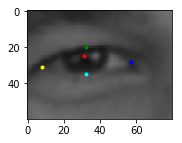

eyeGray: (80, 60)
XY: 391 216
WH: 66 49.5
eyeXY: 391 216
eyeWH: 73 54


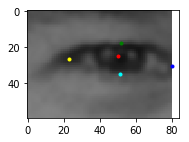

eyeGray: (80, 60)
3 _r 1.1 (2, 2)
eye: 2
264 222.5 66 49.5
367 219.75 63 47.25
XY: 266 224
WH: 66 49.5
eyeXY: 266 224
eyeWH: 73 54


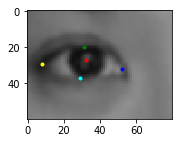

eyeGray: (80, 60)
XY: 369 221
WH: 63 47.25
eyeXY: 369 221
eyeWH: 69 51


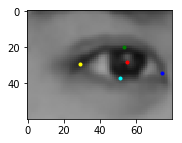

eyeGray: (80, 60)
4 _r 1.1 (2, 2)
eye: 2
264 234.25 65 48.75
372 232.75 63 47.25
XY: 266 236
WH: 65 48.75
eyeXY: 266 236
eyeWH: 72 54


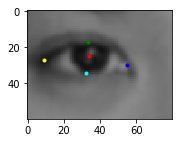

eyeGray: (80, 60)
XY: 374 234
WH: 63 47.25
eyeXY: 374 234
eyeWH: 69 51


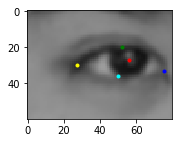

eyeGray: (80, 60)
5 _r 1.1 (2, 2)
eye: 2
255 212.25 85 63.75
397 195.5 90 67.5
XY: 257 214
WH: 85 63.75
eyeXY: 257 214
eyeWH: 94 70


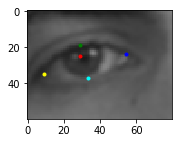

eyeGray: (80, 60)
XY: 399 197
WH: 90 67.5
eyeXY: 399 197
eyeWH: 99 74


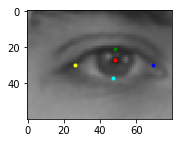

eyeGray: (80, 60)
6 _r 1.1 (2, 2)
eye: 2
306 266.0 60 45.0
419 248.25 65 48.75
XY: 308 268
WH: 60 45.0
eyeXY: 308 268
eyeWH: 66 49


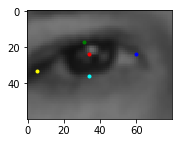

eyeGray: (80, 60)
XY: 421 250
WH: 65 48.75
eyeXY: 421 250
eyeWH: 72 54


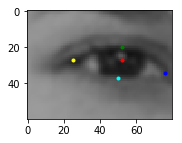

eyeGray: (80, 60)
7 _r 1.1 (2, 2)
eye: 2
322 258.0 64 48.0
436 243.75 67 50.25
XY: 324 260
WH: 64 48.0
eyeXY: 324 260
eyeWH: 70 52


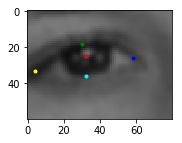

eyeGray: (80, 60)
XY: 438 245
WH: 67 50.25
eyeXY: 438 245
eyeWH: 74 55


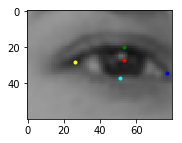

eyeGray: (80, 60)
8 _r 1.1 (2, 2)
eye: 2
326 228.5 54 40.5
422 218.0 52 39.0
XY: 328 230
WH: 54 40.5
eyeXY: 328 230
eyeWH: 59 44


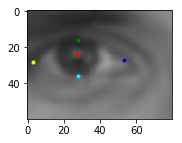

eyeGray: (80, 60)
XY: 424 220
WH: 52 39.0
eyeXY: 424 220
eyeWH: 57 42


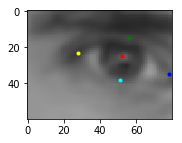

eyeGray: (80, 60)
9 _r 1.1 (2, 2)
eye: 2
308 223.75 63 47.25
408 217.0 52 39.0
XY: 310 225
WH: 63 47.25
eyeXY: 310 225
eyeWH: 69 51


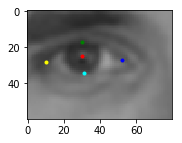

eyeGray: (80, 60)
XY: 410 219
WH: 52 39.0
eyeXY: 410 219
eyeWH: 57 42


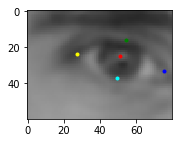

eyeGray: (80, 60)
10 _r 1.1 (2, 2)
eye: 2
330 195.75 63 47.25
429 180.0 64 48.0
XY: 332 197
WH: 63 47.25
eyeXY: 332 197
eyeWH: 69 51


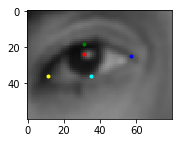

eyeGray: (80, 60)
XY: 431 182
WH: 64 48.0
eyeXY: 431 182
eyeWH: 70 52


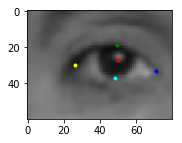

eyeGray: (80, 60)
11 _r 1.1 (2, 2)
eye: 2
331 195.75 67 50.25
433 184.25 65 48.75
XY: 333 197
WH: 67 50.25
eyeXY: 333 197
eyeWH: 74 55


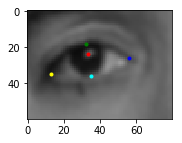

eyeGray: (80, 60)
XY: 435 186
WH: 65 48.75
eyeXY: 435 186
eyeWH: 72 54


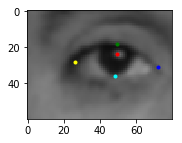

eyeGray: (80, 60)
12 _r 1.1 (2, 2)
eye: 3
278 174.75 63 47.25
373 164.75 71 53.25
XY: 280 176
WH: 63 47.25
eyeXY: 280 176
eyeWH: 69 51


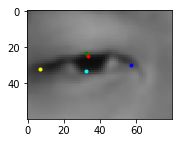

eyeGray: (80, 60)
XY: 375 166
WH: 71 53.25
eyeXY: 375 166
eyeWH: 78 58


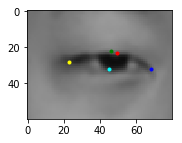

eyeGray: (80, 60)
13 _r 1.1 (2, 2)
eye: 2
303 164.25 61 45.75
405 157.5 66 49.5
XY: 305 166
WH: 61 45.75
eyeXY: 305 166
eyeWH: 67 50


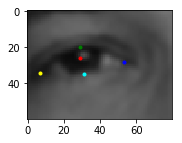

eyeGray: (80, 60)
XY: 407 159
WH: 66 49.5
eyeXY: 407 159
eyeWH: 73 54


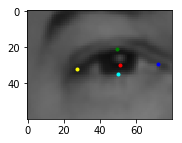

eyeGray: (80, 60)
14 _r 1.1 (2, 2)
eye: 2
290 166.5 62 46.5
393 160.0 64 48.0
XY: 292 168
WH: 62 46.5
eyeXY: 292 168
eyeWH: 68 51


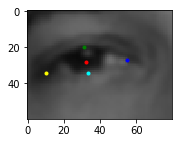

eyeGray: (80, 60)
XY: 395 162
WH: 64 48.0
eyeXY: 395 162
eyeWH: 70 52


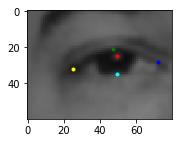

eyeGray: (80, 60)
15 _r 1.1 (2, 2)
eye: 2
318 184.0 60 45.0
410 179.5 66 49.5
XY: 320 186
WH: 60 45.0
eyeXY: 320 186
eyeWH: 66 49


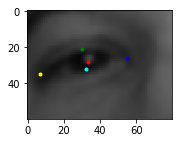

eyeGray: (80, 60)
XY: 412 181
WH: 66 49.5
eyeXY: 412 181
eyeWH: 73 54


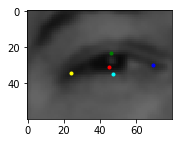

eyeGray: (80, 60)
16 _r 1.1 (2, 2)
eye: 2
347 185.5 62 46.5
450 188.75 67 50.25
XY: 349 187
WH: 62 46.5
eyeXY: 349 187
eyeWH: 68 51


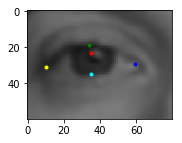

eyeGray: (80, 60)
XY: 452 190
WH: 67 50.25
eyeXY: 452 190
eyeWH: 74 55


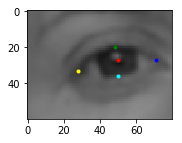

eyeGray: (80, 60)
17 _r 1.1 (2, 2)
eye: 2
337 185.75 63 47.25
439 189.0 68 51.0
XY: 339 187
WH: 63 47.25
eyeXY: 339 187
eyeWH: 69 51


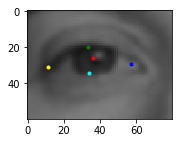

eyeGray: (80, 60)
XY: 441 191
WH: 68 51.0
eyeXY: 441 191
eyeWH: 75 56


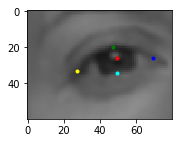

eyeGray: (80, 60)
18 _r 1.1 (2, 2)
eye: 2
116 323.5 130 97.5
319 337.25 125 93.75
XY: 118 325
WH: 130 97.5
eyeXY: 118 325
eyeWH: 143 107


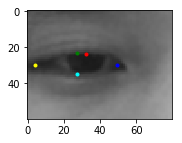

eyeGray: (80, 60)
XY: 321 339
WH: 125 93.75
eyeXY: 321 339
eyeWH: 138 103


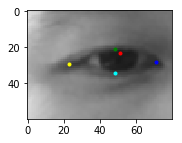

eyeGray: (80, 60)
19 _r 1.1 (2, 2)
eye: 2
119 317.75 127 95.25
321 329.25 125 93.75
XY: 121 319
WH: 127 95.25
eyeXY: 121 319
eyeWH: 140 105


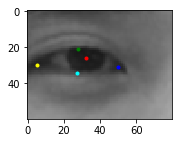

eyeGray: (80, 60)
XY: 323 331
WH: 125 93.75
eyeXY: 323 331
eyeWH: 138 103


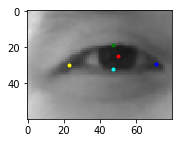

eyeGray: (80, 60)
20 _r 1.1 (2, 2)
eye: 2
116 322.0 136 102.0
314 337.25 133 99.75
XY: 118 324
WH: 136 102.0
eyeXY: 118 324
eyeWH: 150 112


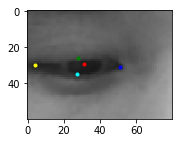

eyeGray: (80, 60)
XY: 316 339
WH: 133 99.75
eyeXY: 316 339
eyeWH: 146 109


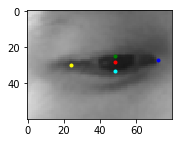

eyeGray: (80, 60)
21 _r 1.1 (2, 2)
eye: 2
114 322.5 130 97.5
318 335.25 129 96.75
XY: 116 324
WH: 130 97.5
eyeXY: 116 324
eyeWH: 143 107


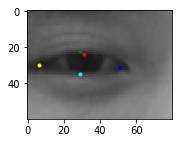

eyeGray: (80, 60)
XY: 320 337
WH: 129 96.75
eyeXY: 320 337
eyeWH: 142 106


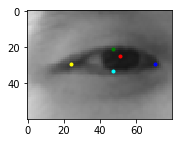

eyeGray: (80, 60)
22 _r 1.1 (2, 2)
eye: 2
123 320.25 133 99.75
322 334.25 129 96.75
XY: 125 322
WH: 133 99.75
eyeXY: 125 322
eyeWH: 146 109


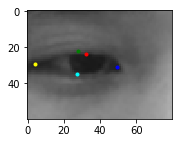

eyeGray: (80, 60)
XY: 324 336
WH: 129 96.75
eyeXY: 324 336
eyeWH: 142 106


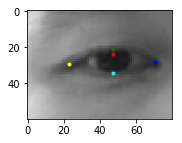

eyeGray: (80, 60)


In [4]:
for r in range(2):
    for z in range(3):
        for xy in range(5):
            for n in range(22):
                str_r = rs[r]
                zoom = zooms[z]
                offset = offsets[xy]
                print(n+1, str_r, zoom, offset)
                if n<9:
                    name = '../data/images/00' + str(n+1) + str_r
                else:
                    name = '../data/images/0' + str(n+1) + str_r
                flag = None
                flag = getFlag4Json(name + '.jpg.json')
                image = getImage(name + '.jpg')
                face = getFace4Image(name + '.jpg')
                eye = getEye4Image(name + '.jpg')
                
                eyeGray, eyeFlag = getEyeDataFlag(image, eye[0], flag, zoom=zoom, offset=offset, lr=0)
                if n<9:
                    name = '../data/eye/00' + str(n+1) + str_r + '_0_'
                else:
                    name = '../data/eye/0' + str(n+1) + str_r + '_0_'
                eyeGray.save(name + '_' + str(zoom) + '_' + str(xy) + '.jpg', 'JPEG')
                print('eyeGray:', eyeGray.size)
                eyeData = np.array(eyeGray)
                
                eyeData = eyeData.reshape(-1, int(EYE_W*EYE_H))
#                 print(len(eyeData))
#                 print(type(eyeData))
                label = []
                label.clear()
                if eyeFlag != None:
                    value_list = list(eyeFlag.values())
                    for i in range(5):
                        x = (value_list[i*2])/EYE_W
                        y = (value_list[i*2+1])/EYE_W
                        label.append(x)
                        label.append(y)
                img_string = ' '.join(str(s) for s in eyeData[0])
                data_list.append(img_string)
                label_list.append(label)
                
                eyeGray, eyeFlag = getEyeDataFlag(image, eye[1], flag, zoom=zoom, offset=offset, lr=1)
                if n<9:
                    name = '../data/eye/00' + str(n+1) + str_r + '_1_'
                else:
                    name = '../data/eye/0' + str(n+1) + str_r + '_1_'
                eyeGray.save(name + '_' + str(zoom) + '_' + str(xy) + '.jpg', 'JPEG')
                print('eyeGray:', eyeGray.size)
                eyeData = np.array(eyeGray)
                
                eyeData = eyeData.reshape(-1, int(EYE_W*EYE_H))
#                 print(len(eyeData))
#                 print(type(eyeData))
                label = []
                label.clear()
                if eyeFlag != None:
                    value_list = list(eyeFlag.values())
                    for i in range(5):
                        x = (value_list[i*2])/EYE_W
                        y = (value_list[i*2+1])/EYE_W
                        label.append(x)
                        label.append(y)
                img_string = ' '.join(str(s) for s in eyeData[0])
                data_list.append(img_string)
                label_list.append(label)
data2csv(data_list, label_list)


In [ ]:
# flag = getFlag4Json('../data/images/001.jpg.json')


# eye,x,y,w,h = getEye4Image('../data/images/001.jpg',zoom=(280,90))
# displayEye(eye, flag, x, y, w, h,zoom=(280,90))
# eye_lr = eye.transpose(Image.FLIP_LEFT_RIGHT)
# displayEye(eye_lr, flag, x, y, w, h,zoom=(280,90),transpose=True)

# eye,x,y,w,h = getEye4Image('../data/images/001.jpg',zoom=(300,100))
# displayEye(eye, flag, x, y, w, h,zoom=(300,100))

# eye,x,y,w,h = getEye4Image('../data/images/001.jpg',zoom=(320,110))
# displayEye(eye, flag, x, y, w, h,zoom=(320,110))


# # print(list(flag[0]))
# # print(list(flag[0].values()))
# # print(flag['ROX'])
# zoom = (300, 100)
# print(zoom[0])